In [2]:
# Clonar el repositorio completo
!git clone https://github.com/GuidoRiosCiaffaroni/Machine_learning_I.git

# Navegar al directorio específico
import os
# Imagenes
os.chdir('/content/Machine_learning_I/Dataset/Img_Pepper__bell___Bacterial_spot')
os.chdir('/content/Machine_learning_I/Dataset/Img_Potato___healthy')
os.chdir('/content/Machine_learning_I/Dataset/Img_Tomato__Tomato_mosaic_virus')

# Audios
os.chdir('/content/Machine_learning_I/Dataset/Animals_bird')
os.chdir('/content/Machine_learning_I/Dataset/Animals_cat')
os.chdir('/content/Machine_learning_I/Dataset/Animals_dog')

# CSV
os.chdir('/content/Machine_learning_I/Dataset/csv_Student_Depression_Dataset')
os.chdir('/content/Machine_learning_I/Dataset/csv_health_lifestyle_classification')

#TXT
os.chdir('/content/Machine_learning_I/Dataset/txt_Bible')



# Verificar los archivos
!ls -la

Cloning into 'Machine_learning_I'...
remote: Enumerating objects: 2232, done.
remote: Counting objects: 100% (78/78), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 2232 (delta 19), reused 73 (delta 14), pack-reused 2154 (from 1)
Receiving objects: 100% (2232/2232), 72.49 MiB | 22.65 MiB/s, done.
Resolving deltas: 100% (24/24), done.
Updating files: 100% (2143/2143), done.
total 7868
drwxr-xr-x  3 root root    4096 Oct 14 23:11 .
drwxr-xr-x 12 root root    4096 Oct 14 23:10 ..
-rw-r--r--  1 root root  582754 Oct 14 23:10 35895-0.txt
drwxr-xr-x  5 root root    4096 Oct 14 23:11 Machine_learning_I
-rw-r--r--  1 root root 4351848 Oct 14 23:10 pg10.txt
-rw-r--r--  1 root root 1555173 Oct 14 23:10 pg17.txt
-rw-r--r--  1 root root  417937 Oct 14 23:10 pg2680.txt
-rw-r--r--  1 root root 1126312 Oct 14 23:10 pg2800.txt


Instalación

In [3]:
!pip install opencv-python pillow plotly

# **Eda Imagenes**

Img_Pepper__bell___Bacterial_spot

 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE IMÁGENES
 EXPLORANDO ESTRUCTURA DEL DIRECTORIO
Img_Pepper__bell___Bacterial_spot/
  f409b53e-61e7-4aa5-8a6c-ae0f1c828099___JR_B.Spot 8955.JPG
  0c4e75b2-e4aa-437e-815c-636271d66bec___JR_B.Spot 3244.JPG
  179067a6-1012-4a23-8f09-e413300e9f32___NREC_B.Spot 9085.JPG
  795a0fc6-b2cc-41b8-b42b-88ce395b4186___NREC_B.Spot 1937.JPG
  65fc5138-b38a-42d6-a892-1441585ceebd___NREC_B.Spot 9057.JPG
  ... y 992 archivos más

 COLECTANDO ESTADÍSTICAS DE IMÁGENES
 Total de imágenes procesadas: 997

 ESTADÍSTICAS BÁSICAS DEL DATASET
Total de imágenes: 997
Total de clases: 1
Formatos de imagen: Counter({'JPEG': 997})
Modos de color: Counter({'RGB': 997})

 Estadísticas de dimensiones:
Ancho - Min: 256, Max: 256, Mean: 256.0
Alto - Min: 256, Max: 256, Mean: 256.0
Tamaño archivo - Min: 8.4KB, Max: 25.9KB, Mean: 17.7KB

 CREANDO VISUALIZACIONES


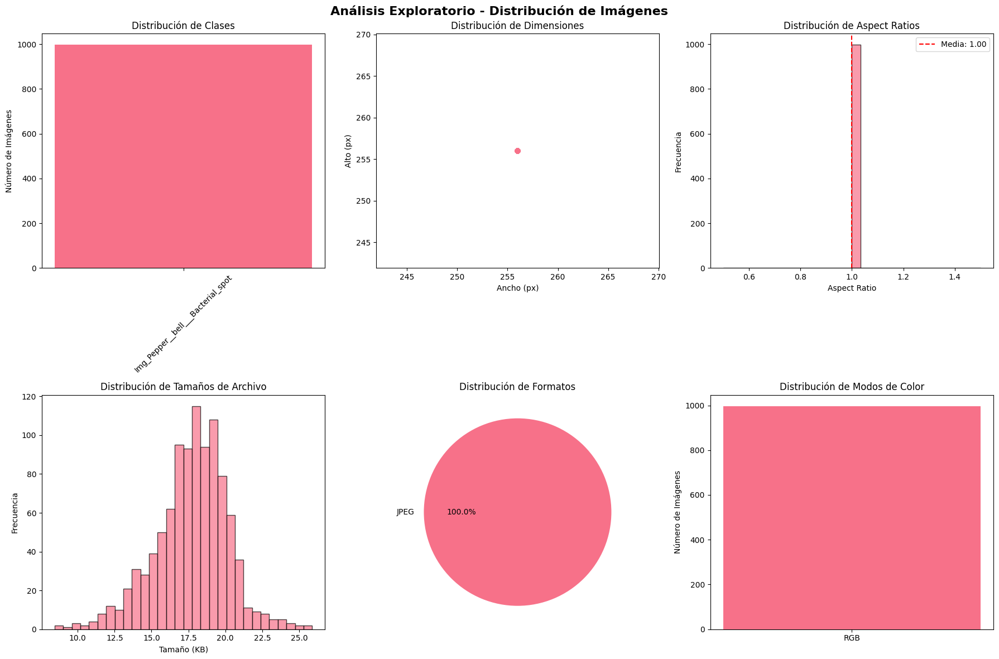


  MUESTRA DE 8 IMÁGENES ALEATORIAS


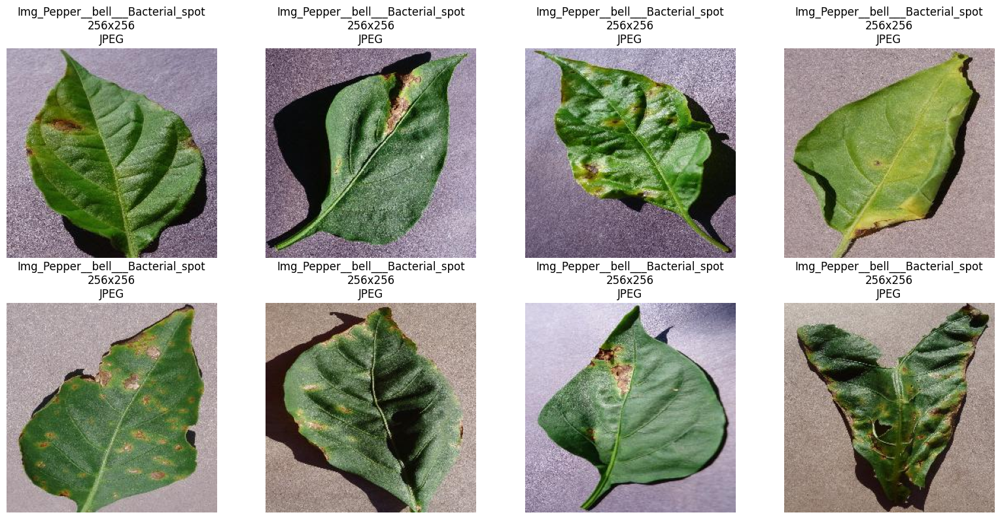


 REPORTE RESUMEN DEL EDA
 INFORMACIÓN GENERAL:
   • Total de imágenes: 997
   • Número de clases: 1
   • Clases encontradas: ['Img_Pepper__bell___Bacterial_spot']

 ESTADÍSTICAS DE DIMENSIONES:
   • Resolución más común: {'width': 256, 'height': 256}
   • Rango de ancho: 256 - 256 px
   • Rango de alto: 256 - 256 px
   • Aspect ratio promedio: 1.00

 INFORMACIÓN DE ARCHIVOS:
   • Tamaño promedio: 17.7 KB
   • Formatos: {'JPEG': 997}
   • Modos de color: {'RGB': 997}

 RECOMENDACIONES:
    Dataset relativamente balanceado
    Dimensiones consistentes

 ANÁLISIS COMPLETADO

 DataFrame disponible como 'stats_df' con 997 registros


In [4]:
# Script EDA para Dataset de Imágenes
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from collections import Counter
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Configuración inicial
plt.style.use('default')
sns.set_palette("husl")

class ImageEDA:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.image_data = []
        self.stats_df = None

    def explore_directory_structure(self):
        """Explora la estructura del directorio"""
        print(" EXPLORANDO ESTRUCTURA DEL DIRECTORIO")
        print("=" * 50)

        for root, dirs, files in os.walk(self.dataset_path):
            level = root.replace(self.dataset_path, '').count(os.sep)
            indent = ' ' * 2 * level
            print(f"{indent}{os.path.basename(root)}/")
            subindent = ' ' * 2 * (level + 1)
            for file in files[:5]:  # Muestra solo primeros 5 archivos
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                    print(f"{subindent}{file}")
            if len(files) > 5:
                print(f"{subindent}... y {len(files) - 5} archivos más")

    def collect_image_stats(self):
        """Recolecta estadísticas de todas las imágenes"""
        print("\n COLECTANDO ESTADÍSTICAS DE IMÁGENES")
        print("=" * 50)

        supported_formats = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')

        for root, dirs, files in os.walk(self.dataset_path):
            for file in files:
                if file.lower().endswith(supported_formats):
                    file_path = os.path.join(root, file)
                    try:
                        with Image.open(file_path) as img:
                            width, height = img.size
                            mode = img.mode
                            format_type = img.format

                        # Información adicional con OpenCV
                        cv_img = cv2.imread(file_path)
                        if cv_img is not None:
                            file_size = os.path.getsize(file_path) / 1024  # KB

                            self.image_data.append({
                                'file_path': file_path,
                                'file_name': file,
                                'width': width,
                                'height': height,
                                'aspect_ratio': round(width / height, 2),
                                'mode': mode,
                                'format': format_type,
                                'file_size_kb': round(file_size, 2),
                                'class': os.path.basename(root),
                                'channels': cv_img.shape[2] if len(cv_img.shape) == 3 else 1,
                                'total_pixels': width * height
                            })
                    except Exception as e:
                        print(f"Error procesando {file_path}: {e}")

        self.stats_df = pd.DataFrame(self.image_data)
        print(f" Total de imágenes procesadas: {len(self.stats_df)}")

    def basic_statistics(self):
        """Muestra estadísticas básicas del dataset"""
        print("\n ESTADÍSTICAS BÁSICAS DEL DATASET")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar")
            return

        print(f"Total de imágenes: {len(self.stats_df)}")
        print(f"Total de clases: {self.stats_df['class'].nunique()}")
        print(f"Formatos de imagen: {Counter(self.stats_df['format'])}")
        print(f"Modos de color: {Counter(self.stats_df['mode'])}")

        print("\n Estadísticas de dimensiones:")
        print(f"Ancho - Min: {self.stats_df['width'].min()}, Max: {self.stats_df['width'].max()}, Mean: {self.stats_df['width'].mean():.1f}")
        print(f"Alto - Min: {self.stats_df['height'].min()}, Max: {self.stats_df['height'].max()}, Mean: {self.stats_df['height'].mean():.1f}")
        print(f"Tamaño archivo - Min: {self.stats_df['file_size_kb'].min():.1f}KB, Max: {self.stats_df['file_size_kb'].max():.1f}KB, Mean: {self.stats_df['file_size_kb'].mean():.1f}KB")

    def visualize_distributions(self):
        """Crea visualizaciones de las distribuciones"""
        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para visualizar")
            return

        print("\n CREANDO VISUALIZACIONES")
        print("=" * 50)

        # Configurar subplots
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle('Análisis Exploratorio - Distribución de Imágenes', fontsize=16, fontweight='bold')

        # 1. Distribución de clases
        class_dist = self.stats_df['class'].value_counts()
        axes[0,0].bar(class_dist.index, class_dist.values)
        axes[0,0].set_title('Distribución de Clases')
        axes[0,0].tick_params(axis='x', rotation=45)
        axes[0,0].set_ylabel('Número de Imágenes')

        # 2. Distribución de dimensiones (scatter plot)
        axes[0,1].scatter(self.stats_df['width'], self.stats_df['height'], alpha=0.6)
        axes[0,1].set_xlabel('Ancho (px)')
        axes[0,1].set_ylabel('Alto (px)')
        axes[0,1].set_title('Distribución de Dimensiones')

        # 3. Distribución de aspect ratios
        axes[0,2].hist(self.stats_df['aspect_ratio'], bins=30, alpha=0.7, edgecolor='black')
        axes[0,2].set_xlabel('Aspect Ratio')
        axes[0,2].set_ylabel('Frecuencia')
        axes[0,2].set_title('Distribución de Aspect Ratios')
        axes[0,2].axvline(self.stats_df['aspect_ratio'].mean(), color='red', linestyle='--', label=f'Media: {self.stats_df["aspect_ratio"].mean():.2f}')
        axes[0,2].legend()

        # 4. Distribución de tamaños de archivo
        axes[1,0].hist(self.stats_df['file_size_kb'], bins=30, alpha=0.7, edgecolor='black')
        axes[1,0].set_xlabel('Tamaño (KB)')
        axes[1,0].set_ylabel('Frecuencia')
        axes[1,0].set_title('Distribución de Tamaños de Archivo')

        # 5. Distribución de formatos
        format_dist = self.stats_df['format'].value_counts()
        axes[1,1].pie(format_dist.values, labels=format_dist.index, autopct='%1.1f%%')
        axes[1,1].set_title('Distribución de Formatos')

        # 6. Distribución de modos de color
        mode_dist = self.stats_df['mode'].value_counts()
        axes[1,2].bar(mode_dist.index, mode_dist.values)
        axes[1,2].set_title('Distribución de Modos de Color')
        axes[1,2].set_ylabel('Número de Imágenes')

        plt.tight_layout()
        plt.show()

    def display_sample_images(self, n_samples=8):
        """Muestra una muestra de imágenes del dataset"""
        print(f"\n  MUESTRA DE {n_samples} IMÁGENES ALEATORIAS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay imágenes para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        axes = axes.ravel()

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            if idx >= len(axes):
                break

            try:
                img = Image.open(row['file_path'])
                axes[idx].imshow(img)
                axes[idx].set_title(f"{row['class']}\n{row['width']}x{row['height']}\n{row['format']}")
                axes[idx].axis('off')
            except Exception as e:
                print(f"Error mostrando imagen {row['file_path']}: {e}")
                axes[idx].axis('off')

        # Ocultar ejes sobrantes
        for idx in range(len(sample_df), len(axes)):
            axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para generar reporte")
            return

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Total de imágenes: {len(self.stats_df)}")
        print(f"   • Número de clases: {self.stats_df['class'].nunique()}")
        print(f"   • Clases encontradas: {list(self.stats_df['class'].unique())}")

        print("\n ESTADÍSTICAS DE DIMENSIONES:")
        print(f"   • Resolución más común: {self.stats_df[['width', 'height']].mode().iloc[0].to_dict()}")
        print(f"   • Rango de ancho: {self.stats_df['width'].min()} - {self.stats_df['width'].max()} px")
        print(f"   • Rango de alto: {self.stats_df['height'].min()} - {self.stats_df['height'].max()} px")
        print(f"   • Aspect ratio promedio: {self.stats_df['aspect_ratio'].mean():.2f}")

        print("\n INFORMACIÓN DE ARCHIVOS:")
        print(f"   • Tamaño promedio: {self.stats_df['file_size_kb'].mean():.1f} KB")
        print(f"   • Formatos: {dict(Counter(self.stats_df['format']))}")
        print(f"   • Modos de color: {dict(Counter(self.stats_df['mode']))}")

        print("\n RECOMENDACIONES:")

        # Análisis de balance de clases
        class_counts = self.stats_df['class'].value_counts()
        imbalance_ratio = class_counts.max() / class_counts.min()

        if imbalance_ratio > 5:
            print("     Dataset desbalanceado - considerar técnicas de balanceo")
        else:
            print("    Dataset relativamente balanceado")

        # Verificar consistencia de dimensiones
        dimension_std = self.stats_df[['width', 'height']].std()
        if dimension_std['width'] > 100 or dimension_std['height'] > 100:
            print("     Alta variabilidad en dimensiones - considerar resizing")
        else:
            print("    Dimensiones consistentes")

        # Verificar formatos soportados
        unusual_formats = set(self.stats_df['format']) - {'JPEG', 'PNG', 'BMP'}
        if unusual_formats:
            print(f"     Formatos inusuales detectados: {unusual_formats}")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE IMÁGENES")
        print("=" * 60)

        self.explore_directory_structure()
        self.collect_image_stats()
        self.basic_statistics()
        self.visualize_distributions()
        self.display_sample_images()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.stats_df

# USO DEL SCRIPT
if __name__ == "__main__":
    # Configura tu path aquí
    dataset_path = "/content/Machine_learning_I/Dataset/Img_Pepper__bell___Bacterial_spot"  # Cambia por tu path

    # Crear instancia y ejecutar análisis
    eda = ImageEDA(dataset_path)
    stats_df = eda.run_complete_analysis()

    # El DataFrame con las estadísticas queda disponible para análisis adicional
    print(f"\n DataFrame disponible como 'stats_df' con {len(stats_df)} registros")

Img_Poptao__healthy

 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE IMÁGENES
 EXPLORANDO ESTRUCTURA DEL DIRECTORIO
Img_Potato___healthy/
  52dd2fdd-6966-450c-a42b-ee14428d4271___RS_HL 1955.JPG
  dbe4f332-9189-4b76-b30c-f0c9a55e48d3___RS_HL 1841.JPG
  61b8a692-91d8-40f5-a4a4-4d910875a638___RS_HL 1966.JPG
  31a09d39-6791-4ecb-8f44-af2ed85dbd33___RS_HL 1970.JPG
  5e19b1f4-fd65-4c4d-bcd2-18c8c519eddb___RS_HL 1965.JPG
  ... y 147 archivos más

 COLECTANDO ESTADÍSTICAS DE IMÁGENES
 Total de imágenes procesadas: 152

 ESTADÍSTICAS BÁSICAS DEL DATASET
Total de imágenes: 152
Total de clases: 1
Formatos de imagen: Counter({'JPEG': 152})
Modos de color: Counter({'RGB': 152})

 Estadísticas de dimensiones:
Ancho - Min: 256, Max: 256, Mean: 256.0
Alto - Min: 256, Max: 256, Mean: 256.0
Tamaño archivo - Min: 11.8KB, Max: 24.0KB, Mean: 19.6KB

 CREANDO VISUALIZACIONES


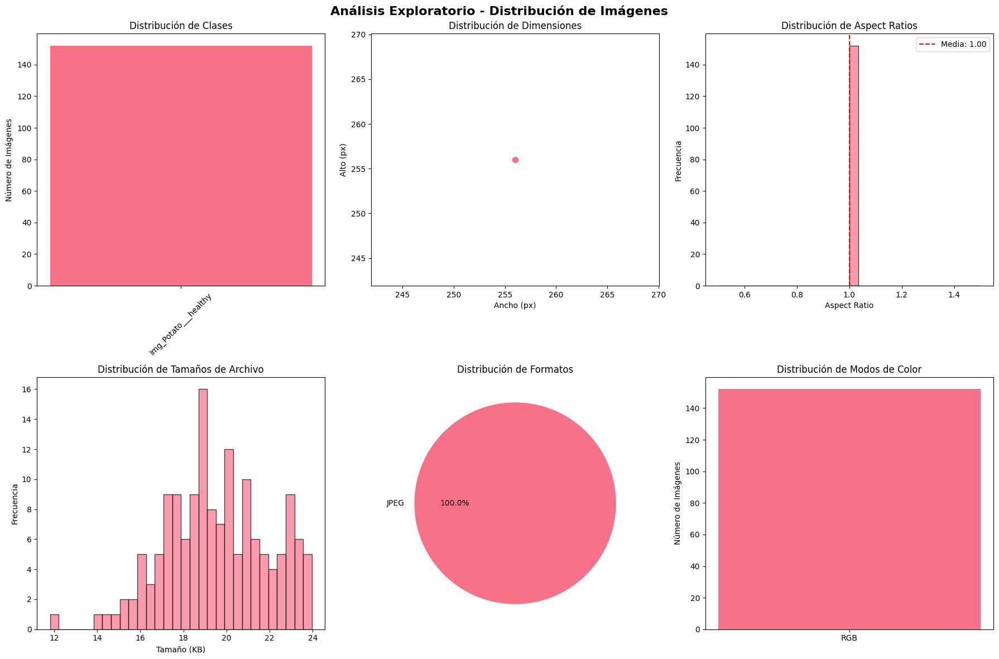


  MUESTRA DE 8 IMÁGENES ALEATORIAS


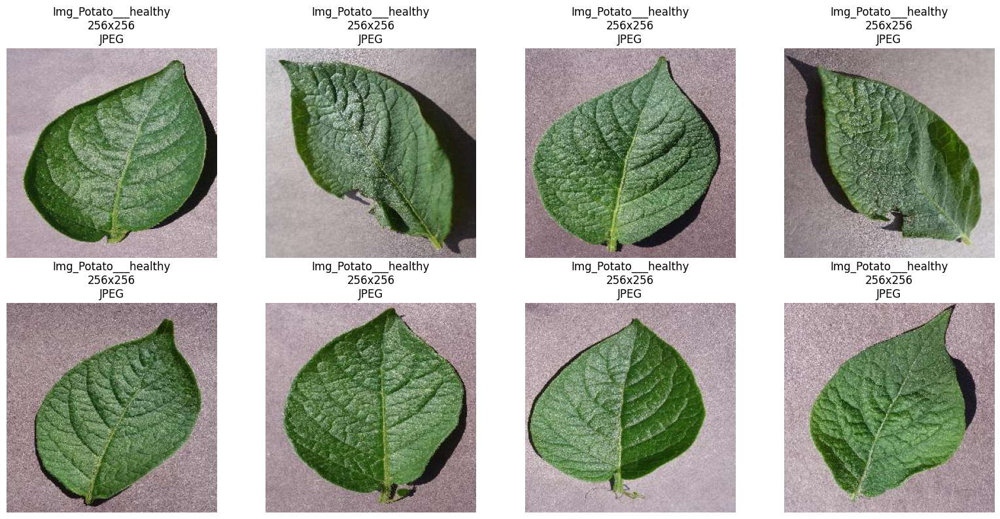


 REPORTE RESUMEN DEL EDA
 INFORMACIÓN GENERAL:
   • Total de imágenes: 152
   • Número de clases: 1
   • Clases encontradas: ['Img_Potato___healthy']

 ESTADÍSTICAS DE DIMENSIONES:
   • Resolución más común: {'width': 256, 'height': 256}
   • Rango de ancho: 256 - 256 px
   • Rango de alto: 256 - 256 px
   • Aspect ratio promedio: 1.00

 INFORMACIÓN DE ARCHIVOS:
   • Tamaño promedio: 19.6 KB
   • Formatos: {'JPEG': 152}
   • Modos de color: {'RGB': 152}

 RECOMENDACIONES:
    Dataset relativamente balanceado
    Dimensiones consistentes

 ANÁLISIS COMPLETADO

 DataFrame disponible como 'stats_df' con 152 registros


In [5]:
# Script EDA para Dataset de Imágenes
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from collections import Counter
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Configuración inicial
plt.style.use('default')
sns.set_palette("husl")

class ImageEDA:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.image_data = []
        self.stats_df = None

    def explore_directory_structure(self):
        """Explora la estructura del directorio"""
        print(" EXPLORANDO ESTRUCTURA DEL DIRECTORIO")
        print("=" * 50)

        for root, dirs, files in os.walk(self.dataset_path):
            level = root.replace(self.dataset_path, '').count(os.sep)
            indent = ' ' * 2 * level
            print(f"{indent}{os.path.basename(root)}/")
            subindent = ' ' * 2 * (level + 1)
            for file in files[:5]:  # Muestra solo primeros 5 archivos
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                    print(f"{subindent}{file}")
            if len(files) > 5:
                print(f"{subindent}... y {len(files) - 5} archivos más")

    def collect_image_stats(self):
        """Recolecta estadísticas de todas las imágenes"""
        print("\n COLECTANDO ESTADÍSTICAS DE IMÁGENES")
        print("=" * 50)

        supported_formats = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')

        for root, dirs, files in os.walk(self.dataset_path):
            for file in files:
                if file.lower().endswith(supported_formats):
                    file_path = os.path.join(root, file)
                    try:
                        with Image.open(file_path) as img:
                            width, height = img.size
                            mode = img.mode
                            format_type = img.format

                        # Información adicional con OpenCV
                        cv_img = cv2.imread(file_path)
                        if cv_img is not None:
                            file_size = os.path.getsize(file_path) / 1024  # KB

                            self.image_data.append({
                                'file_path': file_path,
                                'file_name': file,
                                'width': width,
                                'height': height,
                                'aspect_ratio': round(width / height, 2),
                                'mode': mode,
                                'format': format_type,
                                'file_size_kb': round(file_size, 2),
                                'class': os.path.basename(root),
                                'channels': cv_img.shape[2] if len(cv_img.shape) == 3 else 1,
                                'total_pixels': width * height
                            })
                    except Exception as e:
                        print(f"Error procesando {file_path}: {e}")

        self.stats_df = pd.DataFrame(self.image_data)
        print(f" Total de imágenes procesadas: {len(self.stats_df)}")

    def basic_statistics(self):
        """Muestra estadísticas básicas del dataset"""
        print("\n ESTADÍSTICAS BÁSICAS DEL DATASET")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar")
            return

        print(f"Total de imágenes: {len(self.stats_df)}")
        print(f"Total de clases: {self.stats_df['class'].nunique()}")
        print(f"Formatos de imagen: {Counter(self.stats_df['format'])}")
        print(f"Modos de color: {Counter(self.stats_df['mode'])}")

        print("\n Estadísticas de dimensiones:")
        print(f"Ancho - Min: {self.stats_df['width'].min()}, Max: {self.stats_df['width'].max()}, Mean: {self.stats_df['width'].mean():.1f}")
        print(f"Alto - Min: {self.stats_df['height'].min()}, Max: {self.stats_df['height'].max()}, Mean: {self.stats_df['height'].mean():.1f}")
        print(f"Tamaño archivo - Min: {self.stats_df['file_size_kb'].min():.1f}KB, Max: {self.stats_df['file_size_kb'].max():.1f}KB, Mean: {self.stats_df['file_size_kb'].mean():.1f}KB")

    def visualize_distributions(self):
        """Crea visualizaciones de las distribuciones"""
        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para visualizar")
            return

        print("\n CREANDO VISUALIZACIONES")
        print("=" * 50)

        # Configurar subplots
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle('Análisis Exploratorio - Distribución de Imágenes', fontsize=16, fontweight='bold')

        # 1. Distribución de clases
        class_dist = self.stats_df['class'].value_counts()
        axes[0,0].bar(class_dist.index, class_dist.values)
        axes[0,0].set_title('Distribución de Clases')
        axes[0,0].tick_params(axis='x', rotation=45)
        axes[0,0].set_ylabel('Número de Imágenes')

        # 2. Distribución de dimensiones (scatter plot)
        axes[0,1].scatter(self.stats_df['width'], self.stats_df['height'], alpha=0.6)
        axes[0,1].set_xlabel('Ancho (px)')
        axes[0,1].set_ylabel('Alto (px)')
        axes[0,1].set_title('Distribución de Dimensiones')

        # 3. Distribución de aspect ratios
        axes[0,2].hist(self.stats_df['aspect_ratio'], bins=30, alpha=0.7, edgecolor='black')
        axes[0,2].set_xlabel('Aspect Ratio')
        axes[0,2].set_ylabel('Frecuencia')
        axes[0,2].set_title('Distribución de Aspect Ratios')
        axes[0,2].axvline(self.stats_df['aspect_ratio'].mean(), color='red', linestyle='--', label=f'Media: {self.stats_df["aspect_ratio"].mean():.2f}')
        axes[0,2].legend()

        # 4. Distribución de tamaños de archivo
        axes[1,0].hist(self.stats_df['file_size_kb'], bins=30, alpha=0.7, edgecolor='black')
        axes[1,0].set_xlabel('Tamaño (KB)')
        axes[1,0].set_ylabel('Frecuencia')
        axes[1,0].set_title('Distribución de Tamaños de Archivo')

        # 5. Distribución de formatos
        format_dist = self.stats_df['format'].value_counts()
        axes[1,1].pie(format_dist.values, labels=format_dist.index, autopct='%1.1f%%')
        axes[1,1].set_title('Distribución de Formatos')

        # 6. Distribución de modos de color
        mode_dist = self.stats_df['mode'].value_counts()
        axes[1,2].bar(mode_dist.index, mode_dist.values)
        axes[1,2].set_title('Distribución de Modos de Color')
        axes[1,2].set_ylabel('Número de Imágenes')

        plt.tight_layout()
        plt.show()

    def display_sample_images(self, n_samples=8):
        """Muestra una muestra de imágenes del dataset"""
        print(f"\n  MUESTRA DE {n_samples} IMÁGENES ALEATORIAS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay imágenes para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        axes = axes.ravel()

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            if idx >= len(axes):
                break

            try:
                img = Image.open(row['file_path'])
                axes[idx].imshow(img)
                axes[idx].set_title(f"{row['class']}\n{row['width']}x{row['height']}\n{row['format']}")
                axes[idx].axis('off')
            except Exception as e:
                print(f"Error mostrando imagen {row['file_path']}: {e}")
                axes[idx].axis('off')

        # Ocultar ejes sobrantes
        for idx in range(len(sample_df), len(axes)):
            axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para generar reporte")
            return

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Total de imágenes: {len(self.stats_df)}")
        print(f"   • Número de clases: {self.stats_df['class'].nunique()}")
        print(f"   • Clases encontradas: {list(self.stats_df['class'].unique())}")

        print("\n ESTADÍSTICAS DE DIMENSIONES:")
        print(f"   • Resolución más común: {self.stats_df[['width', 'height']].mode().iloc[0].to_dict()}")
        print(f"   • Rango de ancho: {self.stats_df['width'].min()} - {self.stats_df['width'].max()} px")
        print(f"   • Rango de alto: {self.stats_df['height'].min()} - {self.stats_df['height'].max()} px")
        print(f"   • Aspect ratio promedio: {self.stats_df['aspect_ratio'].mean():.2f}")

        print("\n INFORMACIÓN DE ARCHIVOS:")
        print(f"   • Tamaño promedio: {self.stats_df['file_size_kb'].mean():.1f} KB")
        print(f"   • Formatos: {dict(Counter(self.stats_df['format']))}")
        print(f"   • Modos de color: {dict(Counter(self.stats_df['mode']))}")

        print("\n RECOMENDACIONES:")

        # Análisis de balance de clases
        class_counts = self.stats_df['class'].value_counts()
        imbalance_ratio = class_counts.max() / class_counts.min()

        if imbalance_ratio > 5:
            print("     Dataset desbalanceado - considerar técnicas de balanceo")
        else:
            print("    Dataset relativamente balanceado")

        # Verificar consistencia de dimensiones
        dimension_std = self.stats_df[['width', 'height']].std()
        if dimension_std['width'] > 100 or dimension_std['height'] > 100:
            print("     Alta variabilidad en dimensiones - considerar resizing")
        else:
            print("    Dimensiones consistentes")

        # Verificar formatos soportados
        unusual_formats = set(self.stats_df['format']) - {'JPEG', 'PNG', 'BMP'}
        if unusual_formats:
            print(f"     Formatos inusuales detectados: {unusual_formats}")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE IMÁGENES")
        print("=" * 60)

        self.explore_directory_structure()
        self.collect_image_stats()
        self.basic_statistics()
        self.visualize_distributions()
        self.display_sample_images()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.stats_df

# USO DEL SCRIPT
if __name__ == "__main__":
    # Configura tu path aquí
    dataset_path = "/content/Machine_learning_I/Dataset/Img_Potato___healthy"  # Cambia por tu path

    # Crear instancia y ejecutar análisis
    eda = ImageEDA(dataset_path)
    stats_df = eda.run_complete_analysis()

    # El DataFrame con las estadísticas queda disponible para análisis adicional
    print(f"\n DataFrame disponible como 'stats_df' con {len(stats_df)} registros")

Img_Tomato__Tomato_mosaic_virus

 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE IMÁGENES
 EXPLORANDO ESTRUCTURA DEL DIRECTORIO
Img_Tomato__Tomato_mosaic_virus/
  119554ae-c777-46da-abb7-591404fdc65f___PSU_CG 2393.JPG
  f90809d6-8b8d-4a7d-81df-c0d708ed9bb4___PSU_CG 2176.JPG
  efc00b83-9c44-48f5-b6ff-3acc4f5b0875___PSU_CG 2345.JPG
  860780b3-9c8b-4f90-9010-ac255e953784___PSU_CG 2150.JPG
  39dc536a-03ba-4e34-9ade-9618715f4b96___PSU_CG 2106.JPG
  ... y 368 archivos más

 COLECTANDO ESTADÍSTICAS DE IMÁGENES
 Total de imágenes procesadas: 373

 ESTADÍSTICAS BÁSICAS DEL DATASET
Total de imágenes: 373
Total de clases: 1
Formatos de imagen: Counter({'JPEG': 373})
Modos de color: Counter({'RGB': 373})

 Estadísticas de dimensiones:
Ancho - Min: 256, Max: 256, Mean: 256.0
Alto - Min: 256, Max: 256, Mean: 256.0
Tamaño archivo - Min: 11.4KB, Max: 24.4KB, Mean: 18.5KB

 CREANDO VISUALIZACIONES


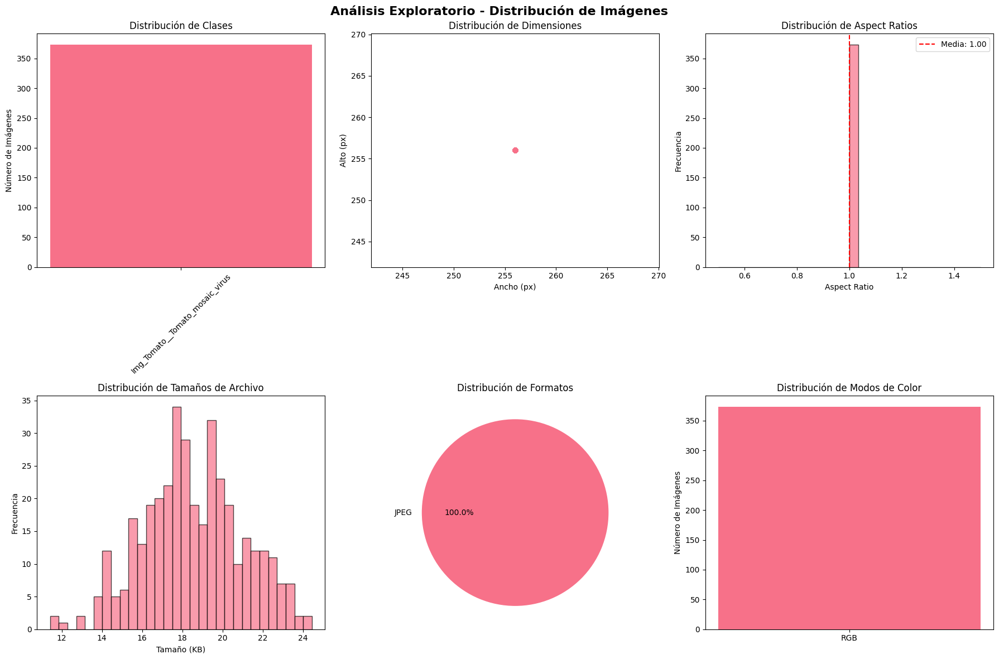


  MUESTRA DE 8 IMÁGENES ALEATORIAS


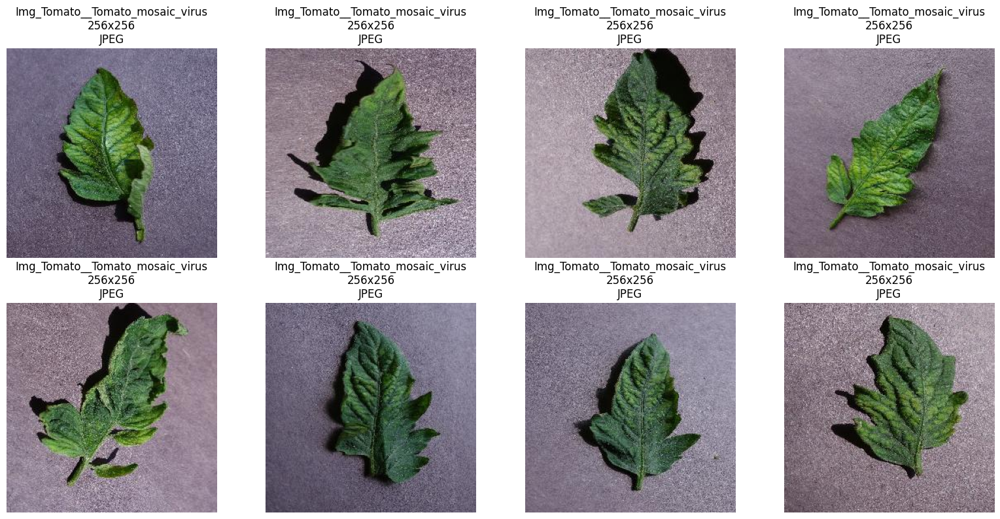


 REPORTE RESUMEN DEL EDA
 INFORMACIÓN GENERAL:
   • Total de imágenes: 373
   • Número de clases: 1
   • Clases encontradas: ['Img_Tomato__Tomato_mosaic_virus']

 ESTADÍSTICAS DE DIMENSIONES:
   • Resolución más común: {'width': 256, 'height': 256}
   • Rango de ancho: 256 - 256 px
   • Rango de alto: 256 - 256 px
   • Aspect ratio promedio: 1.00

 INFORMACIÓN DE ARCHIVOS:
   • Tamaño promedio: 18.5 KB
   • Formatos: {'JPEG': 373}
   • Modos de color: {'RGB': 373}

 RECOMENDACIONES:
    Dataset relativamente balanceado
    Dimensiones consistentes

 ANÁLISIS COMPLETADO

 DataFrame disponible como 'stats_df' con 373 registros


In [6]:
# Script EDA para Dataset de Imágenes
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from collections import Counter
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Configuración inicial
plt.style.use('default')
sns.set_palette("husl")

class ImageEDA:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.image_data = []
        self.stats_df = None

    def explore_directory_structure(self):
        """Explora la estructura del directorio"""
        print(" EXPLORANDO ESTRUCTURA DEL DIRECTORIO")
        print("=" * 50)

        for root, dirs, files in os.walk(self.dataset_path):
            level = root.replace(self.dataset_path, '').count(os.sep)
            indent = ' ' * 2 * level
            print(f"{indent}{os.path.basename(root)}/")
            subindent = ' ' * 2 * (level + 1)
            for file in files[:5]:  # Muestra solo primeros 5 archivos
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                    print(f"{subindent}{file}")
            if len(files) > 5:
                print(f"{subindent}... y {len(files) - 5} archivos más")

    def collect_image_stats(self):
        """Recolecta estadísticas de todas las imágenes"""
        print("\n COLECTANDO ESTADÍSTICAS DE IMÁGENES")
        print("=" * 50)

        supported_formats = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')

        for root, dirs, files in os.walk(self.dataset_path):
            for file in files:
                if file.lower().endswith(supported_formats):
                    file_path = os.path.join(root, file)
                    try:
                        with Image.open(file_path) as img:
                            width, height = img.size
                            mode = img.mode
                            format_type = img.format

                        # Información adicional con OpenCV
                        cv_img = cv2.imread(file_path)
                        if cv_img is not None:
                            file_size = os.path.getsize(file_path) / 1024  # KB

                            self.image_data.append({
                                'file_path': file_path,
                                'file_name': file,
                                'width': width,
                                'height': height,
                                'aspect_ratio': round(width / height, 2),
                                'mode': mode,
                                'format': format_type,
                                'file_size_kb': round(file_size, 2),
                                'class': os.path.basename(root),
                                'channels': cv_img.shape[2] if len(cv_img.shape) == 3 else 1,
                                'total_pixels': width * height
                            })
                    except Exception as e:
                        print(f"Error procesando {file_path}: {e}")

        self.stats_df = pd.DataFrame(self.image_data)
        print(f" Total de imágenes procesadas: {len(self.stats_df)}")

    def basic_statistics(self):
        """Muestra estadísticas básicas del dataset"""
        print("\n ESTADÍSTICAS BÁSICAS DEL DATASET")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar")
            return

        print(f"Total de imágenes: {len(self.stats_df)}")
        print(f"Total de clases: {self.stats_df['class'].nunique()}")
        print(f"Formatos de imagen: {Counter(self.stats_df['format'])}")
        print(f"Modos de color: {Counter(self.stats_df['mode'])}")

        print("\n Estadísticas de dimensiones:")
        print(f"Ancho - Min: {self.stats_df['width'].min()}, Max: {self.stats_df['width'].max()}, Mean: {self.stats_df['width'].mean():.1f}")
        print(f"Alto - Min: {self.stats_df['height'].min()}, Max: {self.stats_df['height'].max()}, Mean: {self.stats_df['height'].mean():.1f}")
        print(f"Tamaño archivo - Min: {self.stats_df['file_size_kb'].min():.1f}KB, Max: {self.stats_df['file_size_kb'].max():.1f}KB, Mean: {self.stats_df['file_size_kb'].mean():.1f}KB")

    def visualize_distributions(self):
        """Crea visualizaciones de las distribuciones"""
        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para visualizar")
            return

        print("\n CREANDO VISUALIZACIONES")
        print("=" * 50)

        # Configurar subplots
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle('Análisis Exploratorio - Distribución de Imágenes', fontsize=16, fontweight='bold')

        # 1. Distribución de clases
        class_dist = self.stats_df['class'].value_counts()
        axes[0,0].bar(class_dist.index, class_dist.values)
        axes[0,0].set_title('Distribución de Clases')
        axes[0,0].tick_params(axis='x', rotation=45)
        axes[0,0].set_ylabel('Número de Imágenes')

        # 2. Distribución de dimensiones (scatter plot)
        axes[0,1].scatter(self.stats_df['width'], self.stats_df['height'], alpha=0.6)
        axes[0,1].set_xlabel('Ancho (px)')
        axes[0,1].set_ylabel('Alto (px)')
        axes[0,1].set_title('Distribución de Dimensiones')

        # 3. Distribución de aspect ratios
        axes[0,2].hist(self.stats_df['aspect_ratio'], bins=30, alpha=0.7, edgecolor='black')
        axes[0,2].set_xlabel('Aspect Ratio')
        axes[0,2].set_ylabel('Frecuencia')
        axes[0,2].set_title('Distribución de Aspect Ratios')
        axes[0,2].axvline(self.stats_df['aspect_ratio'].mean(), color='red', linestyle='--', label=f'Media: {self.stats_df["aspect_ratio"].mean():.2f}')
        axes[0,2].legend()

        # 4. Distribución de tamaños de archivo
        axes[1,0].hist(self.stats_df['file_size_kb'], bins=30, alpha=0.7, edgecolor='black')
        axes[1,0].set_xlabel('Tamaño (KB)')
        axes[1,0].set_ylabel('Frecuencia')
        axes[1,0].set_title('Distribución de Tamaños de Archivo')

        # 5. Distribución de formatos
        format_dist = self.stats_df['format'].value_counts()
        axes[1,1].pie(format_dist.values, labels=format_dist.index, autopct='%1.1f%%')
        axes[1,1].set_title('Distribución de Formatos')

        # 6. Distribución de modos de color
        mode_dist = self.stats_df['mode'].value_counts()
        axes[1,2].bar(mode_dist.index, mode_dist.values)
        axes[1,2].set_title('Distribución de Modos de Color')
        axes[1,2].set_ylabel('Número de Imágenes')

        plt.tight_layout()
        plt.show()

    def display_sample_images(self, n_samples=8):
        """Muestra una muestra de imágenes del dataset"""
        print(f"\n  MUESTRA DE {n_samples} IMÁGENES ALEATORIAS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay imágenes para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        axes = axes.ravel()

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            if idx >= len(axes):
                break

            try:
                img = Image.open(row['file_path'])
                axes[idx].imshow(img)
                axes[idx].set_title(f"{row['class']}\n{row['width']}x{row['height']}\n{row['format']}")
                axes[idx].axis('off')
            except Exception as e:
                print(f"Error mostrando imagen {row['file_path']}: {e}")
                axes[idx].axis('off')

        # Ocultar ejes sobrantes
        for idx in range(len(sample_df), len(axes)):
            axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para generar reporte")
            return

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Total de imágenes: {len(self.stats_df)}")
        print(f"   • Número de clases: {self.stats_df['class'].nunique()}")
        print(f"   • Clases encontradas: {list(self.stats_df['class'].unique())}")

        print("\n ESTADÍSTICAS DE DIMENSIONES:")
        print(f"   • Resolución más común: {self.stats_df[['width', 'height']].mode().iloc[0].to_dict()}")
        print(f"   • Rango de ancho: {self.stats_df['width'].min()} - {self.stats_df['width'].max()} px")
        print(f"   • Rango de alto: {self.stats_df['height'].min()} - {self.stats_df['height'].max()} px")
        print(f"   • Aspect ratio promedio: {self.stats_df['aspect_ratio'].mean():.2f}")

        print("\n INFORMACIÓN DE ARCHIVOS:")
        print(f"   • Tamaño promedio: {self.stats_df['file_size_kb'].mean():.1f} KB")
        print(f"   • Formatos: {dict(Counter(self.stats_df['format']))}")
        print(f"   • Modos de color: {dict(Counter(self.stats_df['mode']))}")

        print("\n RECOMENDACIONES:")

        # Análisis de balance de clases
        class_counts = self.stats_df['class'].value_counts()
        imbalance_ratio = class_counts.max() / class_counts.min()

        if imbalance_ratio > 5:
            print("     Dataset desbalanceado - considerar técnicas de balanceo")
        else:
            print("    Dataset relativamente balanceado")

        # Verificar consistencia de dimensiones
        dimension_std = self.stats_df[['width', 'height']].std()
        if dimension_std['width'] > 100 or dimension_std['height'] > 100:
            print("     Alta variabilidad en dimensiones - considerar resizing")
        else:
            print("    Dimensiones consistentes")

        # Verificar formatos soportados
        unusual_formats = set(self.stats_df['format']) - {'JPEG', 'PNG', 'BMP'}
        if unusual_formats:
            print(f"     Formatos inusuales detectados: {unusual_formats}")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE IMÁGENES")
        print("=" * 60)

        self.explore_directory_structure()
        self.collect_image_stats()
        self.basic_statistics()
        self.visualize_distributions()
        self.display_sample_images()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.stats_df

# USO DEL SCRIPT
if __name__ == "__main__":
    # Configura tu path aquí
    dataset_path = "/content/Machine_learning_I/Dataset/Img_Tomato__Tomato_mosaic_virus"  # Cambia por tu path

    # Crear instancia y ejecutar análisis
    eda = ImageEDA(dataset_path)
    stats_df = eda.run_complete_analysis()

    # El DataFrame con las estadísticas queda disponible para análisis adicional
    print(f"\n DataFrame disponible como 'stats_df' con {len(stats_df)} registros")

#**Eda Audios**

Animals_bird

 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE AUDIO
 EXPLORANDO ESTRUCTURA DEL DIRECTORIO
Animals_bird/
  ed3c2d05_nohash_0.wav
  d9d6559e_nohash_0.wav
  ae927455_nohash_0.wav
  402e2977_nohash_1.wav
  4f781a59_nohash_1.wav
  ... y 188 archivos más

 COLECTANDO ESTADÍSTICAS DE AUDIO
 Total de archivos de audio procesados: 193

 ESTADÍSTICAS BÁSICAS DEL DATASET
Total de archivos de audio: 193
Total de clases: 1
Formatos de audio: Counter({'WAV': 193})
Sample rates únicos: Counter({16000: 193})

 Estadísticas de duración:
Duración - Min: 0.51s, Max: 1.00s, Mean: 0.98s

 Estadísticas de energía:
RMS Energy - Min: 0.0017, Max: 0.2178, Mean: 0.0470

 CREANDO VISUALIZACIONES


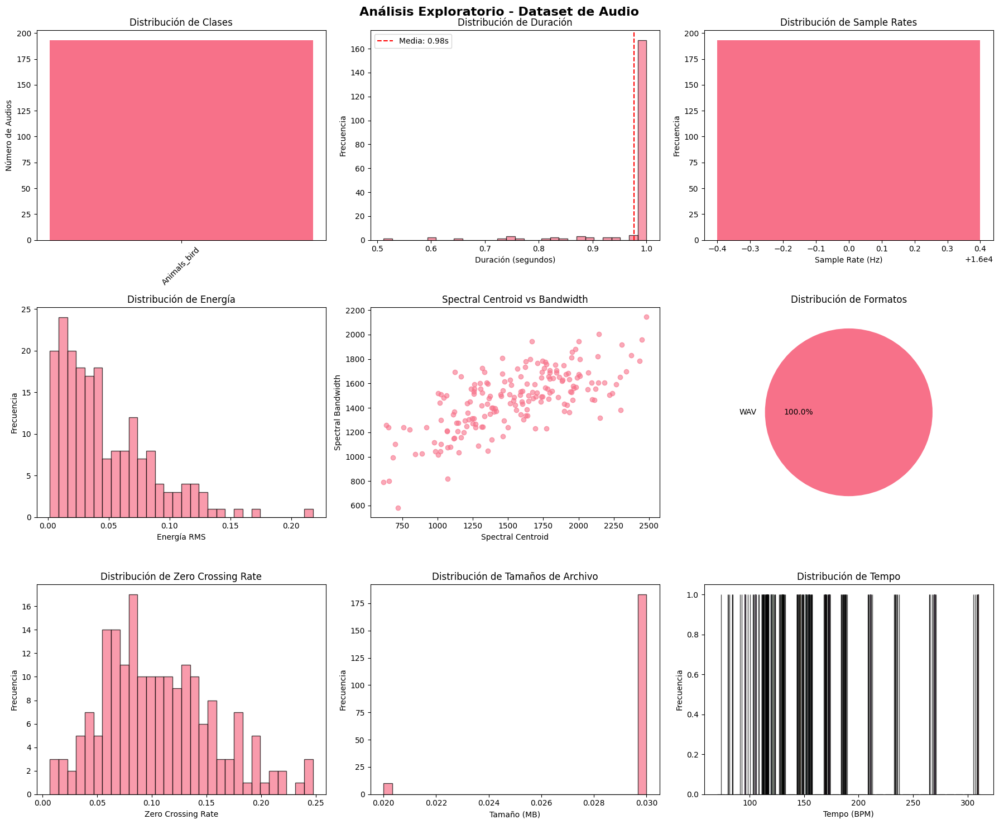


 MUESTRA DE 4 WAVEFORMS


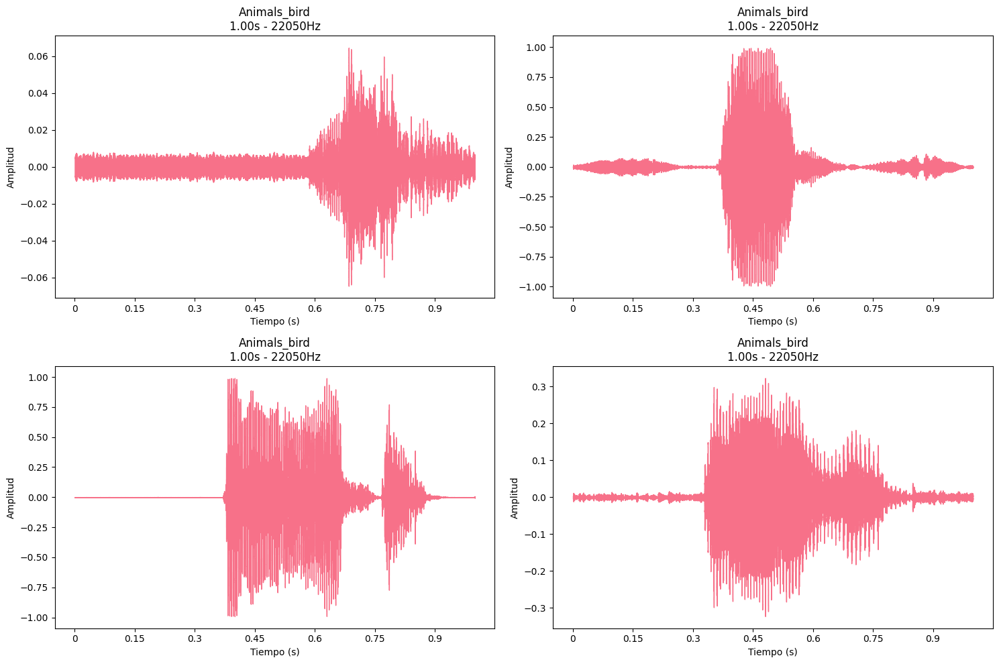


 MUESTRA DE 4 ESPECTROGRAMAS


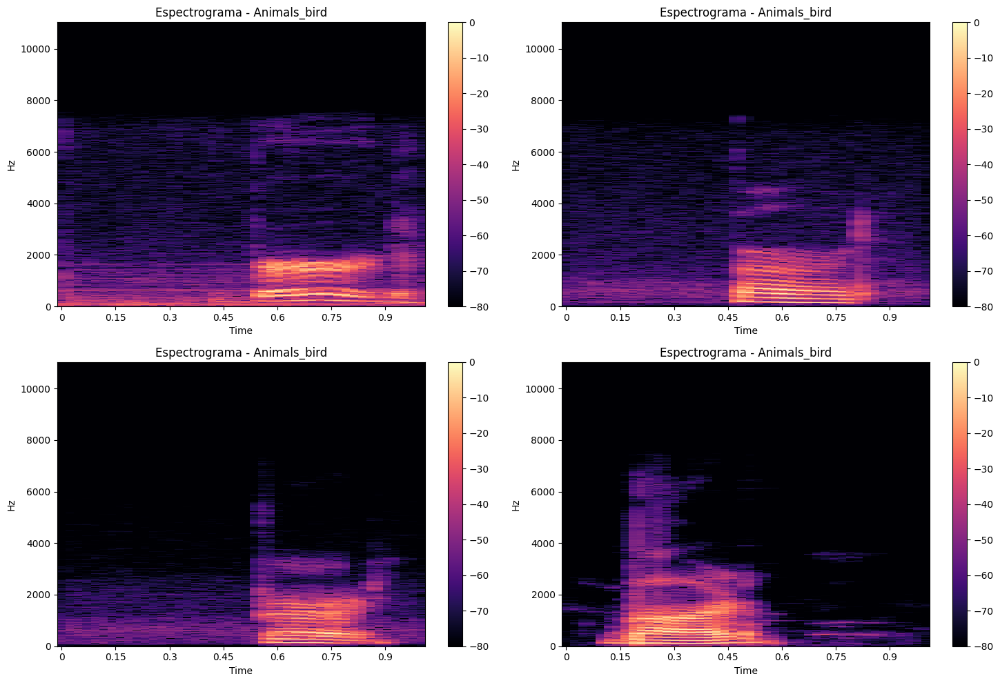


 ANÁLISIS DE CORRELACIONES


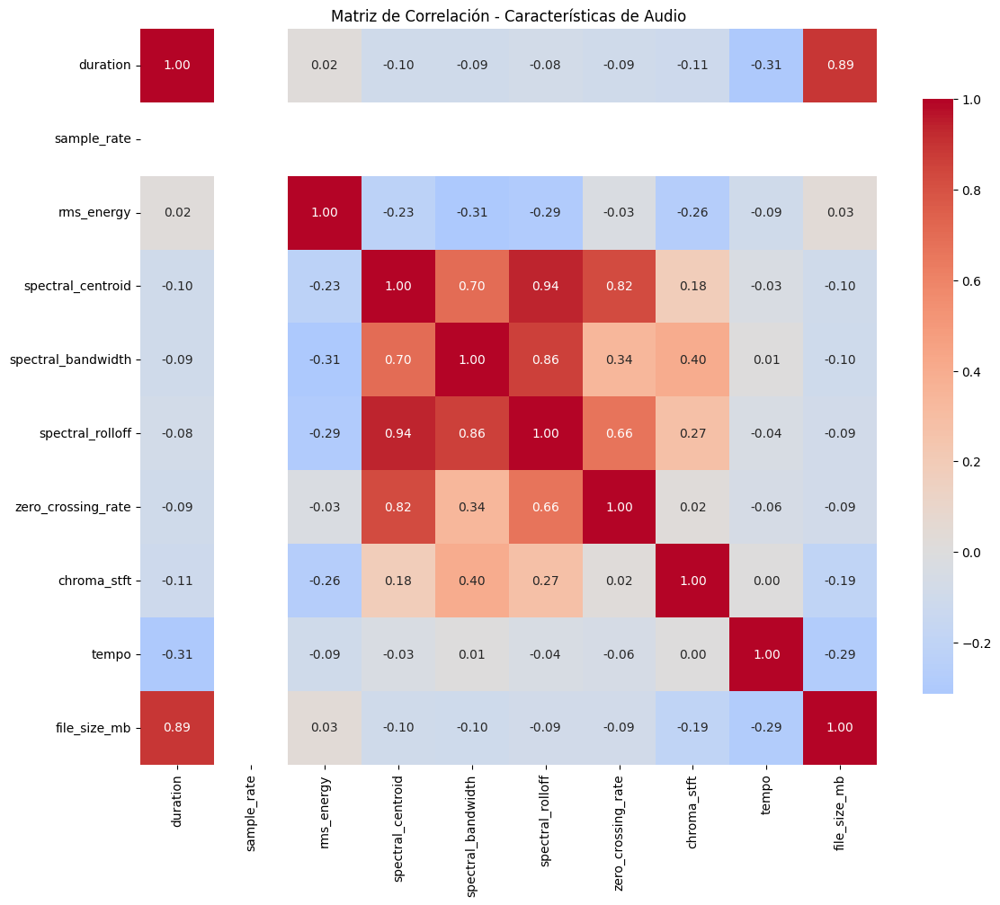


 CORRELACIONES MÁS FUERTES:
   spectral_centroid ↔ spectral_rolloff: 0.935
   spectral_rolloff ↔ spectral_centroid: 0.935
   file_size_mb ↔ duration: 0.890
   duration ↔ file_size_mb: 0.890
   spectral_rolloff ↔ spectral_bandwidth: 0.862

 REPORTE RESUMEN DEL EDA DE AUDIO
 INFORMACIÓN GENERAL:
   • Total de archivos: 193
   • Número de clases: 1
   • Clases encontradas: ['Animals_bird']

⏱  ESTADÍSTICAS DE DURACIÓN:
   • Duración total: 0.05 horas
   • Duración promedio: 0.98 segundos
   • Rango de duración: 0.51s - 1.00s

 CARACTERÍSTICAS TÉCNICAS:
   • Sample rates: [np.int64(16000)]
   • Formatos: {'WAV': 193}
   • Tamaño promedio: 0.03 MB

 RECOMENDACIONES:
    Dataset relativamente balanceado
    Duraciones consistentes
    Sample rates consistentes
     22 archivos con muy baja energía - verificar silencios

 ANÁLISIS COMPLETADO

 DataFrame disponible como 'stats_df' con 193 registros

 Primeras 5 filas del DataFrame:
                                           file_path         

In [7]:
# Script EDA para Dataset de Audio
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display
import warnings
from collections import Counter
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Configuración
warnings.filterwarnings('ignore')
plt.style.use('default')
sns.set_palette("husl")

class AudioEDA:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.audio_data = []
        self.stats_df = None

    def explore_directory_structure(self):
        """Explora la estructura del directorio"""
        print(" EXPLORANDO ESTRUCTURA DEL DIRECTORIO")
        print("=" * 50)

        for root, dirs, files in os.walk(self.dataset_path):
            level = root.replace(self.dataset_path, '').count(os.sep)
            indent = ' ' * 2 * level
            print(f"{indent}{os.path.basename(root)}/")
            subindent = ' ' * 2 * (level + 1)
            for file in files[:5]:  # Muestra solo primeros 5 archivos
                if file.lower().endswith(('.wav', '.mp3', '.flac', '.m4a', '.aac')):
                    print(f"{subindent}{file}")
            if len(files) > 5:
                print(f"{subindent}... y {len(files) - 5} archivos más")

    def extract_audio_features(self, file_path):
        """Extrae características del archivo de audio"""
        try:
            # Cargar audio
            y, sr = librosa.load(file_path, sr=None)

            # Características básicas
            duration = librosa.get_duration(y=y, sr=sr)
            rms = librosa.feature.rms(y=y).mean()  # Energía RMS
            spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr).mean()
            spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr).mean()
            spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr).mean()
            zero_crossing_rate = librosa.feature.zero_crossing_rate(y=y).mean()

            # MFCCs (primeros 13 coeficientes)
            mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
            mfcc_means = mfccs.mean(axis=1)

            # Características adicionales
            chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr).mean(axis=1).mean()
            tempo, _ = librosa.beat.beat_track(y=y, sr=sr)

            return {
                'duration': duration,
                'sample_rate': sr,
                'rms_energy': rms,
                'spectral_centroid': spectral_centroid,
                'spectral_bandwidth': spectral_bandwidth,
                'spectral_rolloff': spectral_rolloff,
                'zero_crossing_rate': zero_crossing_rate,
                'chroma_stft': chroma_stft,
                'tempo': tempo,
                'mfcc_1': mfcc_means[0],
                'mfcc_2': mfcc_means[1],
                'mfcc_3': mfcc_means[2],
                'num_samples': len(y),
                'max_amplitude': np.max(np.abs(y))
            }
        except Exception as e:
            print(f"Error procesando {file_path}: {e}")
            return None

    def collect_audio_stats(self):
        """Recolecta estadísticas de todos los archivos de audio"""
        print("\n COLECTANDO ESTADÍSTICAS DE AUDIO")
        print("=" * 50)

        supported_formats = ('.wav', '.mp3', '.flac', '.m4a', '.aac', '.ogg')

        for root, dirs, files in os.walk(self.dataset_path):
            for file in files:
                if file.lower().endswith(supported_formats):
                    file_path = os.path.join(root, file)

                    # Información básica del archivo
                    file_size = os.path.getsize(file_path) / (1024 * 1024)  # MB

                    # Extraer características de audio
                    audio_features = self.extract_audio_features(file_path)

                    if audio_features:
                        self.audio_data.append({
                            'file_path': file_path,
                            'file_name': file,
                            'file_size_mb': round(file_size, 2),
                            'format': file.split('.')[-1].upper(),
                            'class': os.path.basename(root),
                            **audio_features
                        })

        self.stats_df = pd.DataFrame(self.audio_data)
        print(f" Total de archivos de audio procesados: {len(self.stats_df)}")

    def basic_statistics(self):
        """Muestra estadísticas básicas del dataset"""
        print("\n ESTADÍSTICAS BÁSICAS DEL DATASET")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar")
            return

        print(f"Total de archivos de audio: {len(self.stats_df)}")
        print(f"Total de clases: {self.stats_df['class'].nunique()}")
        print(f"Formatos de audio: {Counter(self.stats_df['format'])}")
        print(f"Sample rates únicos: {Counter(self.stats_df['sample_rate'])}")

        print("\n Estadísticas de duración:")
        print(f"Duración - Min: {self.stats_df['duration'].min():.2f}s, Max: {self.stats_df['duration'].max():.2f}s, Mean: {self.stats_df['duration'].mean():.2f}s")

        print("\n Estadísticas de energía:")
        print(f"RMS Energy - Min: {self.stats_df['rms_energy'].min():.4f}, Max: {self.stats_df['rms_energy'].max():.4f}, Mean: {self.stats_df['rms_energy'].mean():.4f}")

    def visualize_distributions(self):
        """Crea visualizaciones de las distribuciones"""
        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para visualizar")
            return

        print("\n CREANDO VISUALIZACIONES")
        print("=" * 50)

        # Configurar subplots
        fig, axes = plt.subplots(3, 3, figsize=(18, 15))
        fig.suptitle('Análisis Exploratorio - Dataset de Audio', fontsize=16, fontweight='bold')

        # 1. Distribución de clases
        class_dist = self.stats_df['class'].value_counts()
        axes[0,0].bar(class_dist.index, class_dist.values)
        axes[0,0].set_title('Distribución de Clases')
        axes[0,0].tick_params(axis='x', rotation=45)
        axes[0,0].set_ylabel('Número de Audios')

        # 2. Distribución de duración
        axes[0,1].hist(self.stats_df['duration'], bins=30, alpha=0.7, edgecolor='black')
        axes[0,1].set_xlabel('Duración (segundos)')
        axes[0,1].set_ylabel('Frecuencia')
        axes[0,1].set_title('Distribución de Duración')
        axes[0,1].axvline(self.stats_df['duration'].mean(), color='red', linestyle='--',
                         label=f'Media: {self.stats_df["duration"].mean():.2f}s')
        axes[0,1].legend()

        # 3. Distribución de sample rates
        sample_rate_dist = self.stats_df['sample_rate'].value_counts()
        axes[0,2].bar(sample_rate_dist.index, sample_rate_dist.values)
        axes[0,2].set_xlabel('Sample Rate (Hz)')
        axes[0,2].set_ylabel('Frecuencia')
        axes[0,2].set_title('Distribución de Sample Rates')

        # 4. Distribución de energía RMS
        axes[1,0].hist(self.stats_df['rms_energy'], bins=30, alpha=0.7, edgecolor='black')
        axes[1,0].set_xlabel('Energía RMS')
        axes[1,0].set_ylabel('Frecuencia')
        axes[1,0].set_title('Distribución de Energía')

        # 5. Spectral Centroid vs Spectral Bandwidth
        axes[1,1].scatter(self.stats_df['spectral_centroid'], self.stats_df['spectral_bandwidth'], alpha=0.6)
        axes[1,1].set_xlabel('Spectral Centroid')
        axes[1,1].set_ylabel('Spectral Bandwidth')
        axes[1,1].set_title('Spectral Centroid vs Bandwidth')

        # 6. Distribución de formatos
        format_dist = self.stats_df['format'].value_counts()
        axes[1,2].pie(format_dist.values, labels=format_dist.index, autopct='%1.1f%%')
        axes[1,2].set_title('Distribución de Formatos')

        # 7. Zero Crossing Rate
        axes[2,0].hist(self.stats_df['zero_crossing_rate'], bins=30, alpha=0.7, edgecolor='black')
        axes[2,0].set_xlabel('Zero Crossing Rate')
        axes[2,0].set_ylabel('Frecuencia')
        axes[2,0].set_title('Distribución de Zero Crossing Rate')

        # 8. Tamaños de archivo
        axes[2,1].hist(self.stats_df['file_size_mb'], bins=30, alpha=0.7, edgecolor='black')
        axes[2,1].set_xlabel('Tamaño (MB)')
        axes[2,1].set_ylabel('Frecuencia')
        axes[2,1].set_title('Distribución de Tamaños de Archivo')

        # 9. Tempo distribution
        if self.stats_df['tempo'].notna().any():
            axes[2,2].hist(self.stats_df['tempo'].dropna(), bins=30, alpha=0.7, edgecolor='black')
            axes[2,2].set_xlabel('Tempo (BPM)')
            axes[2,2].set_ylabel('Frecuencia')
            axes[2,2].set_title('Distribución de Tempo')

        plt.tight_layout()
        plt.show()

    def display_audio_waveforms(self, n_samples=4):
        """Muestra waveforms de muestras de audio"""
        print(f"\n MUESTRA DE {n_samples} WAVEFORMS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay audios para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        axes = axes.ravel()

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            if idx >= len(axes):
                break

            try:
                y, sr = librosa.load(row['file_path'])

                # Waveform
                librosa.display.waveshow(y, sr=sr, ax=axes[idx])
                axes[idx].set_title(f"{row['class']}\n{row['duration']:.2f}s - {sr}Hz")
                axes[idx].set_xlabel('Tiempo (s)')
                axes[idx].set_ylabel('Amplitud')

            except Exception as e:
                print(f"Error mostrando audio {row['file_path']}: {e}")
                axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    def display_spectrograms(self, n_samples=4):
        """Muestra espectrogramas de muestras de audio"""
        print(f"\n MUESTRA DE {n_samples} ESPECTROGRAMAS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay audios para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        axes = axes.ravel()

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            if idx >= len(axes):
                break

            try:
                y, sr = librosa.load(row['file_path'])

                # Espectrograma
                D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
                img = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', ax=axes[idx])
                axes[idx].set_title(f"Espectrograma - {row['class']}")
                plt.colorbar(img, ax=axes[idx])

            except Exception as e:
                print(f"Error mostrando espectrograma {row['file_path']}: {e}")
                axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    def analyze_correlations(self):
        """Analiza correlaciones entre características"""
        print("\n ANÁLISIS DE CORRELACIONES")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar correlaciones")
            return

        # Seleccionar características numéricas para correlación
        numeric_features = ['duration', 'sample_rate', 'rms_energy', 'spectral_centroid',
                           'spectral_bandwidth', 'spectral_rolloff', 'zero_crossing_rate',
                           'chroma_stft', 'tempo', 'file_size_mb']

        # Filtrar características existentes
        existing_features = [f for f in numeric_features if f in self.stats_df.columns]
        corr_matrix = self.stats_df[existing_features].corr()

        plt.figure(figsize=(12, 10))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                   square=True, fmt='.2f', cbar_kws={'shrink': .8})
        plt.title('Matriz de Correlación - Características de Audio')
        plt.tight_layout()
        plt.show()

        # Mostrar correlaciones más fuertes
        print("\n CORRELACIONES MÁS FUERTES:")
        corr_pairs = corr_matrix.unstack().sort_values(key=abs, ascending=False)
        # Eliminar autocorrelaciones y duplicados
        unique_pairs = corr_pairs[~corr_pairs.index.duplicated(keep='first')]
        unique_pairs = unique_pairs[unique_pairs != 1.0]

        for idx, ((feat1, feat2), corr) in enumerate(unique_pairs.head(5).items()):
            print(f"   {feat1} ↔ {feat2}: {corr:.3f}")

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA DE AUDIO")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para generar reporte")
            return

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Total de archivos: {len(self.stats_df)}")
        print(f"   • Número de clases: {self.stats_df['class'].nunique()}")
        print(f"   • Clases encontradas: {list(self.stats_df['class'].unique())}")

        print("\n⏱  ESTADÍSTICAS DE DURACIÓN:")
        print(f"   • Duración total: {self.stats_df['duration'].sum() / 3600:.2f} horas")
        print(f"   • Duración promedio: {self.stats_df['duration'].mean():.2f} segundos")
        print(f"   • Rango de duración: {self.stats_df['duration'].min():.2f}s - {self.stats_df['duration'].max():.2f}s")

        print("\n CARACTERÍSTICAS TÉCNICAS:")
        print(f"   • Sample rates: {sorted(self.stats_df['sample_rate'].unique())}")
        print(f"   • Formatos: {dict(Counter(self.stats_df['format']))}")
        print(f"   • Tamaño promedio: {self.stats_df['file_size_mb'].mean():.2f} MB")

        print("\n RECOMENDACIONES:")

        # Análisis de balance de clases
        class_counts = self.stats_df['class'].value_counts()
        imbalance_ratio = class_counts.max() / class_counts.min()

        if imbalance_ratio > 5:
            print("     Dataset desbalanceado - considerar técnicas de balanceo")
        else:
            print("    Dataset relativamente balanceado")

        # Verificar variabilidad en duración
        duration_std = self.stats_df['duration'].std()
        if duration_std > self.stats_df['duration'].mean():
            print("     Alta variabilidad en duración - considerar padding/trimming")
        else:
            print("    Duraciones consistentes")

        # Verificar sample rates
        unique_sample_rates = self.stats_df['sample_rate'].nunique()
        if unique_sample_rates > 3:
            print("     Múltiples sample rates - considerar resampling uniforme")
        else:
            print("    Sample rates consistentes")

        # Verificar silencios o audio de baja energía
        low_energy_files = len(self.stats_df[self.stats_df['rms_energy'] < 0.01])
        if low_energy_files > 0:
            print(f"     {low_energy_files} archivos con muy baja energía - verificar silencios")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE AUDIO")
        print("=" * 60)

        self.explore_directory_structure()
        self.collect_audio_stats()
        self.basic_statistics()
        self.visualize_distributions()
        self.display_audio_waveforms()
        self.display_spectrograms()
        self.analyze_correlations()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.stats_df

# USO DEL SCRIPT
if __name__ == "__main__":
    # Configura tu path aquí
    dataset_path = "/content/Machine_learning_I/Dataset/Animals_bird"  # Cambia por tu path

    # Crear instancia y ejecutar análisis
    audio_eda = AudioEDA(dataset_path)
    stats_df = audio_eda.run_complete_analysis()

    # El DataFrame con las estadísticas queda disponible para análisis adicional
    print(f"\n DataFrame disponible como 'stats_df' con {len(stats_df)} registros")

    # Mostrar primeras filas del DataFrame
    if stats_df is not None:
        print("\n Primeras 5 filas del DataFrame:")
        print(stats_df.head())

Animals_cat

 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE AUDIO
 EXPLORANDO ESTRUCTURA DEL DIRECTORIO
Animals_cat/
  38c30a4a_nohash_0.wav
  850e2222_nohash_0.wav
  ed3c2d05_nohash_0.wav
  25132942_nohash_0.wav
  5e3b7a84_nohash_1.wav
  ... y 202 archivos más

 COLECTANDO ESTADÍSTICAS DE AUDIO
 Total de archivos de audio procesados: 207

 ESTADÍSTICAS BÁSICAS DEL DATASET
Total de archivos de audio: 207
Total de clases: 1
Formatos de audio: Counter({'WAV': 207})
Sample rates únicos: Counter({16000: 207})

 Estadísticas de duración:
Duración - Min: 0.51s, Max: 1.00s, Mean: 0.98s

 Estadísticas de energía:
RMS Energy - Min: 0.0009, Max: 0.2521, Mean: 0.0301

 CREANDO VISUALIZACIONES


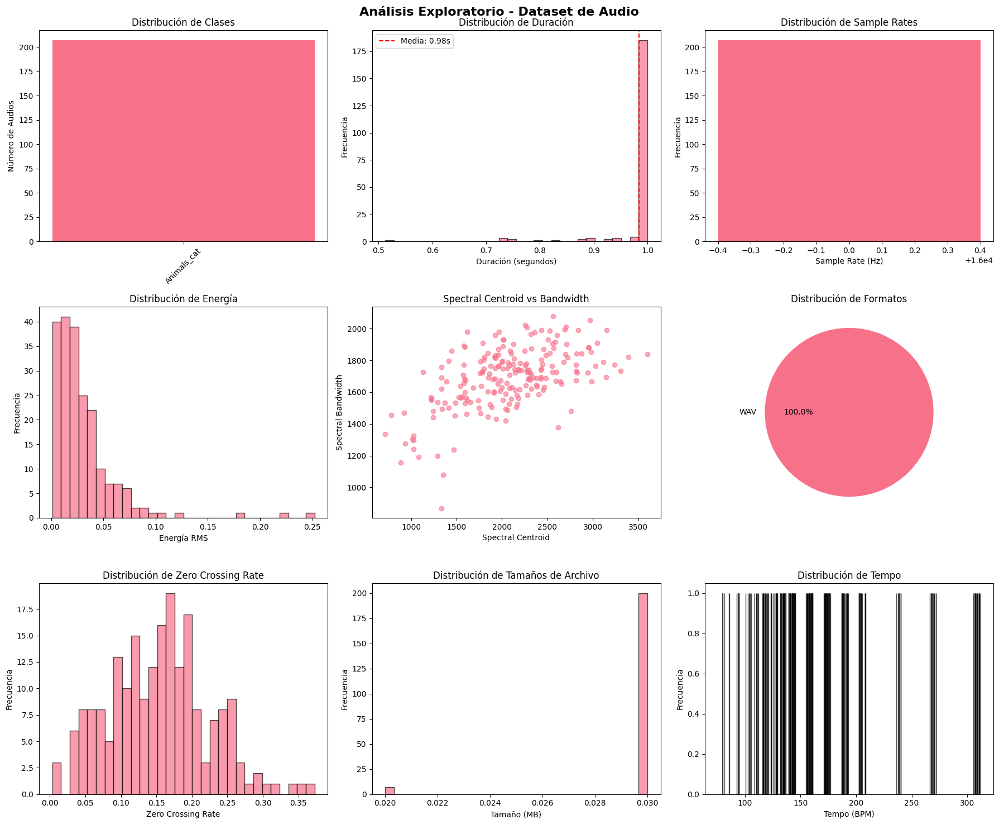


 MUESTRA DE 4 WAVEFORMS


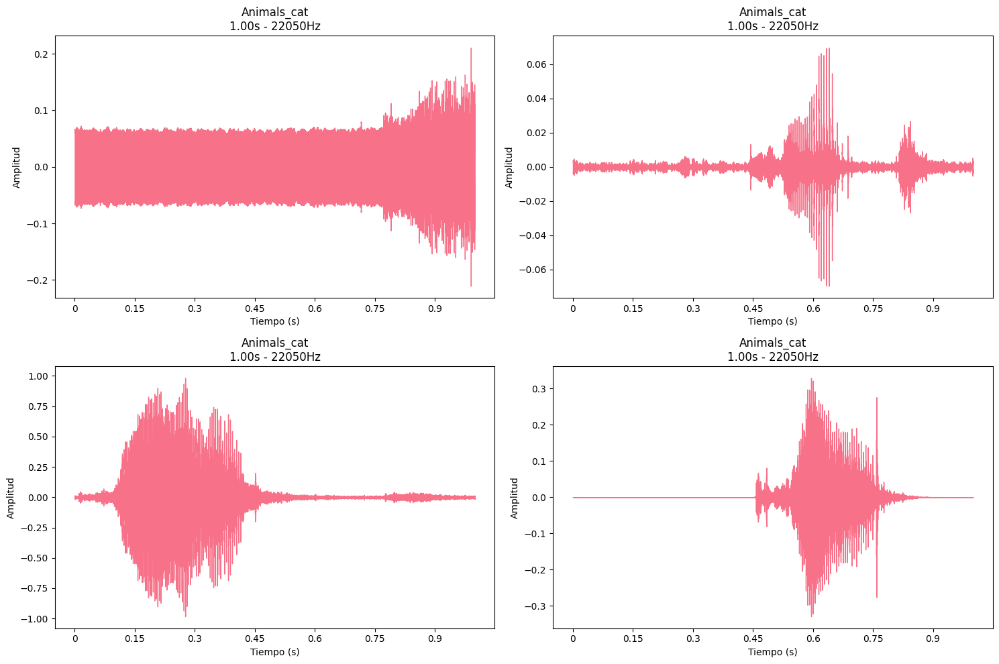


 MUESTRA DE 4 ESPECTROGRAMAS


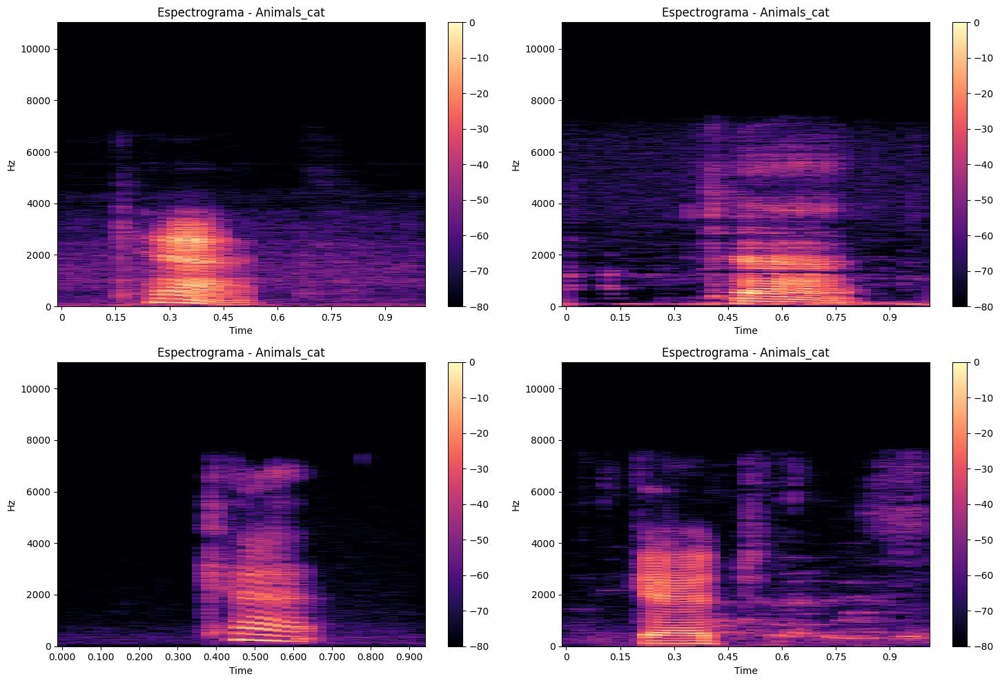


 ANÁLISIS DE CORRELACIONES


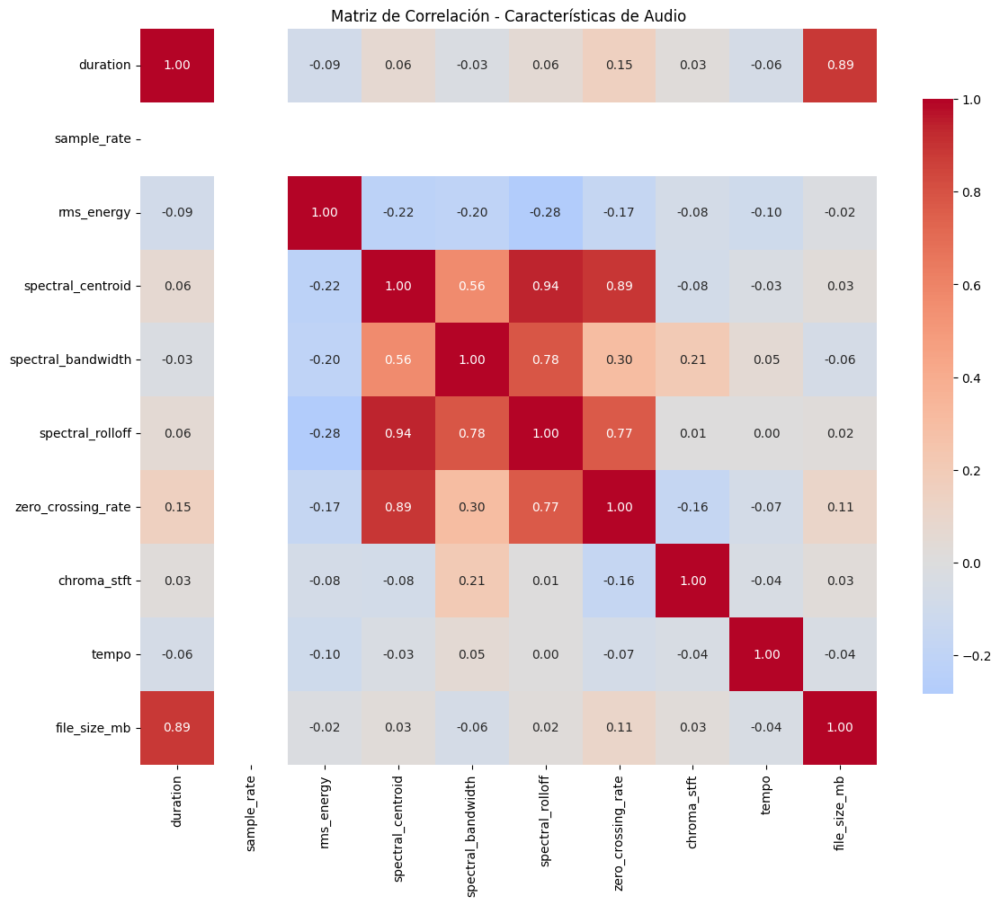


 CORRELACIONES MÁS FUERTES:
   spectral_centroid ↔ spectral_rolloff: 0.937
   spectral_rolloff ↔ spectral_centroid: 0.937
   zero_crossing_rate ↔ spectral_centroid: 0.891
   spectral_centroid ↔ zero_crossing_rate: 0.891
   file_size_mb ↔ duration: 0.885

 REPORTE RESUMEN DEL EDA DE AUDIO
 INFORMACIÓN GENERAL:
   • Total de archivos: 207
   • Número de clases: 1
   • Clases encontradas: ['Animals_cat']

  ESTADÍSTICAS DE DURACIÓN:
   • Duración total: 0.06 horas
   • Duración promedio: 0.98 segundos
   • Rango de duración: 0.51s - 1.00s

 CARACTERÍSTICAS TÉCNICAS:
   • Sample rates: [np.int64(16000)]
   • Formatos: {'WAV': 207}
   • Tamaño promedio: 0.03 MB

 RECOMENDACIONES:
    Dataset relativamente balanceado
    Duraciones consistentes
    Sample rates consistentes
     44 archivos con muy baja energía - verificar silencios

 ANÁLISIS COMPLETADO

 DataFrame disponible como 'stats_df' con 207 registros

 Primeras 5 filas del DataFrame:
                                           file

In [8]:
# Script EDA para Dataset de Audio
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display
import warnings
from collections import Counter
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Configuración
warnings.filterwarnings('ignore')
plt.style.use('default')
sns.set_palette("husl")

class AudioEDA:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.audio_data = []
        self.stats_df = None

    def explore_directory_structure(self):
        """Explora la estructura del directorio"""
        print(" EXPLORANDO ESTRUCTURA DEL DIRECTORIO")
        print("=" * 50)

        for root, dirs, files in os.walk(self.dataset_path):
            level = root.replace(self.dataset_path, '').count(os.sep)
            indent = ' ' * 2 * level
            print(f"{indent}{os.path.basename(root)}/")
            subindent = ' ' * 2 * (level + 1)
            for file in files[:5]:  # Muestra solo primeros 5 archivos
                if file.lower().endswith(('.wav', '.mp3', '.flac', '.m4a', '.aac')):
                    print(f"{subindent}{file}")
            if len(files) > 5:
                print(f"{subindent}... y {len(files) - 5} archivos más")

    def extract_audio_features(self, file_path):
        """Extrae características del archivo de audio"""
        try:
            # Cargar audio
            y, sr = librosa.load(file_path, sr=None)

            # Características básicas
            duration = librosa.get_duration(y=y, sr=sr)
            rms = librosa.feature.rms(y=y).mean()  # Energía RMS
            spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr).mean()
            spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr).mean()
            spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr).mean()
            zero_crossing_rate = librosa.feature.zero_crossing_rate(y=y).mean()

            # MFCCs (primeros 13 coeficientes)
            mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
            mfcc_means = mfccs.mean(axis=1)

            # Características adicionales
            chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr).mean(axis=1).mean()
            tempo, _ = librosa.beat.beat_track(y=y, sr=sr)

            return {
                'duration': duration,
                'sample_rate': sr,
                'rms_energy': rms,
                'spectral_centroid': spectral_centroid,
                'spectral_bandwidth': spectral_bandwidth,
                'spectral_rolloff': spectral_rolloff,
                'zero_crossing_rate': zero_crossing_rate,
                'chroma_stft': chroma_stft,
                'tempo': tempo,
                'mfcc_1': mfcc_means[0],
                'mfcc_2': mfcc_means[1],
                'mfcc_3': mfcc_means[2],
                'num_samples': len(y),
                'max_amplitude': np.max(np.abs(y))
            }
        except Exception as e:
            print(f"Error procesando {file_path}: {e}")
            return None

    def collect_audio_stats(self):
        """Recolecta estadísticas de todos los archivos de audio"""
        print("\n COLECTANDO ESTADÍSTICAS DE AUDIO")
        print("=" * 50)

        supported_formats = ('.wav', '.mp3', '.flac', '.m4a', '.aac', '.ogg')

        for root, dirs, files in os.walk(self.dataset_path):
            for file in files:
                if file.lower().endswith(supported_formats):
                    file_path = os.path.join(root, file)

                    # Información básica del archivo
                    file_size = os.path.getsize(file_path) / (1024 * 1024)  # MB

                    # Extraer características de audio
                    audio_features = self.extract_audio_features(file_path)

                    if audio_features:
                        self.audio_data.append({
                            'file_path': file_path,
                            'file_name': file,
                            'file_size_mb': round(file_size, 2),
                            'format': file.split('.')[-1].upper(),
                            'class': os.path.basename(root),
                            **audio_features
                        })

        self.stats_df = pd.DataFrame(self.audio_data)
        print(f" Total de archivos de audio procesados: {len(self.stats_df)}")

    def basic_statistics(self):
        """Muestra estadísticas básicas del dataset"""
        print("\n ESTADÍSTICAS BÁSICAS DEL DATASET")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar")
            return

        print(f"Total de archivos de audio: {len(self.stats_df)}")
        print(f"Total de clases: {self.stats_df['class'].nunique()}")
        print(f"Formatos de audio: {Counter(self.stats_df['format'])}")
        print(f"Sample rates únicos: {Counter(self.stats_df['sample_rate'])}")

        print("\n Estadísticas de duración:")
        print(f"Duración - Min: {self.stats_df['duration'].min():.2f}s, Max: {self.stats_df['duration'].max():.2f}s, Mean: {self.stats_df['duration'].mean():.2f}s")

        print("\n Estadísticas de energía:")
        print(f"RMS Energy - Min: {self.stats_df['rms_energy'].min():.4f}, Max: {self.stats_df['rms_energy'].max():.4f}, Mean: {self.stats_df['rms_energy'].mean():.4f}")

    def visualize_distributions(self):
        """Crea visualizaciones de las distribuciones"""
        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para visualizar")
            return

        print("\n CREANDO VISUALIZACIONES")
        print("=" * 50)

        # Configurar subplots
        fig, axes = plt.subplots(3, 3, figsize=(18, 15))
        fig.suptitle('Análisis Exploratorio - Dataset de Audio', fontsize=16, fontweight='bold')

        # 1. Distribución de clases
        class_dist = self.stats_df['class'].value_counts()
        axes[0,0].bar(class_dist.index, class_dist.values)
        axes[0,0].set_title('Distribución de Clases')
        axes[0,0].tick_params(axis='x', rotation=45)
        axes[0,0].set_ylabel('Número de Audios')

        # 2. Distribución de duración
        axes[0,1].hist(self.stats_df['duration'], bins=30, alpha=0.7, edgecolor='black')
        axes[0,1].set_xlabel('Duración (segundos)')
        axes[0,1].set_ylabel('Frecuencia')
        axes[0,1].set_title('Distribución de Duración')
        axes[0,1].axvline(self.stats_df['duration'].mean(), color='red', linestyle='--',
                         label=f'Media: {self.stats_df["duration"].mean():.2f}s')
        axes[0,1].legend()

        # 3. Distribución de sample rates
        sample_rate_dist = self.stats_df['sample_rate'].value_counts()
        axes[0,2].bar(sample_rate_dist.index, sample_rate_dist.values)
        axes[0,2].set_xlabel('Sample Rate (Hz)')
        axes[0,2].set_ylabel('Frecuencia')
        axes[0,2].set_title('Distribución de Sample Rates')

        # 4. Distribución de energía RMS
        axes[1,0].hist(self.stats_df['rms_energy'], bins=30, alpha=0.7, edgecolor='black')
        axes[1,0].set_xlabel('Energía RMS')
        axes[1,0].set_ylabel('Frecuencia')
        axes[1,0].set_title('Distribución de Energía')

        # 5. Spectral Centroid vs Spectral Bandwidth
        axes[1,1].scatter(self.stats_df['spectral_centroid'], self.stats_df['spectral_bandwidth'], alpha=0.6)
        axes[1,1].set_xlabel('Spectral Centroid')
        axes[1,1].set_ylabel('Spectral Bandwidth')
        axes[1,1].set_title('Spectral Centroid vs Bandwidth')

        # 6. Distribución de formatos
        format_dist = self.stats_df['format'].value_counts()
        axes[1,2].pie(format_dist.values, labels=format_dist.index, autopct='%1.1f%%')
        axes[1,2].set_title('Distribución de Formatos')

        # 7. Zero Crossing Rate
        axes[2,0].hist(self.stats_df['zero_crossing_rate'], bins=30, alpha=0.7, edgecolor='black')
        axes[2,0].set_xlabel('Zero Crossing Rate')
        axes[2,0].set_ylabel('Frecuencia')
        axes[2,0].set_title('Distribución de Zero Crossing Rate')

        # 8. Tamaños de archivo
        axes[2,1].hist(self.stats_df['file_size_mb'], bins=30, alpha=0.7, edgecolor='black')
        axes[2,1].set_xlabel('Tamaño (MB)')
        axes[2,1].set_ylabel('Frecuencia')
        axes[2,1].set_title('Distribución de Tamaños de Archivo')

        # 9. Tempo distribution
        if self.stats_df['tempo'].notna().any():
            axes[2,2].hist(self.stats_df['tempo'].dropna(), bins=30, alpha=0.7, edgecolor='black')
            axes[2,2].set_xlabel('Tempo (BPM)')
            axes[2,2].set_ylabel('Frecuencia')
            axes[2,2].set_title('Distribución de Tempo')

        plt.tight_layout()
        plt.show()

    def display_audio_waveforms(self, n_samples=4):
        """Muestra waveforms de muestras de audio"""
        print(f"\n MUESTRA DE {n_samples} WAVEFORMS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay audios para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        axes = axes.ravel()

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            if idx >= len(axes):
                break

            try:
                y, sr = librosa.load(row['file_path'])

                # Waveform
                librosa.display.waveshow(y, sr=sr, ax=axes[idx])
                axes[idx].set_title(f"{row['class']}\n{row['duration']:.2f}s - {sr}Hz")
                axes[idx].set_xlabel('Tiempo (s)')
                axes[idx].set_ylabel('Amplitud')

            except Exception as e:
                print(f"Error mostrando audio {row['file_path']}: {e}")
                axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    def display_spectrograms(self, n_samples=4):
        """Muestra espectrogramas de muestras de audio"""
        print(f"\n MUESTRA DE {n_samples} ESPECTROGRAMAS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay audios para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        axes = axes.ravel()

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            if idx >= len(axes):
                break

            try:
                y, sr = librosa.load(row['file_path'])

                # Espectrograma
                D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
                img = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', ax=axes[idx])
                axes[idx].set_title(f"Espectrograma - {row['class']}")
                plt.colorbar(img, ax=axes[idx])

            except Exception as e:
                print(f"Error mostrando espectrograma {row['file_path']}: {e}")
                axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    def analyze_correlations(self):
        """Analiza correlaciones entre características"""
        print("\n ANÁLISIS DE CORRELACIONES")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar correlaciones")
            return

        # Seleccionar características numéricas para correlación
        numeric_features = ['duration', 'sample_rate', 'rms_energy', 'spectral_centroid',
                           'spectral_bandwidth', 'spectral_rolloff', 'zero_crossing_rate',
                           'chroma_stft', 'tempo', 'file_size_mb']

        # Filtrar características existentes
        existing_features = [f for f in numeric_features if f in self.stats_df.columns]
        corr_matrix = self.stats_df[existing_features].corr()

        plt.figure(figsize=(12, 10))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                   square=True, fmt='.2f', cbar_kws={'shrink': .8})
        plt.title('Matriz de Correlación - Características de Audio')
        plt.tight_layout()
        plt.show()

        # Mostrar correlaciones más fuertes
        print("\n CORRELACIONES MÁS FUERTES:")
        corr_pairs = corr_matrix.unstack().sort_values(key=abs, ascending=False)
        # Eliminar autocorrelaciones y duplicados
        unique_pairs = corr_pairs[~corr_pairs.index.duplicated(keep='first')]
        unique_pairs = unique_pairs[unique_pairs != 1.0]

        for idx, ((feat1, feat2), corr) in enumerate(unique_pairs.head(5).items()):
            print(f"   {feat1} ↔ {feat2}: {corr:.3f}")

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA DE AUDIO")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para generar reporte")
            return

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Total de archivos: {len(self.stats_df)}")
        print(f"   • Número de clases: {self.stats_df['class'].nunique()}")
        print(f"   • Clases encontradas: {list(self.stats_df['class'].unique())}")

        print("\n  ESTADÍSTICAS DE DURACIÓN:")
        print(f"   • Duración total: {self.stats_df['duration'].sum() / 3600:.2f} horas")
        print(f"   • Duración promedio: {self.stats_df['duration'].mean():.2f} segundos")
        print(f"   • Rango de duración: {self.stats_df['duration'].min():.2f}s - {self.stats_df['duration'].max():.2f}s")

        print("\n CARACTERÍSTICAS TÉCNICAS:")
        print(f"   • Sample rates: {sorted(self.stats_df['sample_rate'].unique())}")
        print(f"   • Formatos: {dict(Counter(self.stats_df['format']))}")
        print(f"   • Tamaño promedio: {self.stats_df['file_size_mb'].mean():.2f} MB")

        print("\n RECOMENDACIONES:")

        # Análisis de balance de clases
        class_counts = self.stats_df['class'].value_counts()
        imbalance_ratio = class_counts.max() / class_counts.min()

        if imbalance_ratio > 5:
            print("     Dataset desbalanceado - considerar técnicas de balanceo")
        else:
            print("    Dataset relativamente balanceado")

        # Verificar variabilidad en duración
        duration_std = self.stats_df['duration'].std()
        if duration_std > self.stats_df['duration'].mean():
            print("     Alta variabilidad en duración - considerar padding/trimming")
        else:
            print("    Duraciones consistentes")

        # Verificar sample rates
        unique_sample_rates = self.stats_df['sample_rate'].nunique()
        if unique_sample_rates > 3:
            print("     Múltiples sample rates - considerar resampling uniforme")
        else:
            print("    Sample rates consistentes")

        # Verificar silencios o audio de baja energía
        low_energy_files = len(self.stats_df[self.stats_df['rms_energy'] < 0.01])
        if low_energy_files > 0:
            print(f"     {low_energy_files} archivos con muy baja energía - verificar silencios")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE AUDIO")
        print("=" * 60)

        self.explore_directory_structure()
        self.collect_audio_stats()
        self.basic_statistics()
        self.visualize_distributions()
        self.display_audio_waveforms()
        self.display_spectrograms()
        self.analyze_correlations()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.stats_df

# USO DEL SCRIPT
if __name__ == "__main__":
    # Configura tu path aquí
    dataset_path = "/content/Machine_learning_I/Dataset/Animals_cat"  # Cambia por tu path

    # Crear instancia y ejecutar análisis
    audio_eda = AudioEDA(dataset_path)
    stats_df = audio_eda.run_complete_analysis()

    # El DataFrame con las estadísticas queda disponible para análisis adicional
    print(f"\n DataFrame disponible como 'stats_df' con {len(stats_df)} registros")

    # Mostrar primeras filas del DataFrame
    if stats_df is not None:
        print("\n Primeras 5 filas del DataFrame:")
        print(stats_df.head())

Animals_dog

 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE AUDIO
 EXPLORANDO ESTRUCTURA DEL DIRECTORIO
Animals_dog/
  a518d1cf_nohash_0.wav
  31e686d2_nohash_3.wav
  e18b3705_nohash_0.wav
  17cc40ee_nohash_0.wav
  d0858dce_nohash_1.wav
  ... y 205 archivos más

 COLECTANDO ESTADÍSTICAS DE AUDIO
 Total de archivos de audio procesados: 210

 ESTADÍSTICAS BÁSICAS DEL DATASET
Total de archivos de audio: 210
Total de clases: 1
Formatos de audio: Counter({'WAV': 210})
Sample rates únicos: Counter({16000: 210})

 Estadísticas de duración:
Duración - Min: 0.73s, Max: 1.00s, Mean: 0.99s

 Estadísticas de energía:
RMS Energy - Min: 0.0001, Max: 0.4102, Mean: 0.0481

 CREANDO VISUALIZACIONES


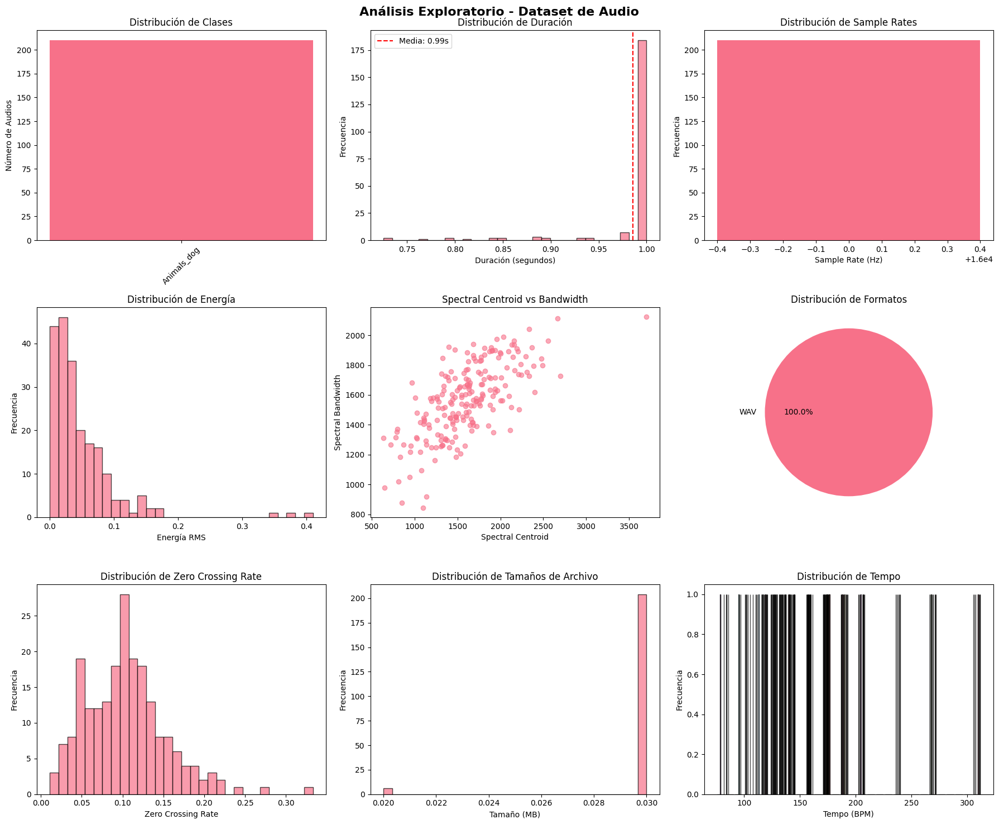


 MUESTRA DE 4 WAVEFORMS


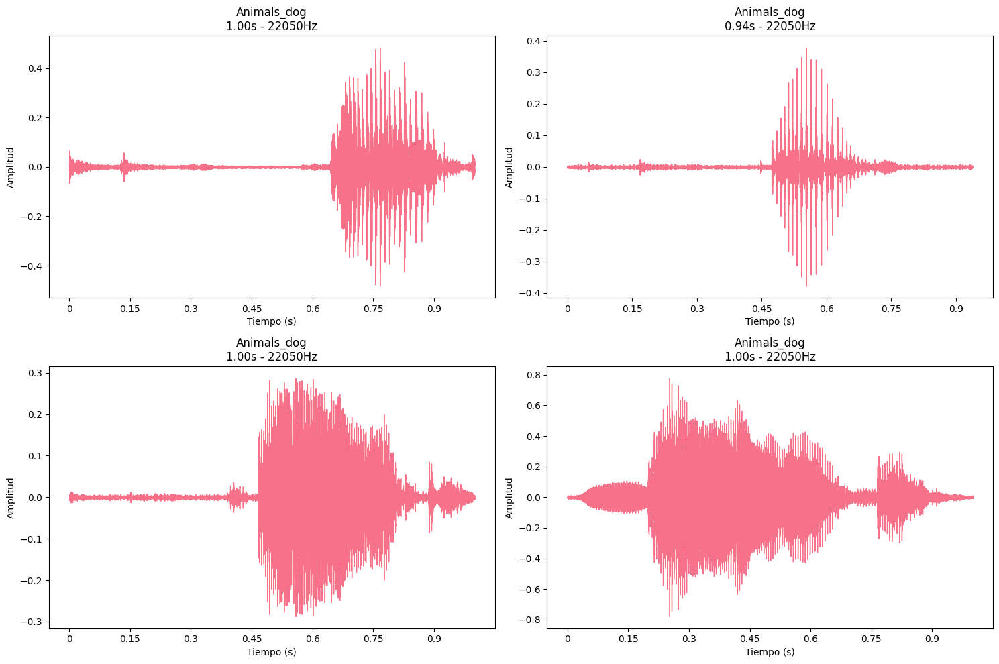


 MUESTRA DE 4 ESPECTROGRAMAS


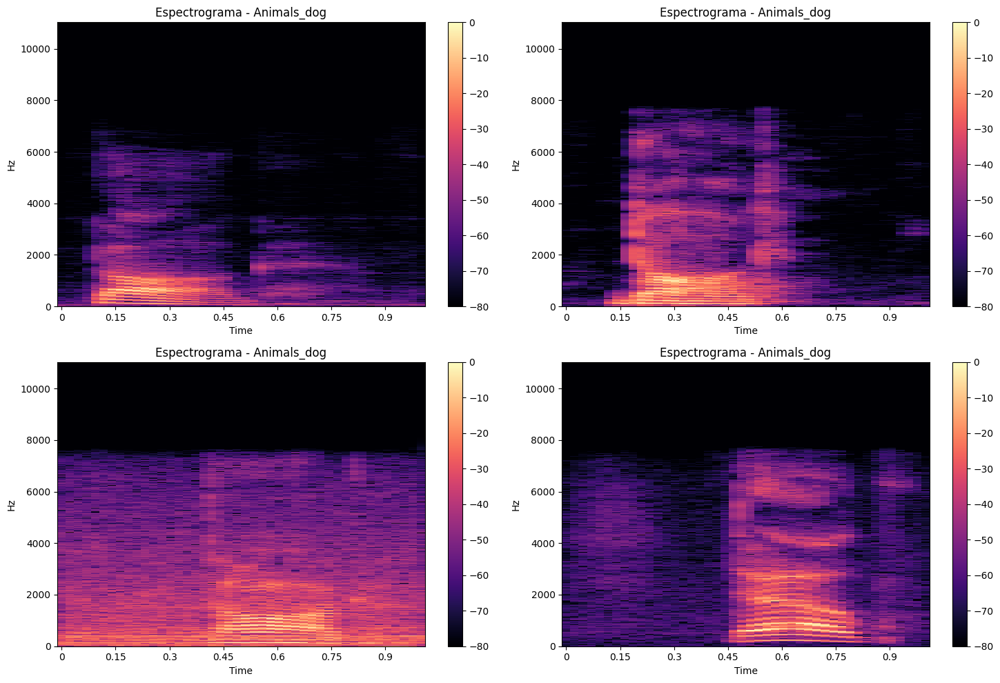


 ANÁLISIS DE CORRELACIONES


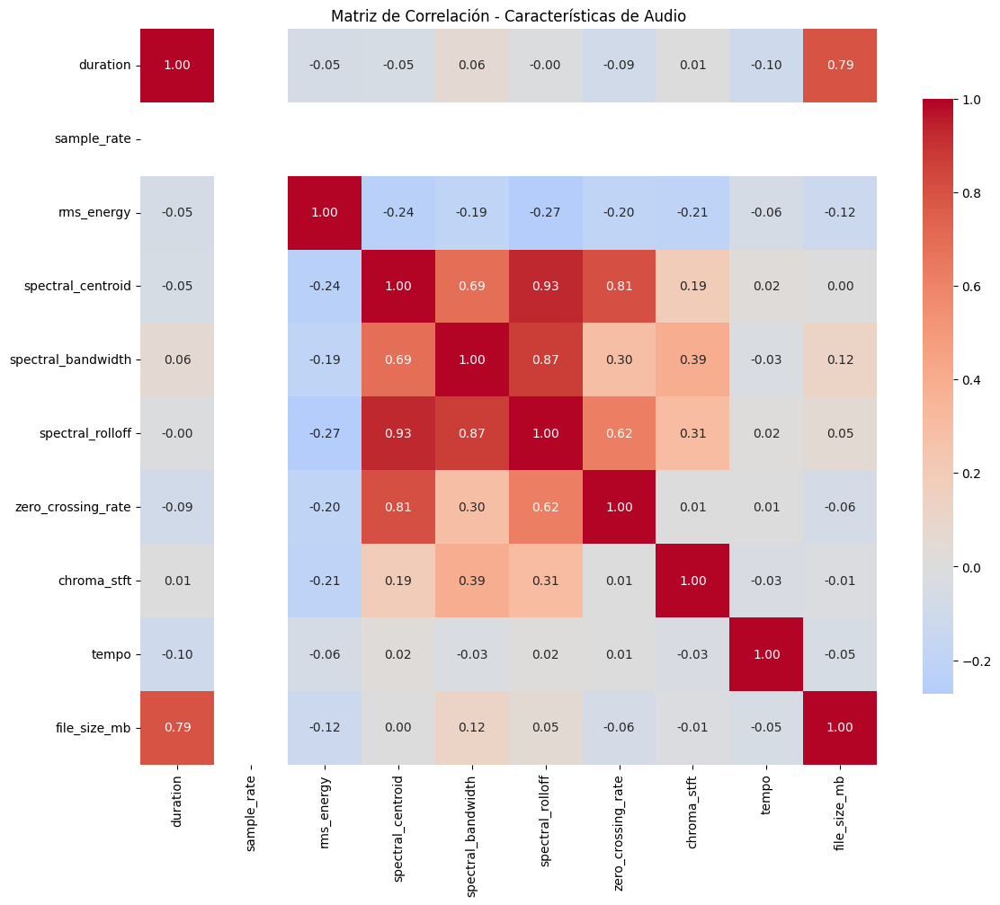


 CORRELACIONES MÁS FUERTES:
   spectral_centroid ↔ spectral_rolloff: 0.931
   spectral_rolloff ↔ spectral_centroid: 0.931
   spectral_rolloff ↔ spectral_bandwidth: 0.869
   spectral_bandwidth ↔ spectral_rolloff: 0.869
   spectral_centroid ↔ zero_crossing_rate: 0.808

 REPORTE RESUMEN DEL EDA DE AUDIO
 INFORMACIÓN GENERAL:
   • Total de archivos: 210
   • Número de clases: 1
   • Clases encontradas: ['Animals_dog']

  ESTADÍSTICAS DE DURACIÓN:
   • Duración total: 0.06 horas
   • Duración promedio: 0.99 segundos
   • Rango de duración: 0.73s - 1.00s

 CARACTERÍSTICAS TÉCNICAS:
   • Sample rates: [np.int64(16000)]
   • Formatos: {'WAV': 210}
   • Tamaño promedio: 0.03 MB

 RECOMENDACIONES:
    Dataset relativamente balanceado
    Duraciones consistentes
    Sample rates consistentes
     30 archivos con muy baja energía - verificar silencios

 ANÁLISIS COMPLETADO

 DataFrame disponible como 'stats_df' con 210 registros

 Primeras 5 filas del DataFrame:
                                  

In [9]:
# Script EDA para Dataset de Audio
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display
import warnings
from collections import Counter
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Configuración
warnings.filterwarnings('ignore')
plt.style.use('default')
sns.set_palette("husl")

class AudioEDA:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.audio_data = []
        self.stats_df = None

    def explore_directory_structure(self):
        """Explora la estructura del directorio"""
        print(" EXPLORANDO ESTRUCTURA DEL DIRECTORIO")
        print("=" * 50)

        for root, dirs, files in os.walk(self.dataset_path):
            level = root.replace(self.dataset_path, '').count(os.sep)
            indent = ' ' * 2 * level
            print(f"{indent}{os.path.basename(root)}/")
            subindent = ' ' * 2 * (level + 1)
            for file in files[:5]:  # Muestra solo primeros 5 archivos
                if file.lower().endswith(('.wav', '.mp3', '.flac', '.m4a', '.aac')):
                    print(f"{subindent}{file}")
            if len(files) > 5:
                print(f"{subindent}... y {len(files) - 5} archivos más")

    def extract_audio_features(self, file_path):
        """Extrae características del archivo de audio"""
        try:
            # Cargar audio
            y, sr = librosa.load(file_path, sr=None)

            # Características básicas
            duration = librosa.get_duration(y=y, sr=sr)
            rms = librosa.feature.rms(y=y).mean()  # Energía RMS
            spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr).mean()
            spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr).mean()
            spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr).mean()
            zero_crossing_rate = librosa.feature.zero_crossing_rate(y=y).mean()

            # MFCCs (primeros 13 coeficientes)
            mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
            mfcc_means = mfccs.mean(axis=1)

            # Características adicionales
            chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr).mean(axis=1).mean()
            tempo, _ = librosa.beat.beat_track(y=y, sr=sr)

            return {
                'duration': duration,
                'sample_rate': sr,
                'rms_energy': rms,
                'spectral_centroid': spectral_centroid,
                'spectral_bandwidth': spectral_bandwidth,
                'spectral_rolloff': spectral_rolloff,
                'zero_crossing_rate': zero_crossing_rate,
                'chroma_stft': chroma_stft,
                'tempo': tempo,
                'mfcc_1': mfcc_means[0],
                'mfcc_2': mfcc_means[1],
                'mfcc_3': mfcc_means[2],
                'num_samples': len(y),
                'max_amplitude': np.max(np.abs(y))
            }
        except Exception as e:
            print(f"Error procesando {file_path}: {e}")
            return None

    def collect_audio_stats(self):
        """Recolecta estadísticas de todos los archivos de audio"""
        print("\n COLECTANDO ESTADÍSTICAS DE AUDIO")
        print("=" * 50)

        supported_formats = ('.wav', '.mp3', '.flac', '.m4a', '.aac', '.ogg')

        for root, dirs, files in os.walk(self.dataset_path):
            for file in files:
                if file.lower().endswith(supported_formats):
                    file_path = os.path.join(root, file)

                    # Información básica del archivo
                    file_size = os.path.getsize(file_path) / (1024 * 1024)  # MB

                    # Extraer características de audio
                    audio_features = self.extract_audio_features(file_path)

                    if audio_features:
                        self.audio_data.append({
                            'file_path': file_path,
                            'file_name': file,
                            'file_size_mb': round(file_size, 2),
                            'format': file.split('.')[-1].upper(),
                            'class': os.path.basename(root),
                            **audio_features
                        })

        self.stats_df = pd.DataFrame(self.audio_data)
        print(f" Total de archivos de audio procesados: {len(self.stats_df)}")

    def basic_statistics(self):
        """Muestra estadísticas básicas del dataset"""
        print("\n ESTADÍSTICAS BÁSICAS DEL DATASET")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar")
            return

        print(f"Total de archivos de audio: {len(self.stats_df)}")
        print(f"Total de clases: {self.stats_df['class'].nunique()}")
        print(f"Formatos de audio: {Counter(self.stats_df['format'])}")
        print(f"Sample rates únicos: {Counter(self.stats_df['sample_rate'])}")

        print("\n Estadísticas de duración:")
        print(f"Duración - Min: {self.stats_df['duration'].min():.2f}s, Max: {self.stats_df['duration'].max():.2f}s, Mean: {self.stats_df['duration'].mean():.2f}s")

        print("\n Estadísticas de energía:")
        print(f"RMS Energy - Min: {self.stats_df['rms_energy'].min():.4f}, Max: {self.stats_df['rms_energy'].max():.4f}, Mean: {self.stats_df['rms_energy'].mean():.4f}")

    def visualize_distributions(self):
        """Crea visualizaciones de las distribuciones"""
        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para visualizar")
            return

        print("\n CREANDO VISUALIZACIONES")
        print("=" * 50)

        # Configurar subplots
        fig, axes = plt.subplots(3, 3, figsize=(18, 15))
        fig.suptitle('Análisis Exploratorio - Dataset de Audio', fontsize=16, fontweight='bold')

        # 1. Distribución de clases
        class_dist = self.stats_df['class'].value_counts()
        axes[0,0].bar(class_dist.index, class_dist.values)
        axes[0,0].set_title('Distribución de Clases')
        axes[0,0].tick_params(axis='x', rotation=45)
        axes[0,0].set_ylabel('Número de Audios')

        # 2. Distribución de duración
        axes[0,1].hist(self.stats_df['duration'], bins=30, alpha=0.7, edgecolor='black')
        axes[0,1].set_xlabel('Duración (segundos)')
        axes[0,1].set_ylabel('Frecuencia')
        axes[0,1].set_title('Distribución de Duración')
        axes[0,1].axvline(self.stats_df['duration'].mean(), color='red', linestyle='--',
                         label=f'Media: {self.stats_df["duration"].mean():.2f}s')
        axes[0,1].legend()

        # 3. Distribución de sample rates
        sample_rate_dist = self.stats_df['sample_rate'].value_counts()
        axes[0,2].bar(sample_rate_dist.index, sample_rate_dist.values)
        axes[0,2].set_xlabel('Sample Rate (Hz)')
        axes[0,2].set_ylabel('Frecuencia')
        axes[0,2].set_title('Distribución de Sample Rates')

        # 4. Distribución de energía RMS
        axes[1,0].hist(self.stats_df['rms_energy'], bins=30, alpha=0.7, edgecolor='black')
        axes[1,0].set_xlabel('Energía RMS')
        axes[1,0].set_ylabel('Frecuencia')
        axes[1,0].set_title('Distribución de Energía')

        # 5. Spectral Centroid vs Spectral Bandwidth
        axes[1,1].scatter(self.stats_df['spectral_centroid'], self.stats_df['spectral_bandwidth'], alpha=0.6)
        axes[1,1].set_xlabel('Spectral Centroid')
        axes[1,1].set_ylabel('Spectral Bandwidth')
        axes[1,1].set_title('Spectral Centroid vs Bandwidth')

        # 6. Distribución de formatos
        format_dist = self.stats_df['format'].value_counts()
        axes[1,2].pie(format_dist.values, labels=format_dist.index, autopct='%1.1f%%')
        axes[1,2].set_title('Distribución de Formatos')

        # 7. Zero Crossing Rate
        axes[2,0].hist(self.stats_df['zero_crossing_rate'], bins=30, alpha=0.7, edgecolor='black')
        axes[2,0].set_xlabel('Zero Crossing Rate')
        axes[2,0].set_ylabel('Frecuencia')
        axes[2,0].set_title('Distribución de Zero Crossing Rate')

        # 8. Tamaños de archivo
        axes[2,1].hist(self.stats_df['file_size_mb'], bins=30, alpha=0.7, edgecolor='black')
        axes[2,1].set_xlabel('Tamaño (MB)')
        axes[2,1].set_ylabel('Frecuencia')
        axes[2,1].set_title('Distribución de Tamaños de Archivo')

        # 9. Tempo distribution
        if self.stats_df['tempo'].notna().any():
            axes[2,2].hist(self.stats_df['tempo'].dropna(), bins=30, alpha=0.7, edgecolor='black')
            axes[2,2].set_xlabel('Tempo (BPM)')
            axes[2,2].set_ylabel('Frecuencia')
            axes[2,2].set_title('Distribución de Tempo')

        plt.tight_layout()
        plt.show()

    def display_audio_waveforms(self, n_samples=4):
        """Muestra waveforms de muestras de audio"""
        print(f"\n MUESTRA DE {n_samples} WAVEFORMS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay audios para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        axes = axes.ravel()

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            if idx >= len(axes):
                break

            try:
                y, sr = librosa.load(row['file_path'])

                # Waveform
                librosa.display.waveshow(y, sr=sr, ax=axes[idx])
                axes[idx].set_title(f"{row['class']}\n{row['duration']:.2f}s - {sr}Hz")
                axes[idx].set_xlabel('Tiempo (s)')
                axes[idx].set_ylabel('Amplitud')

            except Exception as e:
                print(f"Error mostrando audio {row['file_path']}: {e}")
                axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    def display_spectrograms(self, n_samples=4):
        """Muestra espectrogramas de muestras de audio"""
        print(f"\n MUESTRA DE {n_samples} ESPECTROGRAMAS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay audios para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        axes = axes.ravel()

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            if idx >= len(axes):
                break

            try:
                y, sr = librosa.load(row['file_path'])

                # Espectrograma
                D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
                img = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', ax=axes[idx])
                axes[idx].set_title(f"Espectrograma - {row['class']}")
                plt.colorbar(img, ax=axes[idx])

            except Exception as e:
                print(f"Error mostrando espectrograma {row['file_path']}: {e}")
                axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    def analyze_correlations(self):
        """Analiza correlaciones entre características"""
        print("\n ANÁLISIS DE CORRELACIONES")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar correlaciones")
            return

        # Seleccionar características numéricas para correlación
        numeric_features = ['duration', 'sample_rate', 'rms_energy', 'spectral_centroid',
                           'spectral_bandwidth', 'spectral_rolloff', 'zero_crossing_rate',
                           'chroma_stft', 'tempo', 'file_size_mb']

        # Filtrar características existentes
        existing_features = [f for f in numeric_features if f in self.stats_df.columns]
        corr_matrix = self.stats_df[existing_features].corr()

        plt.figure(figsize=(12, 10))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                   square=True, fmt='.2f', cbar_kws={'shrink': .8})
        plt.title('Matriz de Correlación - Características de Audio')
        plt.tight_layout()
        plt.show()

        # Mostrar correlaciones más fuertes
        print("\n CORRELACIONES MÁS FUERTES:")
        corr_pairs = corr_matrix.unstack().sort_values(key=abs, ascending=False)
        # Eliminar autocorrelaciones y duplicados
        unique_pairs = corr_pairs[~corr_pairs.index.duplicated(keep='first')]
        unique_pairs = unique_pairs[unique_pairs != 1.0]

        for idx, ((feat1, feat2), corr) in enumerate(unique_pairs.head(5).items()):
            print(f"   {feat1} ↔ {feat2}: {corr:.3f}")

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA DE AUDIO")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para generar reporte")
            return

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Total de archivos: {len(self.stats_df)}")
        print(f"   • Número de clases: {self.stats_df['class'].nunique()}")
        print(f"   • Clases encontradas: {list(self.stats_df['class'].unique())}")

        print("\n  ESTADÍSTICAS DE DURACIÓN:")
        print(f"   • Duración total: {self.stats_df['duration'].sum() / 3600:.2f} horas")
        print(f"   • Duración promedio: {self.stats_df['duration'].mean():.2f} segundos")
        print(f"   • Rango de duración: {self.stats_df['duration'].min():.2f}s - {self.stats_df['duration'].max():.2f}s")

        print("\n CARACTERÍSTICAS TÉCNICAS:")
        print(f"   • Sample rates: {sorted(self.stats_df['sample_rate'].unique())}")
        print(f"   • Formatos: {dict(Counter(self.stats_df['format']))}")
        print(f"   • Tamaño promedio: {self.stats_df['file_size_mb'].mean():.2f} MB")

        print("\n RECOMENDACIONES:")

        # Análisis de balance de clases
        class_counts = self.stats_df['class'].value_counts()
        imbalance_ratio = class_counts.max() / class_counts.min()

        if imbalance_ratio > 5:
            print("     Dataset desbalanceado - considerar técnicas de balanceo")
        else:
            print("    Dataset relativamente balanceado")

        # Verificar variabilidad en duración
        duration_std = self.stats_df['duration'].std()
        if duration_std > self.stats_df['duration'].mean():
            print("     Alta variabilidad en duración - considerar padding/trimming")
        else:
            print("    Duraciones consistentes")

        # Verificar sample rates
        unique_sample_rates = self.stats_df['sample_rate'].nunique()
        if unique_sample_rates > 3:
            print("     Múltiples sample rates - considerar resampling uniforme")
        else:
            print("    Sample rates consistentes")

        # Verificar silencios o audio de baja energía
        low_energy_files = len(self.stats_df[self.stats_df['rms_energy'] < 0.01])
        if low_energy_files > 0:
            print(f"     {low_energy_files} archivos con muy baja energía - verificar silencios")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE AUDIO")
        print("=" * 60)

        self.explore_directory_structure()
        self.collect_audio_stats()
        self.basic_statistics()
        self.visualize_distributions()
        self.display_audio_waveforms()
        self.display_spectrograms()
        self.analyze_correlations()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.stats_df

# USO DEL SCRIPT
if __name__ == "__main__":
    # Configura tu path aquí
    dataset_path = "/content/Machine_learning_I/Dataset/Animals_dog"  # Cambia por tu path

    # Crear instancia y ejecutar análisis
    audio_eda = AudioEDA(dataset_path)
    stats_df = audio_eda.run_complete_analysis()

    # El DataFrame con las estadísticas queda disponible para análisis adicional
    print(f"\n DataFrame disponible como 'stats_df' con {len(stats_df)} registros")

    # Mostrar primeras filas del DataFrame
    if stats_df is not None:
        print("\n Primeras 5 filas del DataFrame:")
        print(stats_df.head())

# **Base de Datos**

In [10]:
!pip install missingno plotly

csv_Student_Depression_Dataset

 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET CSV
 EXPLORANDO DIRECTORIO
 Archivo CSV encontrado: Student_Depression_Dataset.csv

 CARGANDO DATASET: Student_Depression_Dataset.csv
 Dataset cargado con encoding: utf-8
 Dimensiones del dataset: 27901 filas × 18 columnas
 Tamaño del archivo: 2741.9 KB
 Columnas numéricas: 10
 Columnas categóricas: 8
 Columnas datetime: 0

 INFORMACIÓN BÁSICA DEL DATASET
 PRIMERAS 5 FILAS:


,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,2,Male,33.0,Visakhapatnam,Student,5.0,0.0,8.97,2.0,0.0,5-6 hours,Healthy,B.Pharm,Yes,3.0,1.0,No,1
1,8,Female,24.0,Bangalore,Student,2.0,0.0,5.90,5.0,0.0,5-6 hours,Moderate,BSc,No,3.0,2.0,Yes,0
2,26,Male,31.0,Srinagar,Student,3.0,0.0,7.03,5.0,0.0,Less than 5 hours,Healthy,BA,No,9.0,1.0,Yes,0
3,30,Female,28.0,Varanasi,Student,3.0,0.0,5.59,2.0,0.0,7-8 hours,Moderate,BCA,Yes,4.0,5.0,Yes,1
4,32,Female,25.0,Jaipur,Student,4.0,0.0,8.13,3.0,0.0,5-6 hours,Moderate,M.Tech,Yes,1.0,1.0,No,0



 ÚLTIMAS 5 FILAS:


,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
27896,140685,Female,27.0,Surat,Student,5.0,0.0,5.75,5.0,0.0,5-6 hours,Unhealthy,Class 12,Yes,7.0,1.0,Yes,0
27897,140686,Male,27.0,Ludhiana,Student,2.0,0.0,9.40,3.0,0.0,Less than 5 hours,Healthy,MSc,No,0.0,3.0,Yes,0
27898,140689,Male,31.0,Faridabad,Student,3.0,0.0,6.61,4.0,0.0,5-6 hours,Unhealthy,MD,No,12.0,2.0,No,0
27899,140690,Female,18.0,Ludhiana,Student,5.0,0.0,6.88,2.0,0.0,Less than 5 hours,Healthy,Class 12,Yes,10.0,5.0,No,1
27900,140699,Male,27.0,Patna,Student,4.0,0.0,9.24,1.0,0.0,Less than 5 hours,Healthy,BCA,Yes,2.0,3.0,Yes,1



 INFORMACIÓN DE COLUMNAS:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27901 entries, 0 to 27900
Data columns (total 18 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     27901 non-null  int64  
 1   Gender                                 27901 non-null  object 
 2   Age                                    27901 non-null  float64
 3   City                                   27901 non-null  object 
 4   Profession                             27901 non-null  object 
 5   Academic Pressure                      27901 non-null  float64
 6   Work Pressure                          27901 non-null  float64
 7   CGPA                                   27901 non-null  float64
 8   Study Satisfaction                     27901 non-null  float64
 9   Job Satisfaction                       27901 non-null  float64
 10  Sleep Duration                         2790

,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
count,27901.000000,27901,27901.000000,27901,27901,27901.000000,27901.000000,27901.000000,27901.000000,27901.000000,27901,27901,27901,27901,27901.000000,27898.000000,27901,27901.000000
unique,NaN,2,NaN,52,14,NaN,NaN,NaN,NaN,NaN,5,4,28,2,NaN,NaN,2,NaN
top,NaN,Male,NaN,Kalyan,Student,NaN,NaN,NaN,NaN,NaN,Less than 5 hours,Unhealthy,Class 12,Yes,NaN,NaN,No,NaN
freq,NaN,15547,NaN,1570,27870,NaN,NaN,NaN,NaN,NaN,8310,10317,6080,17656,NaN,NaN,14398,NaN
mean,70442.149421,NaN,25.822300,NaN,NaN,3.141214,0.000430,7.656104,2.943837,0.000681,NaN,NaN,NaN,NaN,7.156984,3.139867,NaN,0.585499
std,40641.175216,NaN,4.905687,NaN,NaN,1.381465,0.043992,1.470707,1.361148,0.044394,NaN,NaN,NaN,NaN,3.707642,1.437347,NaN,0.492645
min,2.000000,NaN,18.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.000000,NaN,0.000000
25%,35039.000000,NaN,21.000000,NaN,NaN,2.000000,0.000000,6.290000,2.000000,0.000000,NaN,NaN,NaN,NaN,4.000000,2.000000,NaN,0.000000
50%,70684.000000,NaN,25.000000,NaN,NaN,3.000000,0.000000,7.770000,3.000000,0.000000,NaN,NaN,NaN,NaN,8.000000,3.000000,NaN,1.000000
75%,105818.000000,NaN,30.000000,NaN,NaN,4.000000,0.000000,8.920000,4.000000,0.000000,NaN,NaN,NaN,NaN,10.000000,4.000000,NaN,1.000000



 TIPOS DE DATOS:
   object: 8 columnas
   float64: 8 columnas
   int64: 2 columnas

 ANÁLISIS DE VALORES FALTANTES
 RESUMEN DE VALORES FALTANTES:


,Columna,Valores_Faltantes,Porcentaje
Financial Stress,Financial Stress,3,0.010752


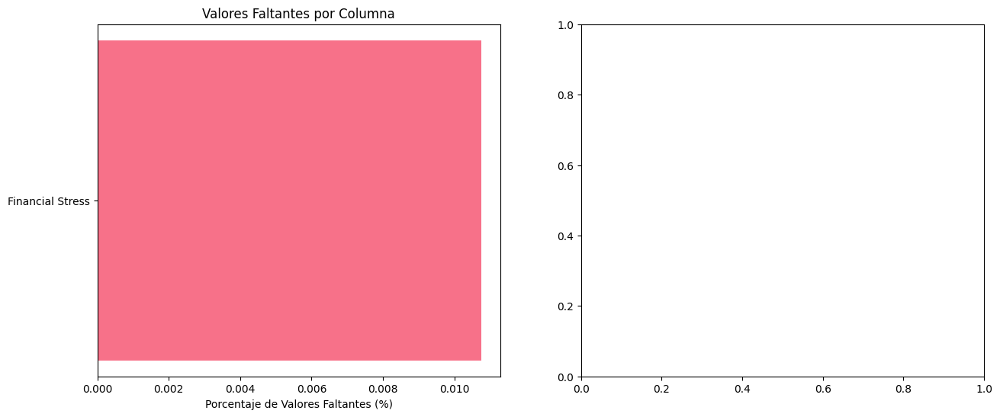

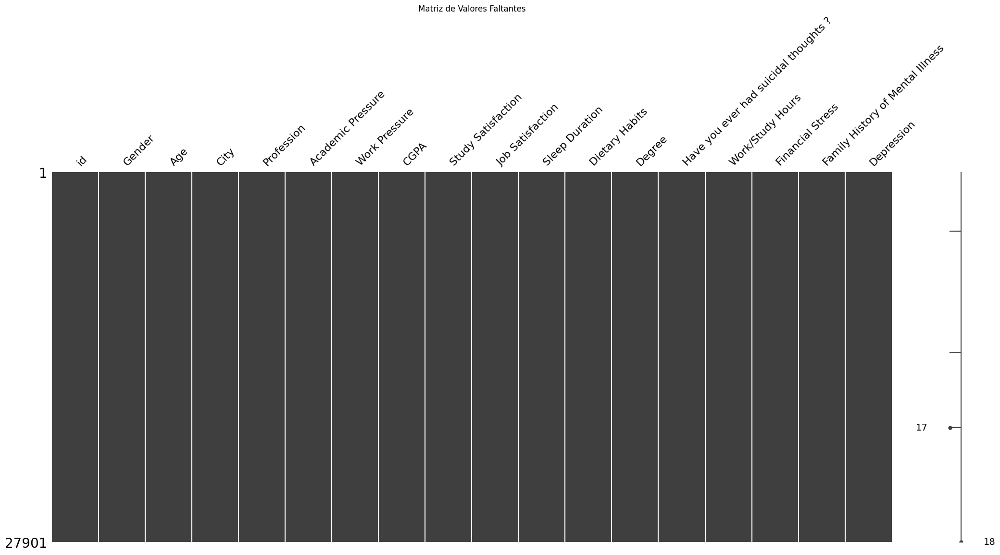


 PATRONES DE VALORES FALTANTES:
   • Filas sin valores faltantes: 27898
   • Filas con al menos 1 valor faltante: 3
   • Máximo de valores faltantes por fila: 1

 ANÁLISIS DE COLUMNAS NUMÉRICAS
 ESTADÍSTICAS DETALLADAS:


,Columna,Tipo,No_Nulos,Nulos,Media,Mediana,Std,Min,Max,Skewness,CV
0,id,int64,27901,0,70442.149,70684.00,40641.175,2.0,140699.0,-0.005,57.694
1,Age,float64,27901,0,25.822,25.00,4.906,18.0,59.0,0.132,18.998
2,Academic Pressure,float64,27901,0,3.141,3.00,1.381,0.0,5.0,-0.135,43.979
3,Work Pressure,float64,27901,0,0.000,0.00,0.044,0.0,5.0,108.594,10228.514
4,CGPA,float64,27901,0,7.656,7.77,1.471,0.0,10.0,-0.113,19.210
5,Study Satisfaction,float64,27901,0,2.944,3.00,1.361,0.0,5.0,0.010,46.237
6,Job Satisfaction,float64,27901,0,0.001,0.00,0.044,0.0,4.0,74.106,6519.200
7,Work/Study Hours,float64,27901,0,7.157,8.00,3.708,0.0,12.0,-0.455,51.805
8,Financial Stress,float64,27898,3,3.140,3.00,1.437,1.0,5.0,-0.130,45.777
9,Depression,int64,27901,0,0.585,1.00,0.493,0.0,1.0,-0.347,84.141


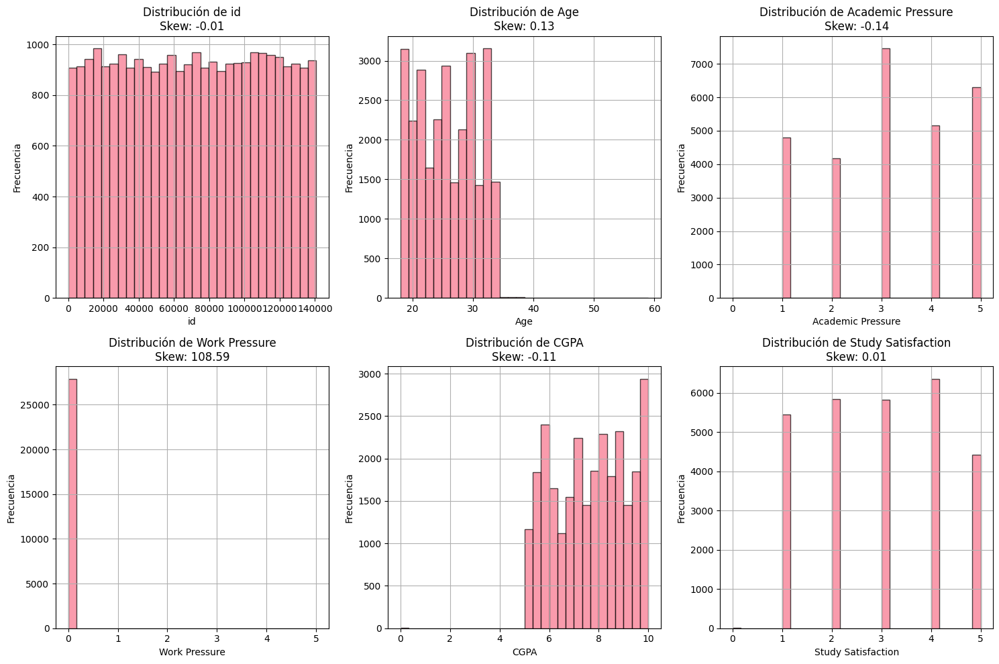

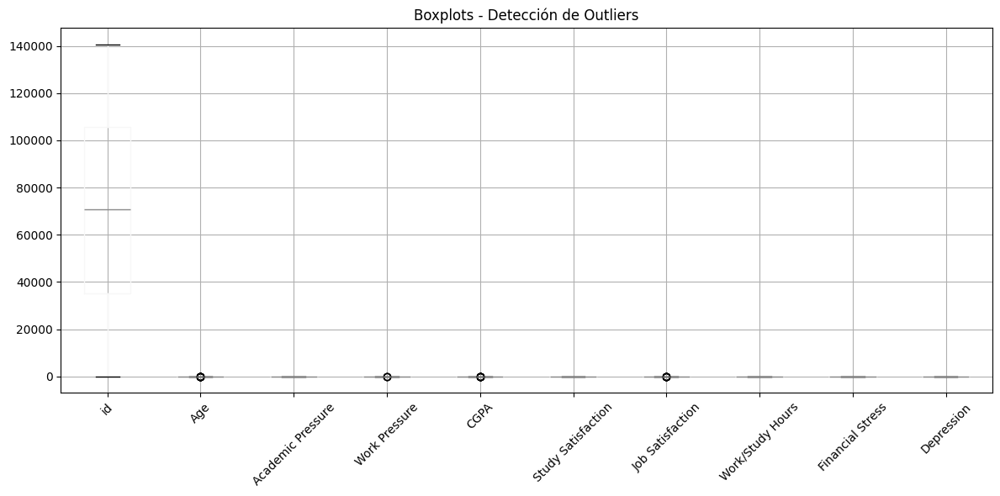


 ANÁLISIS DE COLUMNAS CATEGÓRICAS

 ANÁLISIS DE: Gender
   Valores únicos: 2
   Valor más frecuente: Male
   Frecuencia del valor más común: 15547
   Distribución de valores (top 10):
     Male: 15547 (55.7%)
     Female: 12354 (44.3%)


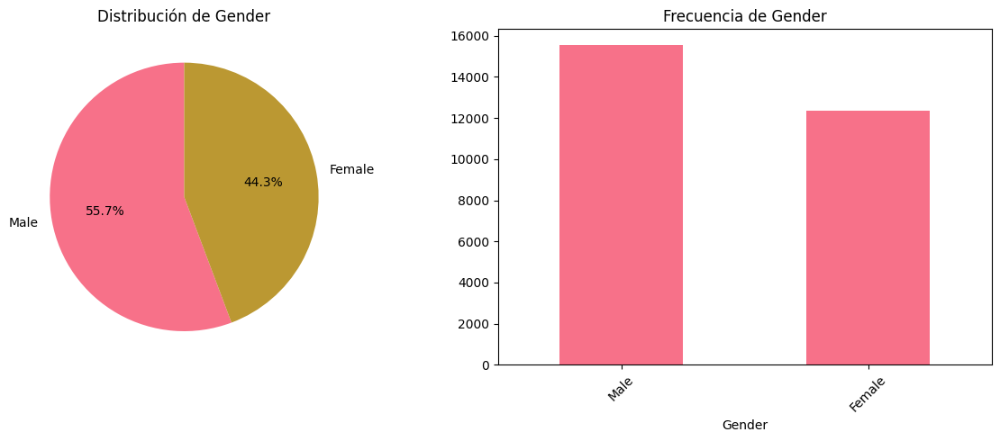


 ANÁLISIS DE: City
   Valores únicos: 52
   Valor más frecuente: Kalyan
   Frecuencia del valor más común: 1570

 ANÁLISIS DE: Profession
   Valores únicos: 14
   Valor más frecuente: Student
   Frecuencia del valor más común: 27870
   Distribución de valores (top 10):
     Student: 27870 (99.9%)
     Architect: 8 (0.0%)
     Teacher: 6 (0.0%)
     Digital Marketer: 3 (0.0%)
     Chef: 2 (0.0%)
     Content Writer: 2 (0.0%)
     Pharmacist: 2 (0.0%)
     Doctor: 2 (0.0%)
     UX/UI Designer: 1 (0.0%)
     Civil Engineer: 1 (0.0%)


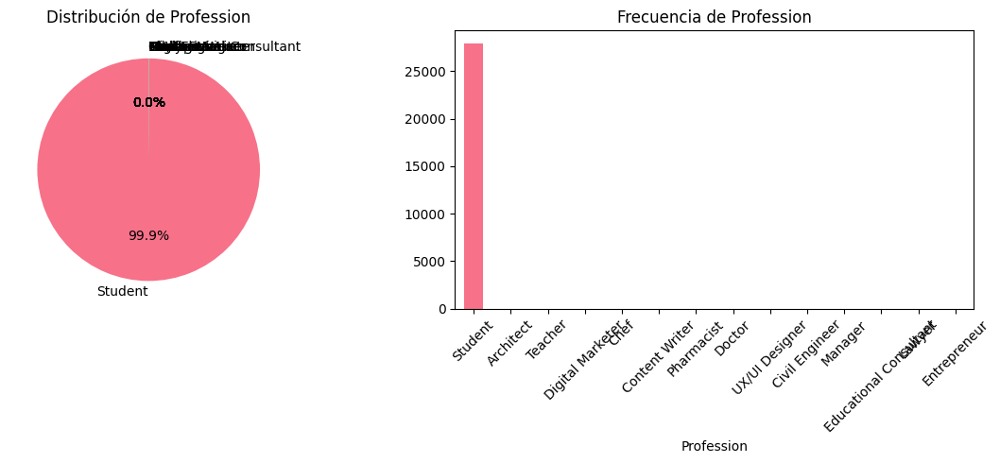


 ANÁLISIS DE: Sleep Duration
   Valores únicos: 5
   Valor más frecuente: Less than 5 hours
   Frecuencia del valor más común: 8310
   Distribución de valores (top 10):
     Less than 5 hours: 8310 (29.8%)
     7-8 hours: 7346 (26.3%)
     5-6 hours: 6183 (22.2%)
     More than 8 hours: 6044 (21.7%)
     Others: 18 (0.1%)


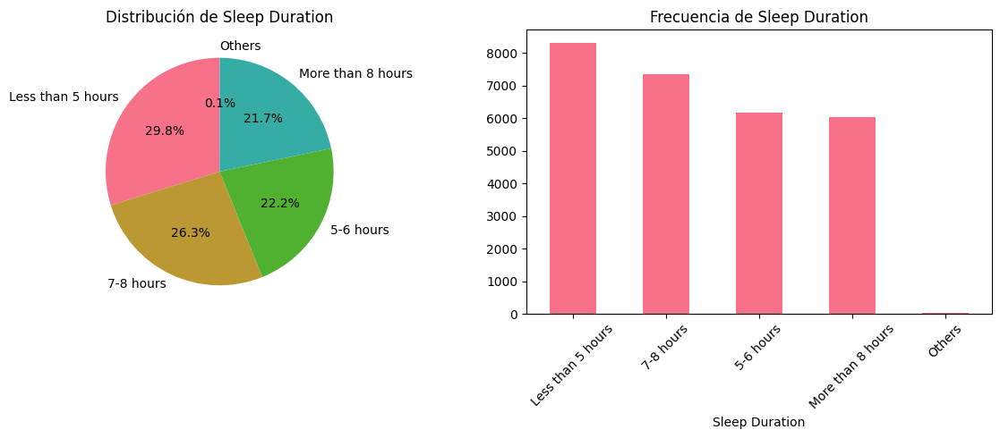


 ANÁLISIS DE: Dietary Habits
   Valores únicos: 4
   Valor más frecuente: Unhealthy
   Frecuencia del valor más común: 10317
   Distribución de valores (top 10):
     Unhealthy: 10317 (37.0%)
     Moderate: 9921 (35.6%)
     Healthy: 7651 (27.4%)
     Others: 12 (0.0%)


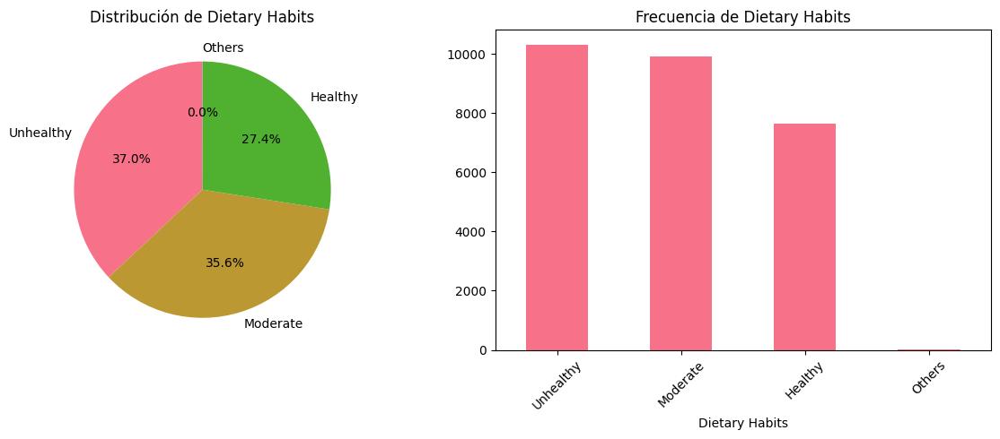


 ANÁLISIS DE: Degree
   Valores únicos: 28
   Valor más frecuente: Class 12
   Frecuencia del valor más común: 6080

 ANÁLISIS DE: Have you ever had suicidal thoughts ?
   Valores únicos: 2
   Valor más frecuente: Yes
   Frecuencia del valor más común: 17656
   Distribución de valores (top 10):
     Yes: 17656 (63.3%)
     No: 10245 (36.7%)


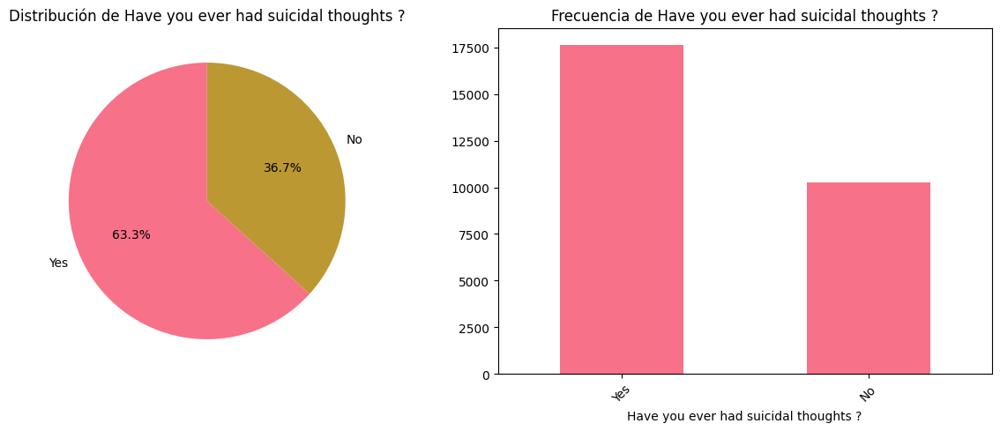


 ANÁLISIS DE: Family History of Mental Illness
   Valores únicos: 2
   Valor más frecuente: No
   Frecuencia del valor más común: 14398
   Distribución de valores (top 10):
     No: 14398 (51.6%)
     Yes: 13503 (48.4%)


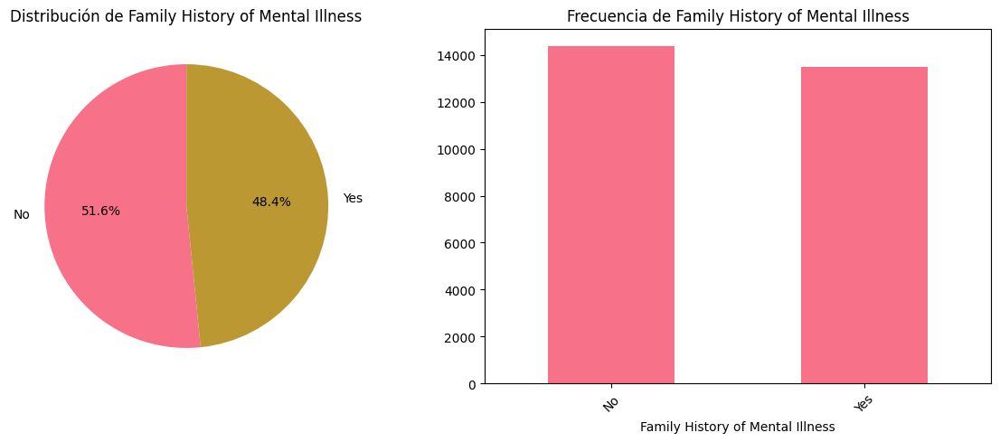


 ANÁLISIS DE CORRELACIONES


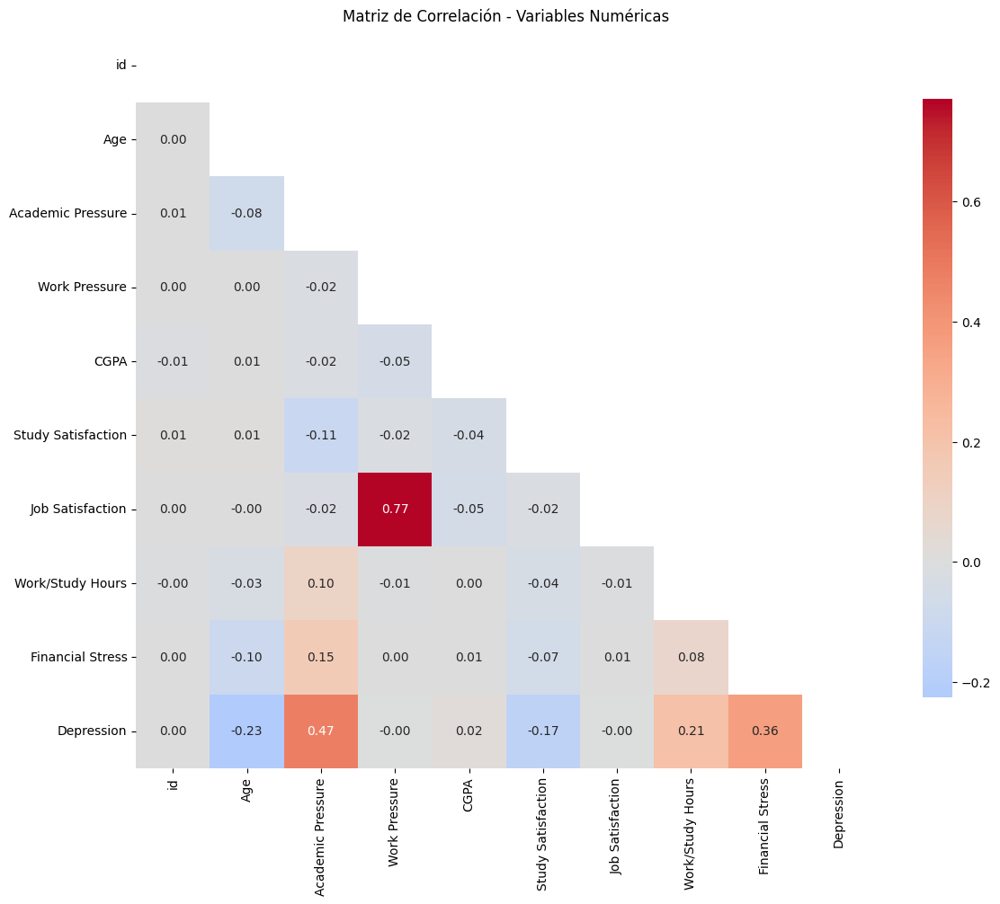


 CORRELACIONES MÁS FUERTES:
   Work Pressure ↔ Job Satisfaction: 0.771 (FUERTE)
   Job Satisfaction ↔ Work Pressure: 0.771 (FUERTE)
   Academic Pressure ↔ Depression: 0.475 (MODERADA)
   Depression ↔ Academic Pressure: 0.475 (MODERADA)
   Financial Stress ↔ Depression: 0.364 (MODERADA)
   Depression ↔ Financial Stress: 0.364 (MODERADA)
   Depression ↔ Age: -0.226 (DÉBIL)
   Age ↔ Depression: -0.226 (DÉBIL)
   Depression ↔ Work/Study Hours: 0.209 (DÉBIL)
   Work/Study Hours ↔ Depression: 0.209 (DÉBIL)

 REPORTE RESUMEN DEL EDA
 INFORMACIÓN GENERAL:
   • Dimensiones: 27901 filas × 18 columnas
   • Memoria usada: 13.89 MB
   • Columnas numéricas: 10
   • Columnas categóricas: 8
   • Columnas datetime: 0

 CALIDAD DE DATOS:
   • Valores faltantes: 3 (0.00%)
   • Filas duplicadas: 0 (0.00%)
   • Columnas constantes: 0

 RECOMENDACIONES:
     Hay valores faltantes - considerar imputación
     Columnas con alta cardinalidad: ['City']

 ANÁLISIS COMPLETADO

 DataFrame disponible como 'analyze

In [11]:
# Script EDA para Dataset CSV - Versión Mejorada
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats
from scipy.stats import norm, skew
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.preprocessing import LabelEncoder
import missingno as msno

# Configuración
warnings.filterwarnings('ignore')
plt.style.use('default')
sns.set_palette("husl")
pd.set_option('display.max_columns', None)

class CSVEDA:
    def __init__(self, path):
        self.path = path
        self.df = None
        self.numeric_columns = []
        self.categorical_columns = []
        self.datetime_columns = []
        self.csv_files = []

    def explore_directory(self):
        """Explora el directorio y encuentra archivos CSV"""
        print(" EXPLORANDO DIRECTORIO")
        print("=" * 50)

        if os.path.isfile(self.path):
            # Es un archivo individual
            if self.path.lower().endswith('.csv'):
                self.csv_files = [self.path]
                print(f" Archivo CSV encontrado: {os.path.basename(self.path)}")
            else:
                print(" El archivo no es un CSV")
                return False

        elif os.path.isdir(self.path):
            # Es un directorio - buscar todos los CSVs
            print(f" Directorio encontrado: {self.path}")
            for file in os.listdir(self.path):
                if file.lower().endswith('.csv'):
                    full_path = os.path.join(self.path, file)
                    self.csv_files.append(full_path)
                    print(f"    {file}")

            if not self.csv_files:
                print(" No se encontraron archivos CSV en el directorio")
                return False
            else:
                print(f" Se encontraron {len(self.csv_files)} archivos CSV")
        else:
            print(" La ruta no existe")
            return False

        return True

    def select_csv_file(self):
        """Permite seleccionar un archivo CSV si hay múltiples"""
        if len(self.csv_files) == 1:
            return self.csv_files[0]
        else:
            print("\n ARCHIVOS CSV DISPONIBLES:")
            for i, file_path in enumerate(self.csv_files):
                file_name = os.path.basename(file_path)
                file_size = os.path.getsize(file_path) / 1024  # KB
                print(f"   {i+1}. {file_name} ({file_size:.1f} KB)")

            try:
                choice = int(input("\n Selecciona el número del archivo a analizar: ")) - 1
                if 0 <= choice < len(self.csv_files):
                    return self.csv_files[choice]
                else:
                    print(" Selección inválida")
                    return None
            except:
                print(" Entrada inválida")
                return None

    def load_data(self, file_path):
        """Carga el dataset CSV específico"""
        print(f"\n CARGANDO DATASET: {os.path.basename(file_path)}")
        print("=" * 50)

        try:
            # Detectar encoding automáticamente
            encodings = ['utf-8', 'latin-1', 'iso-8859-1', 'cp1252', 'windows-1252']
            for encoding in encodings:
                try:
                    self.df = pd.read_csv(file_path, encoding=encoding)
                    print(f" Dataset cargado con encoding: {encoding}")
                    break
                except UnicodeDecodeError:
                    continue

            if self.df is None:
                # Si fallan todos los encodings, usar pandas con error handling
                self.df = pd.read_csv(file_path, encoding='utf-8', errors='ignore')
                print("  Dataset cargado con manejo de errores de encoding")

            print(f" Dimensiones del dataset: {self.df.shape[0]} filas × {self.df.shape[1]} columnas")

            # Mostrar información básica del archivo
            file_size = os.path.getsize(file_path) / 1024  # KB
            print(f" Tamaño del archivo: {file_size:.1f} KB")

            # Clasificar columnas
            self._classify_columns()

        except Exception as e:
            print(f" Error cargando el archivo: {e}")
            return False

        return True

    def _classify_columns(self):
        """Clasifica las columnas por tipo"""
        for col in self.df.columns:
            # Verificar si es datetime
            if self.df[col].dtype == 'object':
                try:
                    # Probar si puede ser convertido a datetime
                    sample_data = self.df[col].dropna().head(100)
                    pd.to_datetime(sample_data)
                    self.df[col] = pd.to_datetime(self.df[col], errors='coerce')
                    self.datetime_columns.append(col)
                    continue
                except:
                    pass

            # Clasificar como numérica o categórica
            if pd.api.types.is_numeric_dtype(self.df[col]):
                self.numeric_columns.append(col)
            else:
                self.categorical_columns.append(col)

        print(f" Columnas numéricas: {len(self.numeric_columns)}")
        print(f" Columnas categóricas: {len(self.categorical_columns)}")
        print(f" Columnas datetime: {len(self.datetime_columns)}")

    def basic_info(self):
        """Muestra información básica del dataset"""
        print("\n INFORMACIÓN BÁSICA DEL DATASET")
        print("=" * 50)

        print(" PRIMERAS 5 FILAS:")
        display(self.df.head())

        print("\n ÚLTIMAS 5 FILAS:")
        display(self.df.tail())

        print("\n INFORMACIÓN DE COLUMNAS:")
        print(self.df.info())

        print("\n ESTADÍSTICAS DESCRIPTIVAS:")
        display(self.df.describe(include='all'))

        print("\n TIPOS DE DATOS:")
        dtype_counts = self.df.dtypes.value_counts()
        for dtype, count in dtype_counts.items():
            print(f"   {dtype}: {count} columnas")

    def analyze_missing_values(self):
        """Analiza valores faltantes"""
        print("\n ANÁLISIS DE VALORES FALTANTES")
        print("=" * 50)

        # Estadísticas de missing values
        missing_total = self.df.isnull().sum()
        missing_percent = (self.df.isnull().sum() / len(self.df)) * 100

        missing_df = pd.DataFrame({
            'Columna': self.df.columns,
            'Valores_Faltantes': missing_total,
            'Porcentaje': missing_percent
        }).sort_values('Porcentaje', ascending=False)

        print(" RESUMEN DE VALORES FALTANTES:")
        display(missing_df[missing_df['Valores_Faltantes'] > 0])

        if missing_df['Valores_Faltantes'].sum() == 0:
            print(" No hay valores faltantes en el dataset")
            return

        # Visualización de missing values
        plt.figure(figsize=(15, 6))

        plt.subplot(1, 2, 1)
        missing_plot = missing_df[missing_df['Porcentaje'] > 0]
        if not missing_plot.empty:
            plt.barh(missing_plot['Columna'], missing_plot['Porcentaje'])
            plt.xlabel('Porcentaje de Valores Faltantes (%)')
            plt.title('Valores Faltantes por Columna')
        else:
            plt.text(0.5, 0.5, 'No hay valores faltantes',
                    ha='center', va='center', transform=plt.gca().transAxes)

        plt.subplot(1, 2, 2)
        msno.matrix(self.df)
        plt.title('Matriz de Valores Faltantes')

        plt.tight_layout()
        plt.show()

        # Análisis de patrones de missing values
        print("\n PATRONES DE VALORES FALTANTES:")
        missing_pattern = self.df.isnull().sum(axis=1)
        print(f"   • Filas sin valores faltantes: {len(missing_pattern[missing_pattern == 0])}")
        print(f"   • Filas con al menos 1 valor faltante: {len(missing_pattern[missing_pattern > 0])}")
        print(f"   • Máximo de valores faltantes por fila: {missing_pattern.max()}")

    def analyze_numeric_columns(self):
        """Análisis detallado de columnas numéricas"""
        if not self.numeric_columns:
            print(" No hay columnas numéricas para analizar")
            return

        print("\n ANÁLISIS DE COLUMNAS NUMÉRICAS")
        print("=" * 50)

        # Estadísticas por columna numérica
        numeric_stats = []
        for col in self.numeric_columns:
            stats_dict = {
                'Columna': col,
                'Tipo': self.df[col].dtype,
                'No_Nulos': self.df[col].count(),
                'Nulos': self.df[col].isnull().sum(),
                'Media': self.df[col].mean(),
                'Mediana': self.df[col].median(),
                'Std': self.df[col].std(),
                'Min': self.df[col].min(),
                'Max': self.df[col].max(),
                'Skewness': self.df[col].skew(),
                'CV': (self.df[col].std() / self.df[col].mean()) * 100 if self.df[col].mean() != 0 else np.inf
            }
            numeric_stats.append(stats_dict)

        stats_df = pd.DataFrame(numeric_stats)
        print(" ESTADÍSTICAS DETALLADAS:")
        display(stats_df.round(3))

        # Visualizaciones
        n_numeric = len(self.numeric_columns)
        if n_numeric > 0:
            # Distribuciones - máximo 6 columnas por gráfico
            cols_to_plot = self.numeric_columns[:6]
            n_cols = len(cols_to_plot)

            if n_cols > 0:
                fig, axes = plt.subplots(2, 3, figsize=(15, 10))
                axes = axes.ravel()

                for i, col in enumerate(cols_to_plot):
                    if i < len(axes):
                        self.df[col].hist(bins=30, ax=axes[i], alpha=0.7, edgecolor='black')
                        axes[i].set_title(f'Distribución de {col}\nSkew: {self.df[col].skew():.2f}')
                        axes[i].set_xlabel(col)
                        axes[i].set_ylabel('Frecuencia')

                # Ocultar ejes sobrantes
                for i in range(n_cols, len(axes)):
                    axes[i].set_visible(False)

                plt.tight_layout()
                plt.show()

            # Boxplots para detectar outliers
            if n_numeric > 0:
                plt.figure(figsize=(12, 6))
                self.df[self.numeric_columns].boxplot()
                plt.title('Boxplots - Detección de Outliers')
                plt.xticks(rotation=45)
                plt.tight_layout()
                plt.show()

    def analyze_categorical_columns(self):
        """Análisis detallado de columnas categóricas"""
        if not self.categorical_columns:
            print(" No hay columnas categóricas para analizar")
            return

        print("\n ANÁLISIS DE COLUMNAS CATEGÓRICAS")
        print("=" * 50)

        for col in self.categorical_columns:
            print(f"\n ANÁLISIS DE: {col}")
            unique_count = self.df[col].nunique()
            print(f"   Valores únicos: {unique_count}")

            if unique_count > 0:
                print(f"   Valor más frecuente: {self.df[col].mode().iloc[0]}")
                print(f"   Frecuencia del valor más común: {self.df[col].value_counts().iloc[0]}")

                if unique_count <= 20:  # Mostrar detalles si no hay demasiadas categorías
                    value_counts = self.df[col].value_counts()
                    print("   Distribución de valores (top 10):")
                    for value, count in value_counts.head(10).items():
                        percentage = (count/len(self.df))*100
                        print(f"     {value}: {count} ({percentage:.1f}%)")

            # Visualización para columnas con pocas categorías
            if unique_count <= 15 and unique_count > 0:
                plt.figure(figsize=(12, 5))

                value_counts = self.df[col].value_counts()

                plt.subplot(1, 2, 1)
                plt.pie(value_counts.values, labels=value_counts.index, autopct='%1.1f%%', startangle=90)
                plt.title(f'Distribución de {col}')

                plt.subplot(1, 2, 2)
                value_counts.plot(kind='bar')
                plt.title(f'Frecuencia de {col}')
                plt.xticks(rotation=45)

                plt.tight_layout()
                plt.show()

    def analyze_correlations(self):
        """Analiza correlaciones entre variables numéricas"""
        if len(self.numeric_columns) < 2:
            print(" No hay suficientes columnas numéricas para análisis de correlación")
            return

        print("\n ANÁLISIS DE CORRELACIONES")
        print("=" * 50)

        # Matriz de correlación
        corr_matrix = self.df[self.numeric_columns].corr()

        plt.figure(figsize=(12, 10))
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
        sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0,
                   square=True, fmt='.2f', cbar_kws={'shrink': .8})
        plt.title('Matriz de Correlación - Variables Numéricas')
        plt.tight_layout()
        plt.show()

        # Identificar correlaciones fuertes
        print("\n CORRELACIONES MÁS FUERTES:")
        corr_pairs = corr_matrix.unstack().sort_values(key=abs, ascending=False)
        strong_corrs = corr_pairs[~corr_pairs.index.duplicated(keep='first')]
        strong_corrs = strong_corrs[strong_corrs != 1.0]

        for idx, ((col1, col2), corr) in enumerate(strong_corrs.head(10).items()):
            strength = "FUERTE" if abs(corr) > 0.7 else "MODERADA" if abs(corr) > 0.3 else "DÉBIL"
            print(f"   {col1} ↔ {col2}: {corr:.3f} ({strength})")

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA")
        print("=" * 50)

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Dimensiones: {self.df.shape[0]} filas × {self.df.shape[1]} columnas")
        print(f"   • Memoria usada: {self.df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
        print(f"   • Columnas numéricas: {len(self.numeric_columns)}")
        print(f"   • Columnas categóricas: {len(self.categorical_columns)}")
        print(f"   • Columnas datetime: {len(self.datetime_columns)}")

        print("\n CALIDAD DE DATOS:")
        missing_total = self.df.isnull().sum().sum()
        missing_percent = (missing_total / (self.df.shape[0] * self.df.shape[1])) * 100
        print(f"   • Valores faltantes: {missing_total} ({missing_percent:.2f}%)")

        duplicate_rows = self.df.duplicated().sum()
        duplicate_percent = (duplicate_rows / self.df.shape[0]) * 100
        print(f"   • Filas duplicadas: {duplicate_rows} ({duplicate_percent:.2f}%)")

        # Columnas con un solo valor
        constant_columns = [col for col in self.df.columns if self.df[col].nunique() <= 1]
        print(f"   • Columnas constantes: {len(constant_columns)}")

        print("\n RECOMENDACIONES:")

        if missing_total > 0:
            print("     Hay valores faltantes - considerar imputación")

        if duplicate_rows > 0:
            print("     Hay filas duplicadas - considerar eliminación")

        if constant_columns:
            print(f"     Columnas constantes: {constant_columns} - considerar eliminación")

        # Verificar columnas con alta cardinalidad
        high_cardinality = [col for col in self.categorical_columns if self.df[col].nunique() > 50]
        if high_cardinality:
            print(f"     Columnas con alta cardinalidad: {high_cardinality}")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET CSV")
        print("=" * 60)

        # Primero explorar el directorio/archivo
        if not self.explore_directory():
            return None

        # Seleccionar archivo si hay múltiples
        selected_file = self.select_csv_file()
        if not selected_file:
            return None

        # Cargar y analizar el dataset
        if not self.load_data(selected_file):
            return None

        self.basic_info()
        self.analyze_missing_values()
        self.analyze_numeric_columns()
        self.analyze_categorical_columns()
        self.analyze_correlations()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.df

# USO DEL SCRIPT MEJORADO
if __name__ == "__main__":
    # Ahora puedes pasar tanto archivos como directorios
    path = "/content/Machine_learning_I/Dataset/csv_Student_Depression_Dataset/Student_Depression_Dataset.csv"  # Tu directorio

    # Crear instancia y ejecutar análisis
    csv_eda = CSVEDA(path)
    analyzed_df = csv_eda.run_complete_analysis()

    # El DataFrame analizado queda disponible para uso posterior
    if analyzed_df is not None:
        print(f"\n DataFrame disponible como 'analyzed_df' con {analyzed_df.shape} dimensiones")
        print(f" Columnas disponibles: {list(analyzed_df.columns)}")

        # Guardar el análisis en un archivo
        try:
            analyzed_df.to_csv('/content/Machine_learning_I/Dataset/csv_Student_Depression_Dataset/Student_Depression_Dataset.csv', index=False)
            print(" Dataset analizado guardado como '/content/Machine_learning_I/Dataset/csv_Student_Depression_Dataset/Student_Depression_Dataset.csv'")
        except:
            print("  No se pudo guardar el dataset analizado")

Student_Depression_Dataset

 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET CSV
 EXPLORANDO DIRECTORIO
 Archivo CSV encontrado: cardata.csv

 CARGANDO DATASET: cardata.csv
 Dataset cargado con encoding: utf-8
 Dimensiones del dataset: 301 filas × 9 columnas
 Tamaño del archivo: 16.5 KB
 Columnas numéricas: 5
 Columnas categóricas: 4
 Columnas datetime: 0

 INFORMACIÓN BÁSICA DEL DATASET
 PRIMERAS 5 FILAS:


,Car_Name,Year,Selling_Price,Present_Price,Kms_Driven,Fuel_Type,Seller_Type,Transmission,Owner
0,ritz,2014,3.35,5.59,27000,Petrol,Dealer,Manual,0
1,sx4,2013,4.75,9.54,43000,Diesel,Dealer,Manual,0
2,ciaz,2017,7.25,9.85,6900,Petrol,Dealer,Manual,0
3,wagon r,2011,2.85,4.15,5200,Petrol,Dealer,Manual,0
4,swift,2014,4.60,6.87,42450,Diesel,Dealer,Manual,0



 ÚLTIMAS 5 FILAS:


,Car_Name,Year,Selling_Price,Present_Price,Kms_Driven,Fuel_Type,Seller_Type,Transmission,Owner
296,city,2016,9.50,11.6,33988,Diesel,Dealer,Manual,0
297,brio,2015,4.00,5.9,60000,Petrol,Dealer,Manual,0
298,city,2009,3.35,11.0,87934,Petrol,Dealer,Manual,0
299,city,2017,11.50,12.5,9000,Diesel,Dealer,Manual,0
300,brio,2016,5.30,5.9,5464,Petrol,Dealer,Manual,0



 INFORMACIÓN DE COLUMNAS:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 301 entries, 0 to 300
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Car_Name       301 non-null    object 
 1   Year           301 non-null    int64  
 2   Selling_Price  301 non-null    float64
 3   Present_Price  301 non-null    float64
 4   Kms_Driven     301 non-null    int64  
 5   Fuel_Type      301 non-null    object 
 6   Seller_Type    301 non-null    object 
 7   Transmission   301 non-null    object 
 8   Owner          301 non-null    int64  
dtypes: float64(2), int64(3), object(4)
memory usage: 21.3+ KB
None

 ESTADÍSTICAS DESCRIPTIVAS:


,Car_Name,Year,Selling_Price,Present_Price,Kms_Driven,Fuel_Type,Seller_Type,Transmission,Owner
count,301,301.000000,301.000000,301.000000,301.000000,301,301,301,301.000000
unique,98,NaN,NaN,NaN,NaN,3,2,2,NaN
top,city,NaN,NaN,NaN,NaN,Petrol,Dealer,Manual,NaN
freq,26,NaN,NaN,NaN,NaN,239,195,261,NaN
mean,NaN,2013.627907,4.661296,7.628472,36947.205980,NaN,NaN,NaN,0.043189
std,NaN,2.891554,5.082812,8.644115,38886.883882,NaN,NaN,NaN,0.247915
min,NaN,2003.000000,0.100000,0.320000,500.000000,NaN,NaN,NaN,0.000000
25%,NaN,2012.000000,0.900000,1.200000,15000.000000,NaN,NaN,NaN,0.000000
50%,NaN,2014.000000,3.600000,6.400000,32000.000000,NaN,NaN,NaN,0.000000
75%,NaN,2016.000000,6.000000,9.900000,48767.000000,NaN,NaN,NaN,0.000000



 TIPOS DE DATOS:
   object: 4 columnas
   int64: 3 columnas
   float64: 2 columnas

 ANÁLISIS DE VALORES FALTANTES
 RESUMEN DE VALORES FALTANTES:


,Columna,Valores_Faltantes,Porcentaje


 No hay valores faltantes en el dataset

 ANÁLISIS DE COLUMNAS NUMÉRICAS
 ESTADÍSTICAS DETALLADAS:


,Columna,Tipo,No_Nulos,Nulos,Media,Mediana,Std,Min,Max,Skewness,CV
0,Year,int64,301,0,2013.628,2014.0,2.892,2003.00,2018.0,-1.246,0.144
1,Selling_Price,float64,301,0,4.661,3.6,5.083,0.10,35.0,2.493,109.043
2,Present_Price,float64,301,0,7.628,6.4,8.644,0.32,92.6,4.083,113.314
3,Kms_Driven,int64,301,0,36947.206,32000.0,38886.884,500.00,500000.0,6.436,105.250
4,Owner,int64,301,0,0.043,0.0,0.248,0.00,3.0,7.617,574.018


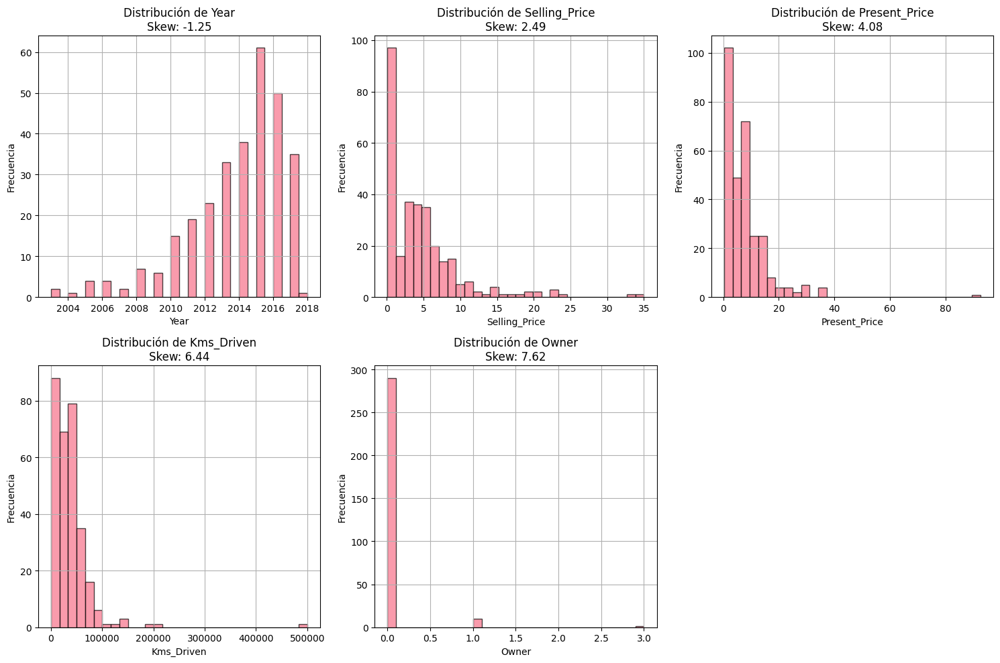

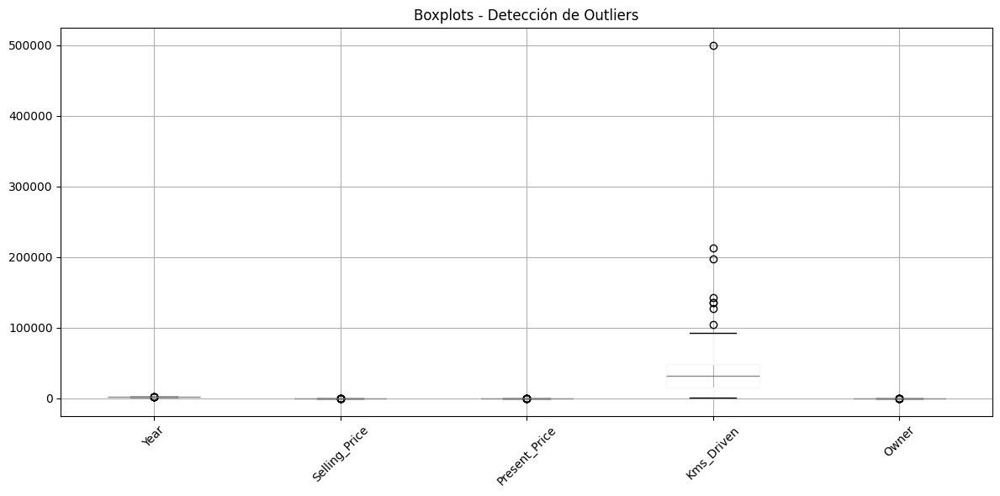


 ANÁLISIS DE COLUMNAS CATEGÓRICAS

 ANÁLISIS DE: Car_Name
   Valores únicos: 98
   Valor más frecuente: city
   Frecuencia del valor más común: 26

 ANÁLISIS DE: Fuel_Type
   Valores únicos: 3
   Valor más frecuente: Petrol
   Frecuencia del valor más común: 239
   Distribución de valores (top 10):
     Petrol: 239 (79.4%)
     Diesel: 60 (19.9%)
     CNG: 2 (0.7%)


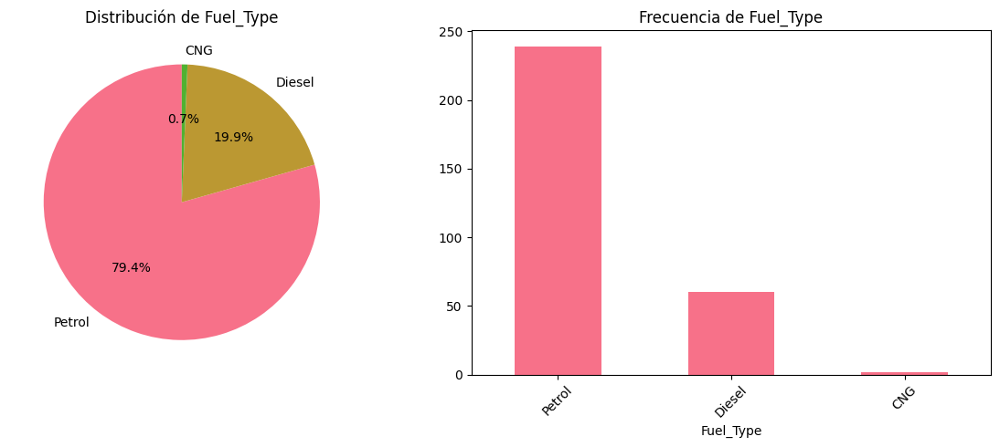


 ANÁLISIS DE: Seller_Type
   Valores únicos: 2
   Valor más frecuente: Dealer
   Frecuencia del valor más común: 195
   Distribución de valores (top 10):
     Dealer: 195 (64.8%)
     Individual: 106 (35.2%)


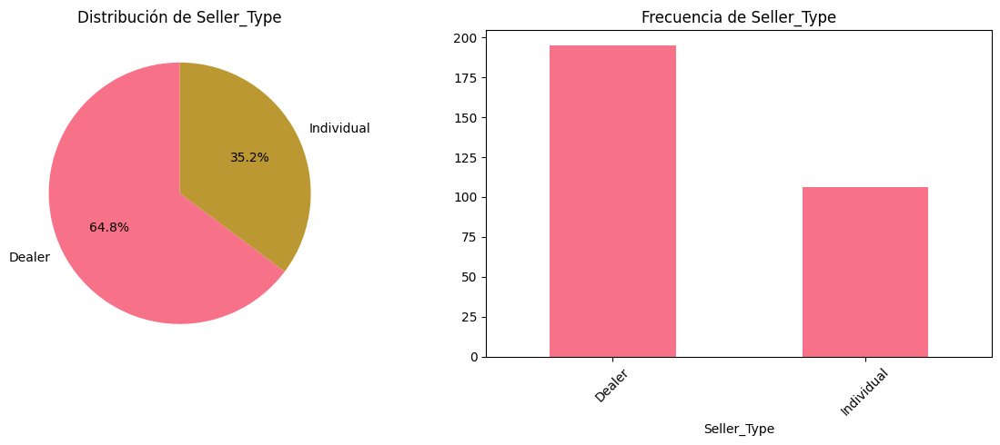


 ANÁLISIS DE: Transmission
   Valores únicos: 2
   Valor más frecuente: Manual
   Frecuencia del valor más común: 261
   Distribución de valores (top 10):
     Manual: 261 (86.7%)
     Automatic: 40 (13.3%)


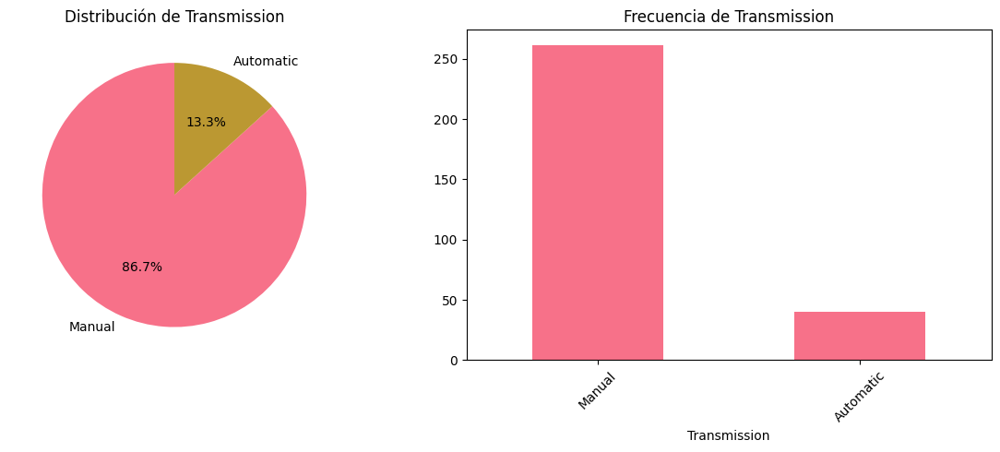


 ANÁLISIS DE CORRELACIONES


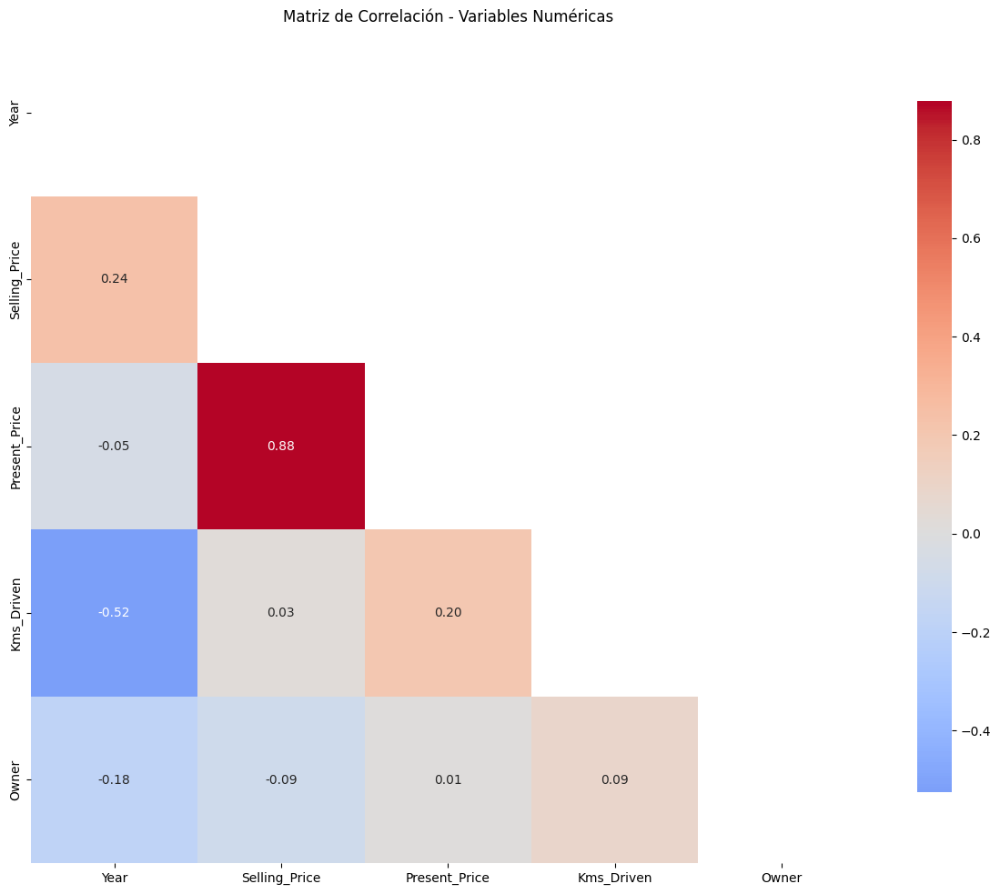


 CORRELACIONES MÁS FUERTES:
   Present_Price ↔ Selling_Price: 0.879 (FUERTE)
   Selling_Price ↔ Present_Price: 0.879 (FUERTE)
   Year ↔ Kms_Driven: -0.524 (MODERADA)
   Kms_Driven ↔ Year: -0.524 (MODERADA)
   Year ↔ Selling_Price: 0.236 (DÉBIL)
   Selling_Price ↔ Year: 0.236 (DÉBIL)
   Present_Price ↔ Kms_Driven: 0.204 (DÉBIL)
   Kms_Driven ↔ Present_Price: 0.204 (DÉBIL)
   Year ↔ Owner: -0.182 (DÉBIL)
   Owner ↔ Year: -0.182 (DÉBIL)

 REPORTE RESUMEN DEL EDA
 INFORMACIÓN GENERAL:
   • Dimensiones: 301 filas × 9 columnas
   • Memoria usada: 0.08 MB
   • Columnas numéricas: 5
   • Columnas categóricas: 4
   • Columnas datetime: 0

 CALIDAD DE DATOS:
   • Valores faltantes: 0 (0.00%)
   • Filas duplicadas: 2 (0.66%)
   • Columnas constantes: 0

 RECOMENDACIONES:
     Hay filas duplicadas - considerar eliminación
     Columnas con alta cardinalidad: ['Car_Name']

 ANÁLISIS COMPLETADO

 DataFrame disponible como 'analyzed_df' con (301, 9) dimensiones
 Columnas disponibles: ['Car_Name', 'Y

In [12]:
# Script EDA para Dataset CSV - Versión Mejorada
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats
from scipy.stats import norm, skew
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.preprocessing import LabelEncoder
import missingno as msno

# Configuración
warnings.filterwarnings('ignore')
plt.style.use('default')
sns.set_palette("husl")
pd.set_option('display.max_columns', None)

class CSVEDA:
    def __init__(self, path):
        self.path = path
        self.df = None
        self.numeric_columns = []
        self.categorical_columns = []
        self.datetime_columns = []
        self.csv_files = []

    def explore_directory(self):
        """Explora el directorio y encuentra archivos CSV"""
        print(" EXPLORANDO DIRECTORIO")
        print("=" * 50)

        if os.path.isfile(self.path):
            # Es un archivo individual
            if self.path.lower().endswith('.csv'):
                self.csv_files = [self.path]
                print(f" Archivo CSV encontrado: {os.path.basename(self.path)}")
            else:
                print(" El archivo no es un CSV")
                return False

        elif os.path.isdir(self.path):
            # Es un directorio - buscar todos los CSVs
            print(f" Directorio encontrado: {self.path}")
            for file in os.listdir(self.path):
                if file.lower().endswith('.csv'):
                    full_path = os.path.join(self.path, file)
                    self.csv_files.append(full_path)
                    print(f"    {file}")

            if not self.csv_files:
                print(" No se encontraron archivos CSV en el directorio")
                return False
            else:
                print(f" Se encontraron {len(self.csv_files)} archivos CSV")
        else:
            print(" La ruta no existe")
            return False

        return True

    def select_csv_file(self):
        """Permite seleccionar un archivo CSV si hay múltiples"""
        if len(self.csv_files) == 1:
            return self.csv_files[0]
        else:
            print("\n ARCHIVOS CSV DISPONIBLES:")
            for i, file_path in enumerate(self.csv_files):
                file_name = os.path.basename(file_path)
                file_size = os.path.getsize(file_path) / 1024  # KB
                print(f"   {i+1}. {file_name} ({file_size:.1f} KB)")

            try:
                choice = int(input("\n Selecciona el número del archivo a analizar: ")) - 1
                if 0 <= choice < len(self.csv_files):
                    return self.csv_files[choice]
                else:
                    print(" Selección inválida")
                    return None
            except:
                print(" Entrada inválida")
                return None

    def load_data(self, file_path):
        """Carga el dataset CSV específico"""
        print(f"\n CARGANDO DATASET: {os.path.basename(file_path)}")
        print("=" * 50)

        try:
            # Detectar encoding automáticamente
            encodings = ['utf-8', 'latin-1', 'iso-8859-1', 'cp1252', 'windows-1252']
            for encoding in encodings:
                try:
                    self.df = pd.read_csv(file_path, encoding=encoding)
                    print(f" Dataset cargado con encoding: {encoding}")
                    break
                except UnicodeDecodeError:
                    continue

            if self.df is None:
                # Si fallan todos los encodings, usar pandas con error handling
                self.df = pd.read_csv(file_path, encoding='utf-8', errors='ignore')
                print("  Dataset cargado con manejo de errores de encoding")

            print(f" Dimensiones del dataset: {self.df.shape[0]} filas × {self.df.shape[1]} columnas")

            # Mostrar información básica del archivo
            file_size = os.path.getsize(file_path) / 1024  # KB
            print(f" Tamaño del archivo: {file_size:.1f} KB")

            # Clasificar columnas
            self._classify_columns()

        except Exception as e:
            print(f" Error cargando el archivo: {e}")
            return False

        return True

    def _classify_columns(self):
        """Clasifica las columnas por tipo"""
        for col in self.df.columns:
            # Verificar si es datetime
            if self.df[col].dtype == 'object':
                try:
                    # Probar si puede ser convertido a datetime
                    sample_data = self.df[col].dropna().head(100)
                    pd.to_datetime(sample_data)
                    self.df[col] = pd.to_datetime(self.df[col], errors='coerce')
                    self.datetime_columns.append(col)
                    continue
                except:
                    pass

            # Clasificar como numérica o categórica
            if pd.api.types.is_numeric_dtype(self.df[col]):
                self.numeric_columns.append(col)
            else:
                self.categorical_columns.append(col)

        print(f" Columnas numéricas: {len(self.numeric_columns)}")
        print(f" Columnas categóricas: {len(self.categorical_columns)}")
        print(f" Columnas datetime: {len(self.datetime_columns)}")

    def basic_info(self):
        """Muestra información básica del dataset"""
        print("\n INFORMACIÓN BÁSICA DEL DATASET")
        print("=" * 50)

        print(" PRIMERAS 5 FILAS:")
        display(self.df.head())

        print("\n ÚLTIMAS 5 FILAS:")
        display(self.df.tail())

        print("\n INFORMACIÓN DE COLUMNAS:")
        print(self.df.info())

        print("\n ESTADÍSTICAS DESCRIPTIVAS:")
        display(self.df.describe(include='all'))

        print("\n TIPOS DE DATOS:")
        dtype_counts = self.df.dtypes.value_counts()
        for dtype, count in dtype_counts.items():
            print(f"   {dtype}: {count} columnas")

    def analyze_missing_values(self):
        """Analiza valores faltantes"""
        print("\n ANÁLISIS DE VALORES FALTANTES")
        print("=" * 50)

        # Estadísticas de missing values
        missing_total = self.df.isnull().sum()
        missing_percent = (self.df.isnull().sum() / len(self.df)) * 100

        missing_df = pd.DataFrame({
            'Columna': self.df.columns,
            'Valores_Faltantes': missing_total,
            'Porcentaje': missing_percent
        }).sort_values('Porcentaje', ascending=False)

        print(" RESUMEN DE VALORES FALTANTES:")
        display(missing_df[missing_df['Valores_Faltantes'] > 0])

        if missing_df['Valores_Faltantes'].sum() == 0:
            print(" No hay valores faltantes en el dataset")
            return

        # Visualización de missing values
        plt.figure(figsize=(15, 6))

        plt.subplot(1, 2, 1)
        missing_plot = missing_df[missing_df['Porcentaje'] > 0]
        if not missing_plot.empty:
            plt.barh(missing_plot['Columna'], missing_plot['Porcentaje'])
            plt.xlabel('Porcentaje de Valores Faltantes (%)')
            plt.title('Valores Faltantes por Columna')
        else:
            plt.text(0.5, 0.5, 'No hay valores faltantes',
                    ha='center', va='center', transform=plt.gca().transAxes)

        plt.subplot(1, 2, 2)
        msno.matrix(self.df)
        plt.title('Matriz de Valores Faltantes')

        plt.tight_layout()
        plt.show()

        # Análisis de patrones de missing values
        print("\n PATRONES DE VALORES FALTANTES:")
        missing_pattern = self.df.isnull().sum(axis=1)
        print(f"   • Filas sin valores faltantes: {len(missing_pattern[missing_pattern == 0])}")
        print(f"   • Filas con al menos 1 valor faltante: {len(missing_pattern[missing_pattern > 0])}")
        print(f"   • Máximo de valores faltantes por fila: {missing_pattern.max()}")

    def analyze_numeric_columns(self):
        """Análisis detallado de columnas numéricas"""
        if not self.numeric_columns:
            print(" No hay columnas numéricas para analizar")
            return

        print("\n ANÁLISIS DE COLUMNAS NUMÉRICAS")
        print("=" * 50)

        # Estadísticas por columna numérica
        numeric_stats = []
        for col in self.numeric_columns:
            stats_dict = {
                'Columna': col,
                'Tipo': self.df[col].dtype,
                'No_Nulos': self.df[col].count(),
                'Nulos': self.df[col].isnull().sum(),
                'Media': self.df[col].mean(),
                'Mediana': self.df[col].median(),
                'Std': self.df[col].std(),
                'Min': self.df[col].min(),
                'Max': self.df[col].max(),
                'Skewness': self.df[col].skew(),
                'CV': (self.df[col].std() / self.df[col].mean()) * 100 if self.df[col].mean() != 0 else np.inf
            }
            numeric_stats.append(stats_dict)

        stats_df = pd.DataFrame(numeric_stats)
        print(" ESTADÍSTICAS DETALLADAS:")
        display(stats_df.round(3))

        # Visualizaciones
        n_numeric = len(self.numeric_columns)
        if n_numeric > 0:
            # Distribuciones - máximo 6 columnas por gráfico
            cols_to_plot = self.numeric_columns[:6]
            n_cols = len(cols_to_plot)

            if n_cols > 0:
                fig, axes = plt.subplots(2, 3, figsize=(15, 10))
                axes = axes.ravel()

                for i, col in enumerate(cols_to_plot):
                    if i < len(axes):
                        self.df[col].hist(bins=30, ax=axes[i], alpha=0.7, edgecolor='black')
                        axes[i].set_title(f'Distribución de {col}\nSkew: {self.df[col].skew():.2f}')
                        axes[i].set_xlabel(col)
                        axes[i].set_ylabel('Frecuencia')

                # Ocultar ejes sobrantes
                for i in range(n_cols, len(axes)):
                    axes[i].set_visible(False)

                plt.tight_layout()
                plt.show()

            # Boxplots para detectar outliers
            if n_numeric > 0:
                plt.figure(figsize=(12, 6))
                self.df[self.numeric_columns].boxplot()
                plt.title('Boxplots - Detección de Outliers')
                plt.xticks(rotation=45)
                plt.tight_layout()
                plt.show()

    def analyze_categorical_columns(self):
        """Análisis detallado de columnas categóricas"""
        if not self.categorical_columns:
            print(" No hay columnas categóricas para analizar")
            return

        print("\n ANÁLISIS DE COLUMNAS CATEGÓRICAS")
        print("=" * 50)

        for col in self.categorical_columns:
            print(f"\n ANÁLISIS DE: {col}")
            unique_count = self.df[col].nunique()
            print(f"   Valores únicos: {unique_count}")

            if unique_count > 0:
                print(f"   Valor más frecuente: {self.df[col].mode().iloc[0]}")
                print(f"   Frecuencia del valor más común: {self.df[col].value_counts().iloc[0]}")

                if unique_count <= 20:  # Mostrar detalles si no hay demasiadas categorías
                    value_counts = self.df[col].value_counts()
                    print("   Distribución de valores (top 10):")
                    for value, count in value_counts.head(10).items():
                        percentage = (count/len(self.df))*100
                        print(f"     {value}: {count} ({percentage:.1f}%)")

            # Visualización para columnas con pocas categorías
            if unique_count <= 15 and unique_count > 0:
                plt.figure(figsize=(12, 5))

                value_counts = self.df[col].value_counts()

                plt.subplot(1, 2, 1)
                plt.pie(value_counts.values, labels=value_counts.index, autopct='%1.1f%%', startangle=90)
                plt.title(f'Distribución de {col}')

                plt.subplot(1, 2, 2)
                value_counts.plot(kind='bar')
                plt.title(f'Frecuencia de {col}')
                plt.xticks(rotation=45)

                plt.tight_layout()
                plt.show()

    def analyze_correlations(self):
        """Analiza correlaciones entre variables numéricas"""
        if len(self.numeric_columns) < 2:
            print(" No hay suficientes columnas numéricas para análisis de correlación")
            return

        print("\n ANÁLISIS DE CORRELACIONES")
        print("=" * 50)

        # Matriz de correlación
        corr_matrix = self.df[self.numeric_columns].corr()

        plt.figure(figsize=(12, 10))
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
        sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0,
                   square=True, fmt='.2f', cbar_kws={'shrink': .8})
        plt.title('Matriz de Correlación - Variables Numéricas')
        plt.tight_layout()
        plt.show()

        # Identificar correlaciones fuertes
        print("\n CORRELACIONES MÁS FUERTES:")
        corr_pairs = corr_matrix.unstack().sort_values(key=abs, ascending=False)
        strong_corrs = corr_pairs[~corr_pairs.index.duplicated(keep='first')]
        strong_corrs = strong_corrs[strong_corrs != 1.0]

        for idx, ((col1, col2), corr) in enumerate(strong_corrs.head(10).items()):
            strength = "FUERTE" if abs(corr) > 0.7 else "MODERADA" if abs(corr) > 0.3 else "DÉBIL"
            print(f"   {col1} ↔ {col2}: {corr:.3f} ({strength})")

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA")
        print("=" * 50)

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Dimensiones: {self.df.shape[0]} filas × {self.df.shape[1]} columnas")
        print(f"   • Memoria usada: {self.df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
        print(f"   • Columnas numéricas: {len(self.numeric_columns)}")
        print(f"   • Columnas categóricas: {len(self.categorical_columns)}")
        print(f"   • Columnas datetime: {len(self.datetime_columns)}")

        print("\n CALIDAD DE DATOS:")
        missing_total = self.df.isnull().sum().sum()
        missing_percent = (missing_total / (self.df.shape[0] * self.df.shape[1])) * 100
        print(f"   • Valores faltantes: {missing_total} ({missing_percent:.2f}%)")

        duplicate_rows = self.df.duplicated().sum()
        duplicate_percent = (duplicate_rows / self.df.shape[0]) * 100
        print(f"   • Filas duplicadas: {duplicate_rows} ({duplicate_percent:.2f}%)")

        # Columnas con un solo valor
        constant_columns = [col for col in self.df.columns if self.df[col].nunique() <= 1]
        print(f"   • Columnas constantes: {len(constant_columns)}")

        print("\n RECOMENDACIONES:")

        if missing_total > 0:
            print("     Hay valores faltantes - considerar imputación")

        if duplicate_rows > 0:
            print("     Hay filas duplicadas - considerar eliminación")

        if constant_columns:
            print(f"     Columnas constantes: {constant_columns} - considerar eliminación")

        # Verificar columnas con alta cardinalidad
        high_cardinality = [col for col in self.categorical_columns if self.df[col].nunique() > 50]
        if high_cardinality:
            print(f"     Columnas con alta cardinalidad: {high_cardinality}")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET CSV")
        print("=" * 60)

        # Primero explorar el directorio/archivo
        if not self.explore_directory():
            return None

        # Seleccionar archivo si hay múltiples
        selected_file = self.select_csv_file()
        if not selected_file:
            return None

        # Cargar y analizar el dataset
        if not self.load_data(selected_file):
            return None

        self.basic_info()
        self.analyze_missing_values()
        self.analyze_numeric_columns()
        self.analyze_categorical_columns()
        self.analyze_correlations()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.df

# USO DEL SCRIPT MEJORADO
if __name__ == "__main__":
    # Ahora puedes pasar tanto archivos como directorios
    path = "/content/Machine_learning_I/Dataset/csv_datacar/cardata.csv"  # Tu directorio

    # Crear instancia y ejecutar análisis
    csv_eda = CSVEDA(path)
    analyzed_df = csv_eda.run_complete_analysis()

    # El DataFrame analizado queda disponible para uso posterior
    if analyzed_df is not None:
        print(f"\n DataFrame disponible como 'analyzed_df' con {analyzed_df.shape} dimensiones")
        print(f" Columnas disponibles: {list(analyzed_df.columns)}")

        # Guardar el análisis en un archivo
        try:
            analyzed_df.to_csv('/content/Machine_learning_I/Dataset/csv_datacar/cardata.csv', index=False)
            print(" Dataset analizado guardado como '/content/Machine_learning_I/Dataset/csv_datacar/cardata.csv'")
        except:
            print("  No se pudo guardar el dataset analizado")

csv_health_lifestyle_classification

 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET CSV
 EXPLORANDO DIRECTORIO
 Archivo CSV encontrado: health_lifestyle_classification.csv

 CARGANDO DATASET: health_lifestyle_classification.csv
 Dataset cargado con encoding: utf-8
 Dimensiones del dataset: 100000 filas × 48 columnas
 Tamaño del archivo: 51739.1 KB
 Columnas numéricas: 30
 Columnas categóricas: 18
 Columnas datetime: 0

 INFORMACIÓN BÁSICA DEL DATASET
 PRIMERAS 5 FILAS:


,survey_code,age,gender,height,weight,bmi,bmi_estimated,bmi_scaled,bmi_corrected,waist_size,blood_pressure,heart_rate,cholesterol,glucose,insulin,sleep_hours,sleep_quality,work_hours,physical_activity,daily_steps,calorie_intake,sugar_intake,alcohol_consumption,smoking_level,water_intake,screen_time,stress_level,mental_health_score,mental_health_support,education_level,job_type,occupation,income,diet_type,exercise_type,device_usage,healthcare_access,insurance,sunlight_exposure,meals_per_day,caffeine_intake,family_history,pet_owner,electrolyte_level,gene_marker_flag,environmental_risk_score,daily_supplement_dosage,target
0,1,56,Male,173.416872,56.886640,18.915925,18.915925,56.747776,18.989117,72.165130,118.264254,60.749825,214.580523,103.008176,NaN,6.475885,Fair,7.671313,0.356918,13320.942595,2673.546960,44.476887,NaN,Non-smoker,1.694262,5.003963,2,8,No,PhD,Tech,Farmer,6759.821719,Vegan,Strength,High,Poor,No,High,5,Moderate,No,Yes,0,1.0,5.5,-2.275502,healthy
1,2,69,Female,163.207380,97.799859,36.716278,36.716278,110.148833,36.511417,85.598889,117.917986,66.463696,115.794002,116.905134,10.131597,8.428410,Good,9.515198,0.568219,11911.201401,2650.376972,74.663405,Regularly,Light,0.716409,5.925455,3,9,No,High School,Office,Engineer,6240.517690,Vegan,Cardio,Moderate,Moderate,No,High,5,High,Yes,No,0,1.0,5.5,6.239340,healthy
2,3,46,Male,177.281966,80.687562,25.673050,25.673050,77.019151,25.587429,90.295030,123.073698,76.043212,138.134787,89.180302,NaN,5.702164,Poor,5.829853,3.764406,2974.035375,1746.755144,19.702382,Regularly,Heavy,2.487900,4.371250,0,1,No,Master,Office,Teacher,3429.179266,Vegan,Cardio,High,Good,Yes,High,4,Moderate,No,No,0,1.0,5.5,5.423737,healthy
3,4,32,Female,172.101255,63.142868,21.318480,21.318480,63.955440,21.177109,100.504211,148.173453,68.781981,203.017447,128.375798,18.733179,5.188316,Good,9.489693,0.889474,5321.539497,2034.193242,82.580050,Occasionally,Heavy,2.643335,4.116064,10,4,No,Master,Labor,Teacher,2618.503534,Vegetarian,Mixed,Low,Moderate,No,High,1,NaN,No,Yes,0,1.0,5.5,8.388611,healthy
4,5,60,Female,163.608816,40.000000,14.943302,14.943302,44.829907,14.844299,69.021150,150.613181,92.335358,200.412439,94.813332,16.038701,7.912514,Good,7.275450,2.901608,9791.376712,2386.210257,45.961322,NaN,Heavy,1.968393,3.180087,9,7,Yes,Master,Unemployed,Doctor,3662.086276,Vegan,NaN,Low,Moderate,Yes,High,1,High,Yes,Yes,0,1.0,5.5,0.332622,healthy



 ÚLTIMAS 5 FILAS:


,survey_code,age,gender,height,weight,bmi,bmi_estimated,bmi_scaled,bmi_corrected,waist_size,blood_pressure,heart_rate,cholesterol,glucose,insulin,sleep_hours,sleep_quality,work_hours,physical_activity,daily_steps,calorie_intake,sugar_intake,alcohol_consumption,smoking_level,water_intake,screen_time,stress_level,mental_health_score,mental_health_support,education_level,job_type,occupation,income,diet_type,exercise_type,device_usage,healthcare_access,insurance,sunlight_exposure,meals_per_day,caffeine_intake,family_history,pet_owner,electrolyte_level,gene_marker_flag,environmental_risk_score,daily_supplement_dosage,target
99995,99996,53,Male,177.202253,54.303671,17.293811,17.293811,51.881433,17.227616,88.740028,135.090834,75.338212,192.581246,130.804751,17.831593,8.580181,Poor,9.208965,2.016794,8974.813299,1975.933570,58.516664,Regularly,Light,1.885402,8.019683,6,0,No,Bachelor,Office,Teacher,5694.274196,Vegetarian,NaN,Moderate,Poor,No,Moderate,1,High,No,Yes,0,1.0,5.5,3.477124,healthy
99996,99997,22,Male,180.802297,40.033853,12.246712,12.246712,36.740135,12.159473,103.659560,135.181795,56.334527,216.103598,131.181871,17.805608,8.629343,Excellent,8.776421,1.988679,4302.052523,2028.152923,105.170227,Occasionally,Light,0.500000,1.398681,4,10,No,Bachelor,Service,Driver,5953.298400,Keto,Cardio,High,Moderate,No,Moderate,5,NaN,Yes,No,0,1.0,5.5,1.609656,healthy
99997,99998,37,Male,185.540653,84.536847,24.556580,24.556580,73.669741,24.172944,98.920422,146.504768,74.864059,178.481690,84.087533,NaN,6.769285,Good,6.788728,2.018741,NaN,1958.958856,52.222350,Regularly,Heavy,0.931263,6.201348,2,3,Yes,PhD,Tech,Driver,4374.490944,Keto,Mixed,Low,Good,Yes,Low,5,NaN,No,No,0,1.0,5.5,-9.736463,healthy
99998,99999,72,Female,181.796786,56.923335,17.223362,17.223362,51.670087,17.715475,54.559079,100.986759,64.719997,158.981418,83.094321,20.140967,6.723703,Fair,6.383596,5.419878,12127.791539,2161.142582,45.185516,Regularly,Non-smoker,1.278711,5.259159,4,6,Yes,Master,Labor,Artist,4567.470213,Vegetarian,Strength,Low,Poor,Yes,Low,4,High,Yes,Yes,0,1.0,5.5,-4.779376,healthy
99999,100000,37,Male,175.716378,93.017286,30.125841,30.125841,90.377523,30.254072,70.743851,95.728717,NaN,211.742356,82.268003,11.178592,6.486976,Fair,7.887134,4.980099,6753.150656,2347.057568,51.768190,Regularly,Non-smoker,2.162358,11.741999,9,9,Yes,PhD,Labor,Doctor,1745.477124,Omnivore,Strength,Low,Moderate,No,High,4,Moderate,Yes,No,0,1.0,5.5,-2.010351,diseased



 INFORMACIÓN DE COLUMNAS:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 48 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   survey_code               100000 non-null  int64  
 1   age                       100000 non-null  int64  
 2   gender                    100000 non-null  object 
 3   height                    100000 non-null  float64
 4   weight                    100000 non-null  float64
 5   bmi                       100000 non-null  float64
 6   bmi_estimated             100000 non-null  float64
 7   bmi_scaled                100000 non-null  float64
 8   bmi_corrected             100000 non-null  float64
 9   waist_size                100000 non-null  float64
 10  blood_pressure            92331 non-null   float64
 11  heart_rate                85997 non-null   float64
 12  cholesterol               100000 non-null  float64
 13  glucose           

,survey_code,age,gender,height,weight,bmi,bmi_estimated,bmi_scaled,bmi_corrected,waist_size,blood_pressure,heart_rate,cholesterol,glucose,insulin,sleep_hours,sleep_quality,work_hours,physical_activity,daily_steps,calorie_intake,sugar_intake,alcohol_consumption,smoking_level,water_intake,screen_time,stress_level,mental_health_score,mental_health_support,education_level,job_type,occupation,income,diet_type,exercise_type,device_usage,healthcare_access,insurance,sunlight_exposure,meals_per_day,caffeine_intake,family_history,pet_owner,electrolyte_level,gene_marker_flag,environmental_risk_score,daily_supplement_dosage,target
count,100000.000000,100000.000000,100000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,92331.000000,85997.000000,100000.000000,100000.000000,84164.000000,100000.000000,100000,100000.000000,100000.000000,91671.000000,100000.000000,100000.000000,57613,100000,100000.000000,100000.000000,100000.000000,100000.000000,100000,100000,100000,100000,91530.000000,100000,75031,100000,100000,100000,100000,100000.000000,66739,100000,100000,100000.0,89526.0,100000.0,100000.000000,100000
unique,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,2,3,NaN,NaN,NaN,NaN,2,4,6,6,NaN,4,3,3,3,2,3,NaN,2,2,2,NaN,NaN,NaN,NaN,2
top,NaN,NaN,Male,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Good,NaN,NaN,NaN,NaN,NaN,Occasionally,Light,NaN,NaN,NaN,NaN,No,Bachelor,Labor,Doctor,NaN,Vegan,Strength,High,Good,Yes,Low,NaN,Moderate,Yes,No,NaN,NaN,NaN,NaN,healthy
freq,NaN,NaN,50132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25147,NaN,NaN,NaN,NaN,NaN,28831,33437,NaN,NaN,NaN,NaN,50104,25363,16777,16927,NaN,25122,25265,33562,33428,50121,33468,NaN,33371,50055,50153,NaN,NaN,NaN,NaN,70097
mean,50000.500000,48.525990,NaN,170.023707,70.064862,24.493876,24.493876,73.481627,24.494140,84.933043,119.980149,74.969177,189.966438,99.994538,14.988258,7.002008,NaN,8.001331,3.038344,7012.925748,2201.428579,60.047165,NaN,NaN,2.006373,6.021525,4.991600,5.004680,NaN,NaN,NaN,NaN,4038.127284,NaN,NaN,NaN,NaN,NaN,NaN,2.998720,NaN,NaN,NaN,0.0,1.0,5.5,0.015726,NaN
std,28867.657797,17.886768,NaN,9.982798,14.693667,5.951069,5.951069,17.853206,5.954184,12.040314,15.015503,9.941668,29.981934,19.982828,5.002783,1.496821,NaN,1.994723,1.884475,2488.989356,400.516318,19.966850,NaN,NaN,0.688868,2.933835,3.154997,3.164228,NaN,NaN,NaN,NaN,1930.025678,NaN,NaN,NaN,NaN,NaN,NaN,1.414786,NaN,NaN,NaN,0.0,0.0,0.0,5.764489,NaN
min,1.000000,18.000000,NaN,140.000000,40.000000,9.988495,9.988495,29.965484,9.893845,34.093185,59.128168,34.745092,58.410902,12.434931,-6.794483,3.000000,NaN,0.000000,0.000000,1000.000000,527.172360,-27.882444,NaN,NaN,0.500000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,500.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,0.0,1.0,5.5,-9.999895,NaN
25%,25000.750000,33.000000,NaN,163.306615,59.856938,20.271405,20.271405,60.814215,20.271059,76.795185,109.812060,68.275432,169.667738,86.461401,11.627114,5.986781,NaN,6.651093,1.633799,5320.858377,1932.278165,46.504292,NaN,NaN,1.532011,3.971318,2.000000,2.000000,NaN,NaN,NaN,NaN,2665.402843,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,NaN,NaN,NaN,0.0,1.0,5.5,-4.980501,NaN
50%,50000.500000,48.000000,NaN,170.016778,69.924141,24.156734,24.156734,72.470201,24.151699,84.957139,119.951794,75.046211,190.044579,99.986834,14.983414,6.998164,NaN,8.004549,2.971222,7004.285450,2200.992765,60.047905,NaN,NaN,2.000659,5.991171,5.000000,5.000000,NaN,NaN,NaN,NaN,4004.601345,NaN,NaN,NaN,NaN,NaN,NaN,3.000000,NaN,NaN,NaN,0.0,1.0,5.5,0.015589,NaN
75%,75000.250000,64.000000,NaN,176.728920,80.027418,28.258696,28.258696,84.776088,28.247648,93.018713,130.120621,81.685914,210.222005,113.508722,18.361928,8.019219,NaN,9.353669,4.326500,8702.281300,2471.218160,73.476386,NaN,NaN,2.473047,8.024470,8.000000,8.000000,NaN,NaN,NaN,NaN,5360.012694,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,0.0,1.0,5.5,5.008424,NaN



 TIPOS DE DATOS:
   float64: 24 columnas
   object: 18 columnas
   int64: 6 columnas

 ANÁLISIS DE VALORES FALTANTES
 RESUMEN DE VALORES FALTANTES:


,Columna,Valores_Faltantes,Porcentaje
alcohol_consumption,alcohol_consumption,42387,42.387
caffeine_intake,caffeine_intake,33261,33.261
exercise_type,exercise_type,24969,24.969
insulin,insulin,15836,15.836
heart_rate,heart_rate,14003,14.003
gene_marker_flag,gene_marker_flag,10474,10.474
income,income,8470,8.470
daily_steps,daily_steps,8329,8.329
blood_pressure,blood_pressure,7669,7.669


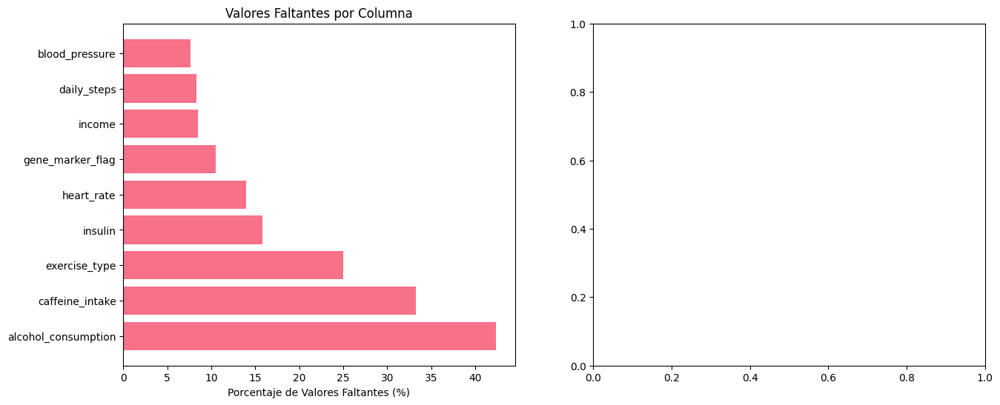

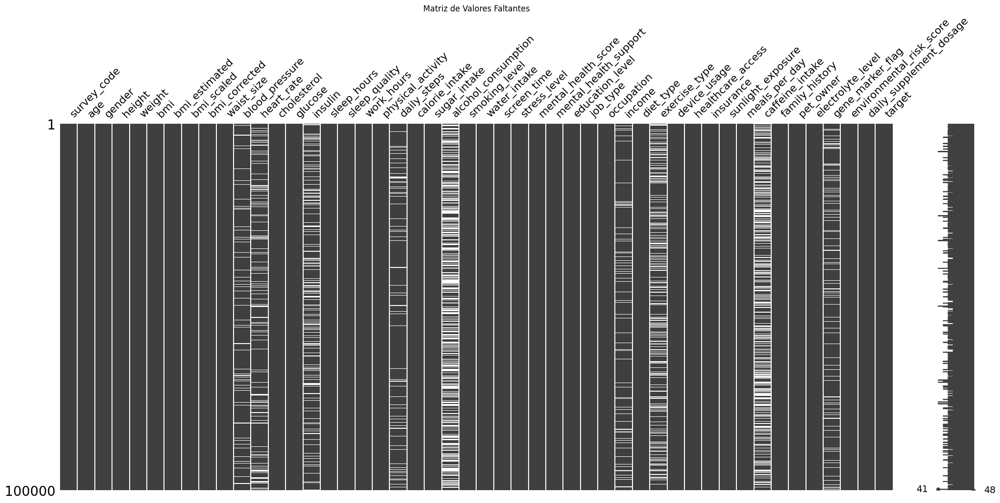


 PATRONES DE VALORES FALTANTES:
   • Filas sin valores faltantes: 14482
   • Filas con al menos 1 valor faltante: 85518
   • Máximo de valores faltantes por fila: 7

 ANÁLISIS DE COLUMNAS NUMÉRICAS
 ESTADÍSTICAS DETALLADAS:


,Columna,Tipo,No_Nulos,Nulos,Media,Mediana,Std,Min,Max,Skewness,CV
0,survey_code,int64,100000,0,50000.500,50000.500,28867.658,1.000,100000.000,0.000,57.735
1,age,int64,100000,0,48.526,48.000,17.887,18.000,79.000,0.001,36.860
2,height,float64,100000,0,170.024,170.017,9.983,140.000,210.000,0.009,5.871
3,weight,float64,100000,0,70.065,69.924,14.694,40.000,139.251,0.129,20.972
4,bmi,float64,100000,0,24.494,24.157,5.951,9.988,59.235,0.421,24.296
5,bmi_estimated,float64,100000,0,24.494,24.157,5.951,9.988,59.235,0.421,24.296
6,bmi_scaled,float64,100000,0,73.482,72.470,17.853,29.965,177.704,0.421,24.296
7,bmi_corrected,float64,100000,0,24.494,24.152,5.954,9.894,59.143,0.420,24.309
8,waist_size,float64,100000,0,84.933,84.957,12.040,34.093,133.154,0.000,14.176
9,blood_pressure,float64,92331,7669,119.980,119.952,15.016,59.128,184.439,0.004,12.515


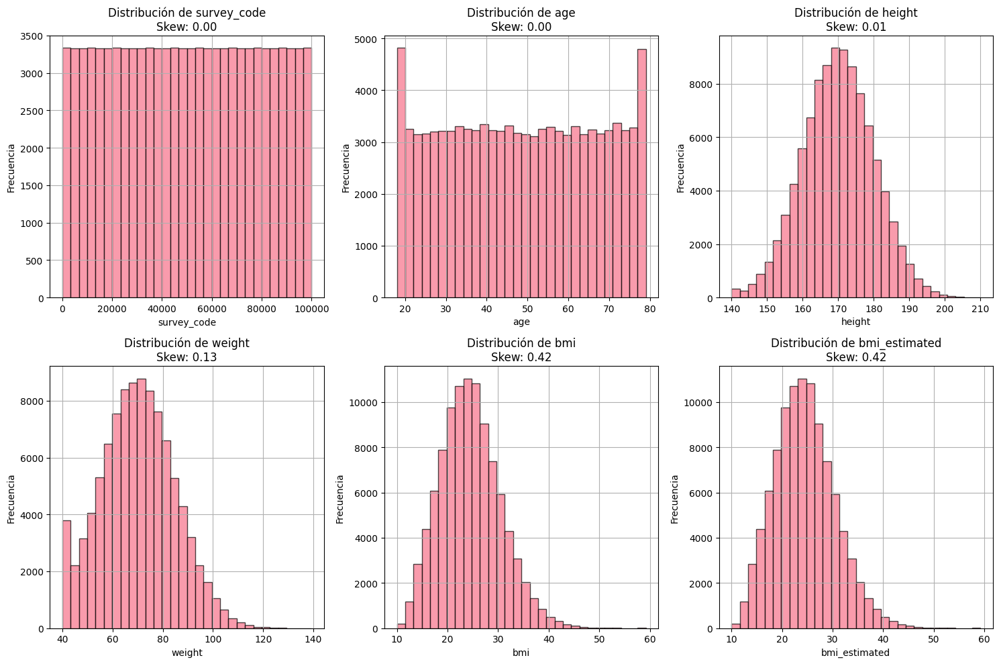

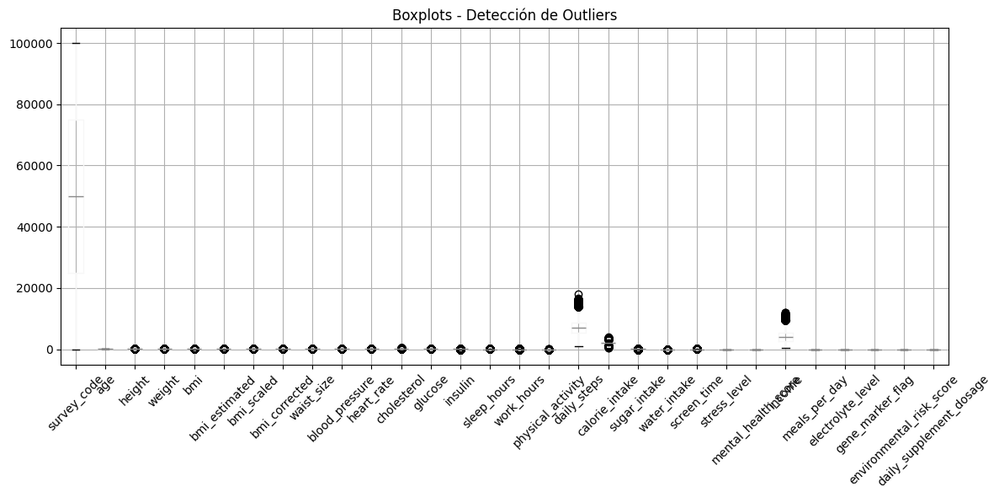


 ANÁLISIS DE COLUMNAS CATEGÓRICAS

 ANÁLISIS DE: gender
   Valores únicos: 2
   Valor más frecuente: Male
   Frecuencia del valor más común: 50132
   Distribución de valores (top 10):
     Male: 50132 (50.1%)
     Female: 49868 (49.9%)


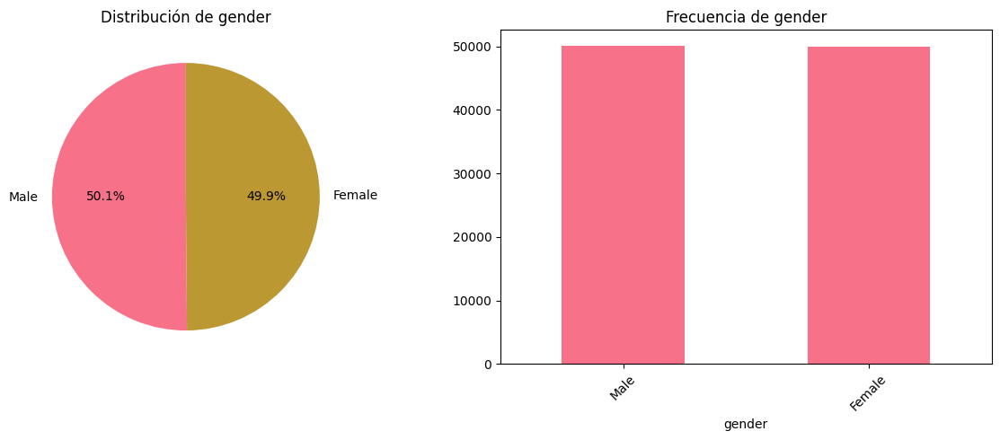


 ANÁLISIS DE: sleep_quality
   Valores únicos: 4
   Valor más frecuente: Good
   Frecuencia del valor más común: 25147
   Distribución de valores (top 10):
     Good: 25147 (25.1%)
     Excellent: 25091 (25.1%)
     Fair: 25008 (25.0%)
     Poor: 24754 (24.8%)


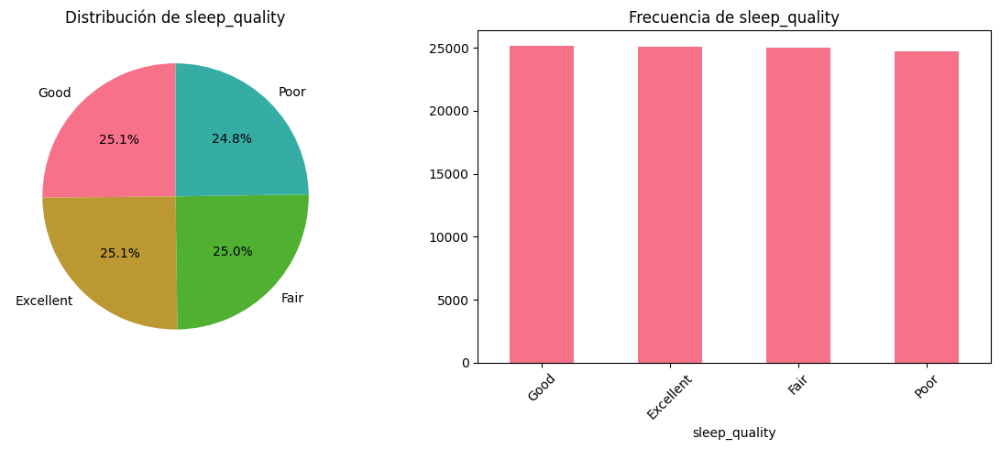


 ANÁLISIS DE: alcohol_consumption
   Valores únicos: 2
   Valor más frecuente: Occasionally
   Frecuencia del valor más común: 28831
   Distribución de valores (top 10):
     Occasionally: 28831 (28.8%)
     Regularly: 28782 (28.8%)


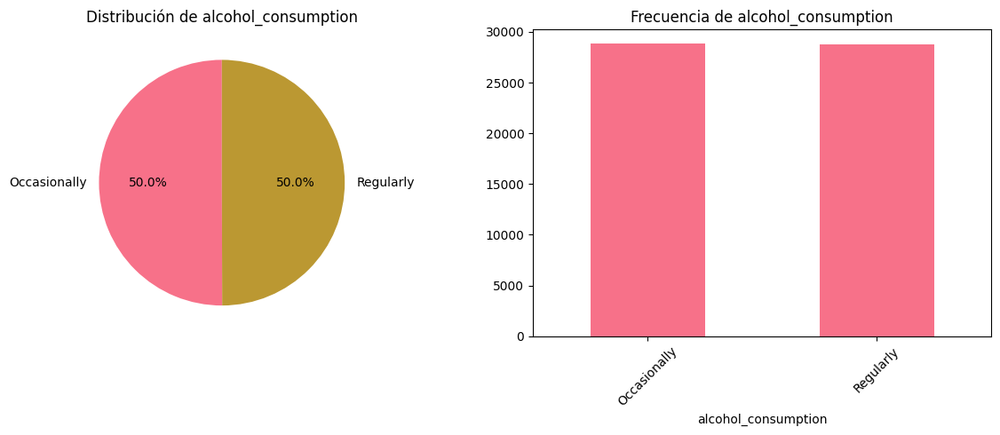


 ANÁLISIS DE: smoking_level
   Valores únicos: 3
   Valor más frecuente: Light
   Frecuencia del valor más común: 33437
   Distribución de valores (top 10):
     Light: 33437 (33.4%)
     Non-smoker: 33355 (33.4%)
     Heavy: 33208 (33.2%)


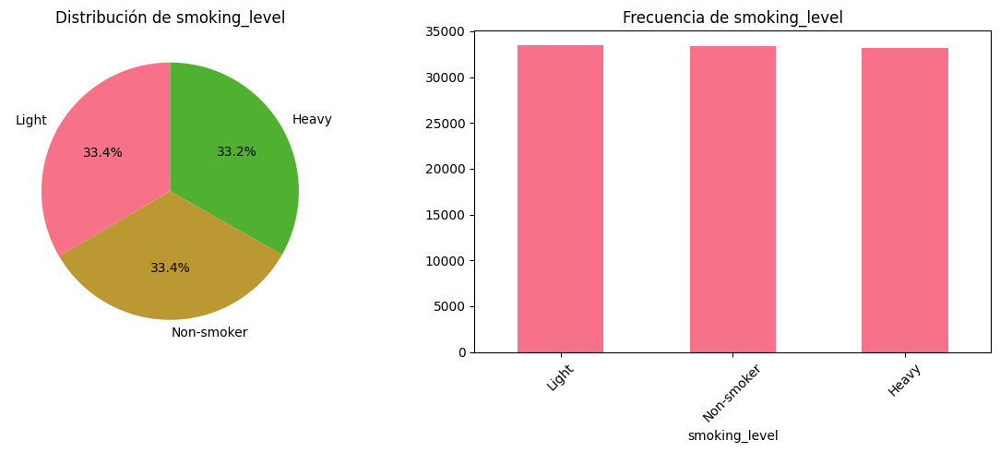


 ANÁLISIS DE: mental_health_support
   Valores únicos: 2
   Valor más frecuente: No
   Frecuencia del valor más común: 50104
   Distribución de valores (top 10):
     No: 50104 (50.1%)
     Yes: 49896 (49.9%)


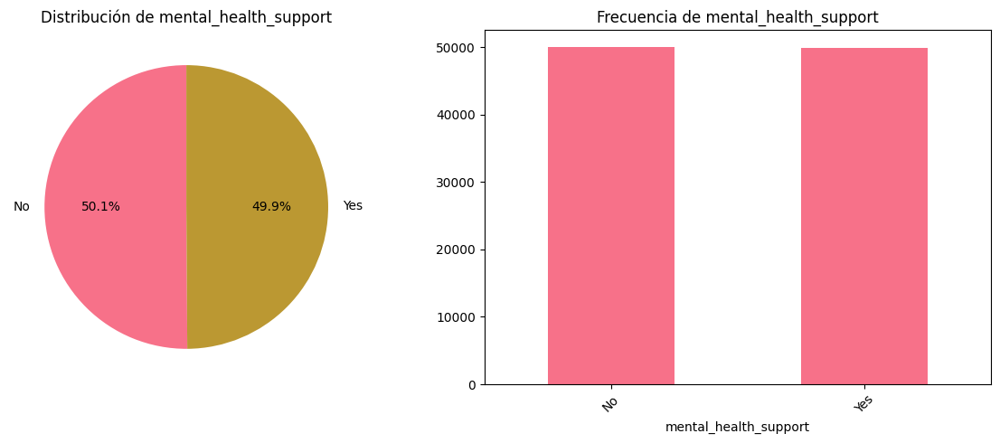


 ANÁLISIS DE: education_level
   Valores únicos: 4
   Valor más frecuente: Bachelor
   Frecuencia del valor más común: 25363
   Distribución de valores (top 10):
     Bachelor: 25363 (25.4%)
     High School: 25028 (25.0%)
     Master: 24992 (25.0%)
     PhD: 24617 (24.6%)


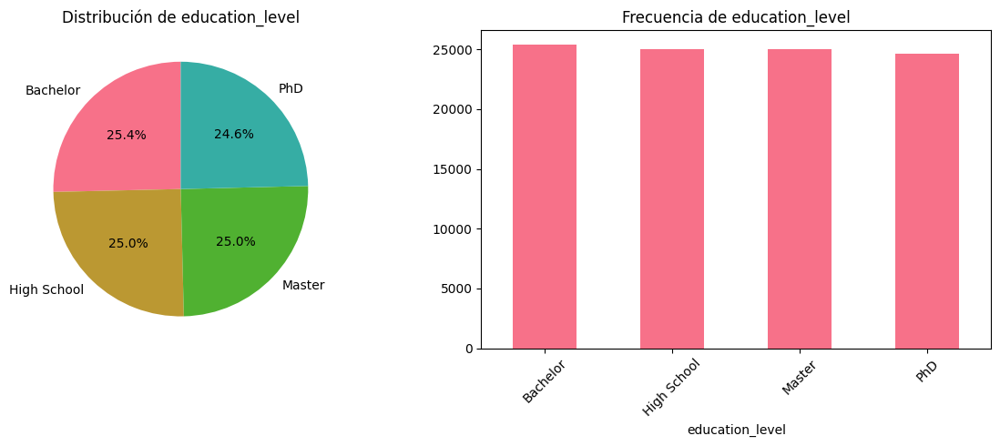


 ANÁLISIS DE: job_type
   Valores únicos: 6
   Valor más frecuente: Labor
   Frecuencia del valor más común: 16777
   Distribución de valores (top 10):
     Labor: 16777 (16.8%)
     Unemployed: 16711 (16.7%)
     Office: 16704 (16.7%)
     Tech: 16691 (16.7%)
     Service: 16571 (16.6%)
     Healthcare: 16546 (16.5%)


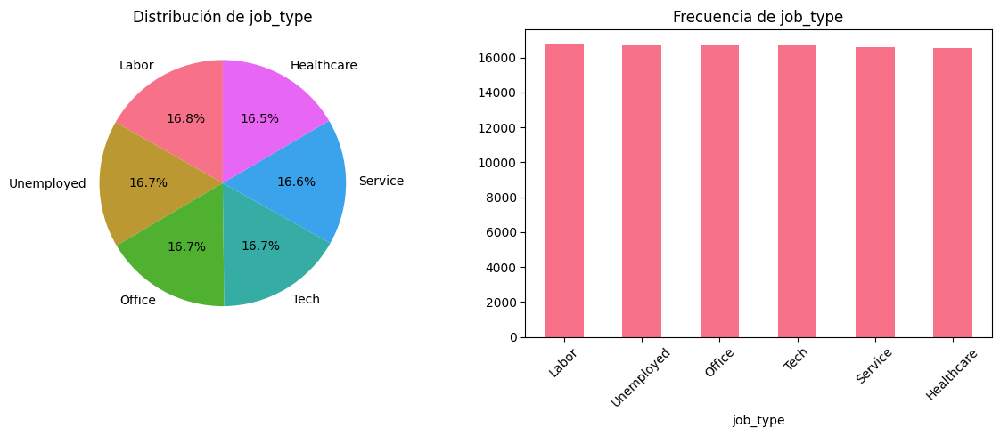


 ANÁLISIS DE: occupation
   Valores únicos: 6
   Valor más frecuente: Doctor
   Frecuencia del valor más común: 16927
   Distribución de valores (top 10):
     Doctor: 16927 (16.9%)
     Farmer: 16719 (16.7%)
     Teacher: 16661 (16.7%)
     Artist: 16657 (16.7%)
     Driver: 16562 (16.6%)
     Engineer: 16474 (16.5%)


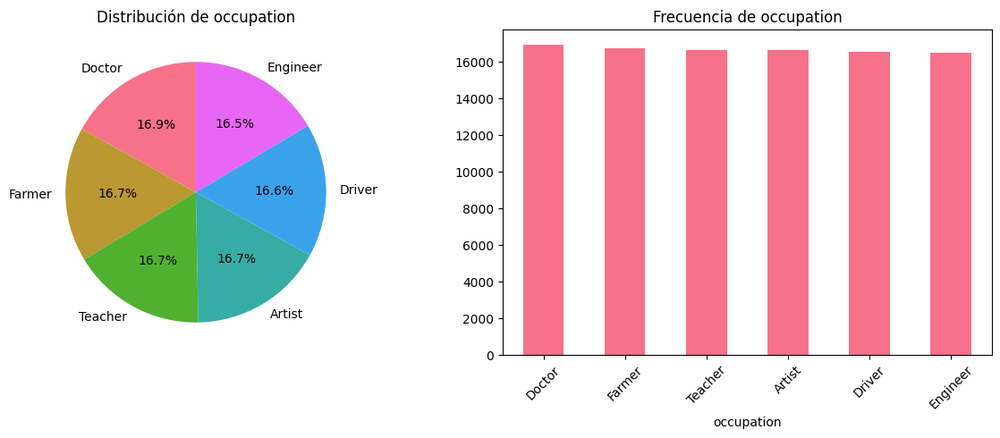


 ANÁLISIS DE: diet_type
   Valores únicos: 4
   Valor más frecuente: Vegan
   Frecuencia del valor más común: 25122
   Distribución de valores (top 10):
     Vegan: 25122 (25.1%)
     Omnivore: 25089 (25.1%)
     Vegetarian: 25025 (25.0%)
     Keto: 24764 (24.8%)


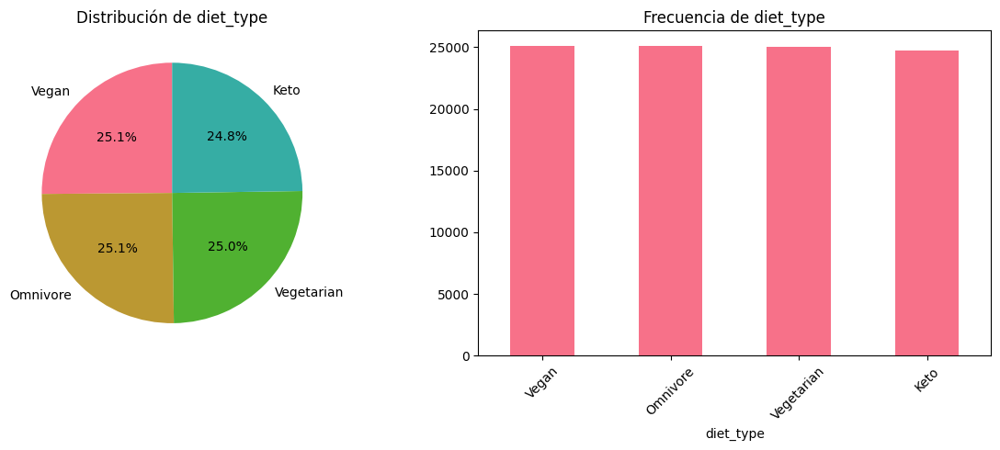


 ANÁLISIS DE: exercise_type
   Valores únicos: 3
   Valor más frecuente: Strength
   Frecuencia del valor más común: 25265
   Distribución de valores (top 10):
     Strength: 25265 (25.3%)
     Cardio: 24988 (25.0%)
     Mixed: 24778 (24.8%)


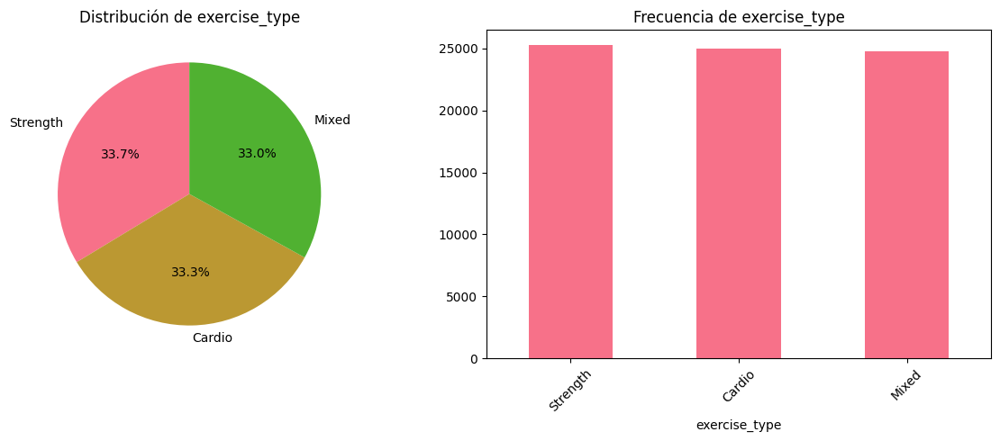


 ANÁLISIS DE: device_usage
   Valores únicos: 3
   Valor más frecuente: High
   Frecuencia del valor más común: 33562
   Distribución de valores (top 10):
     High: 33562 (33.6%)
     Moderate: 33241 (33.2%)
     Low: 33197 (33.2%)


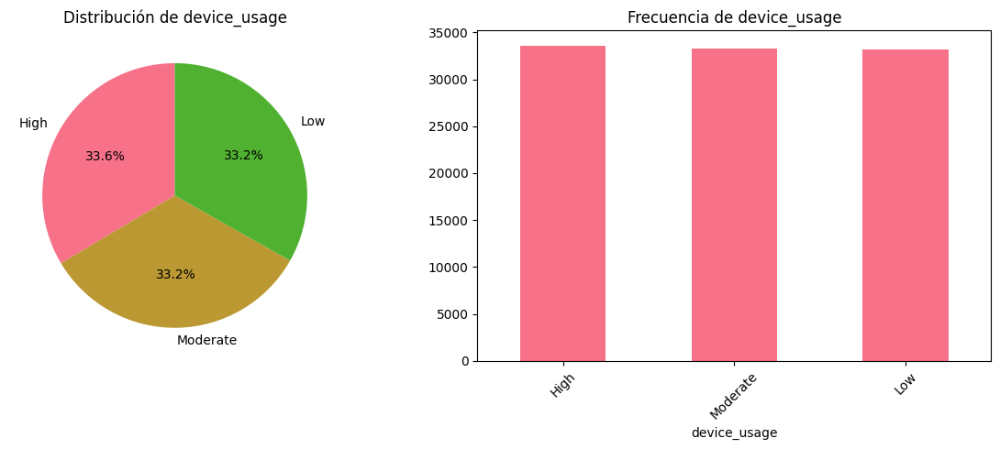


 ANÁLISIS DE: healthcare_access
   Valores únicos: 3
   Valor más frecuente: Good
   Frecuencia del valor más común: 33428
   Distribución de valores (top 10):
     Good: 33428 (33.4%)
     Moderate: 33295 (33.3%)
     Poor: 33277 (33.3%)


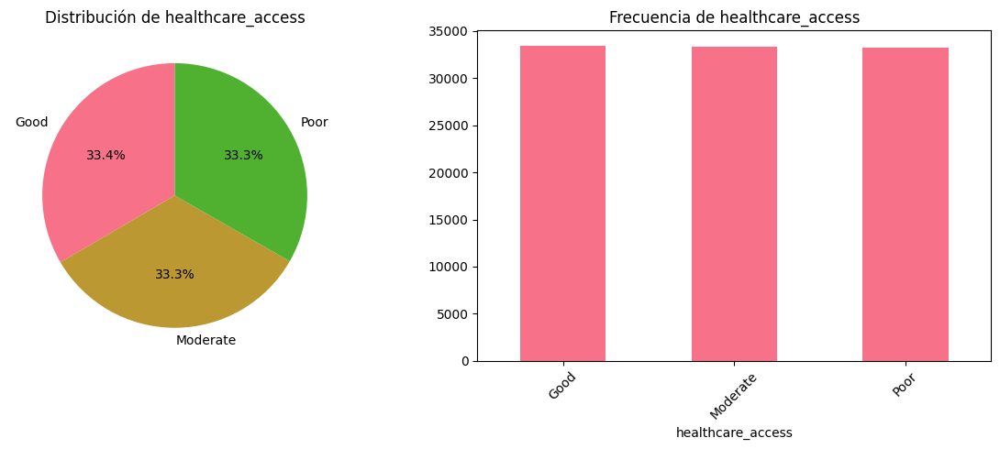


 ANÁLISIS DE: insurance
   Valores únicos: 2
   Valor más frecuente: Yes
   Frecuencia del valor más común: 50121
   Distribución de valores (top 10):
     Yes: 50121 (50.1%)
     No: 49879 (49.9%)


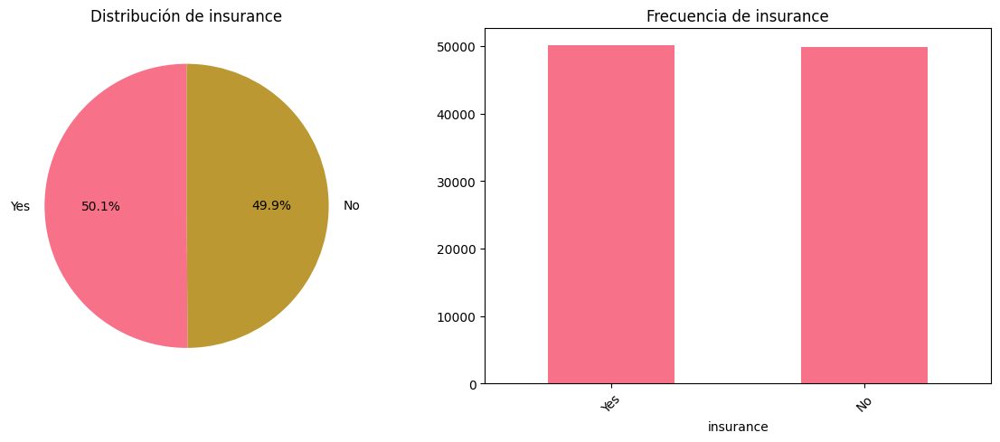


 ANÁLISIS DE: sunlight_exposure
   Valores únicos: 3
   Valor más frecuente: Low
   Frecuencia del valor más común: 33468
   Distribución de valores (top 10):
     Low: 33468 (33.5%)
     Moderate: 33451 (33.5%)
     High: 33081 (33.1%)


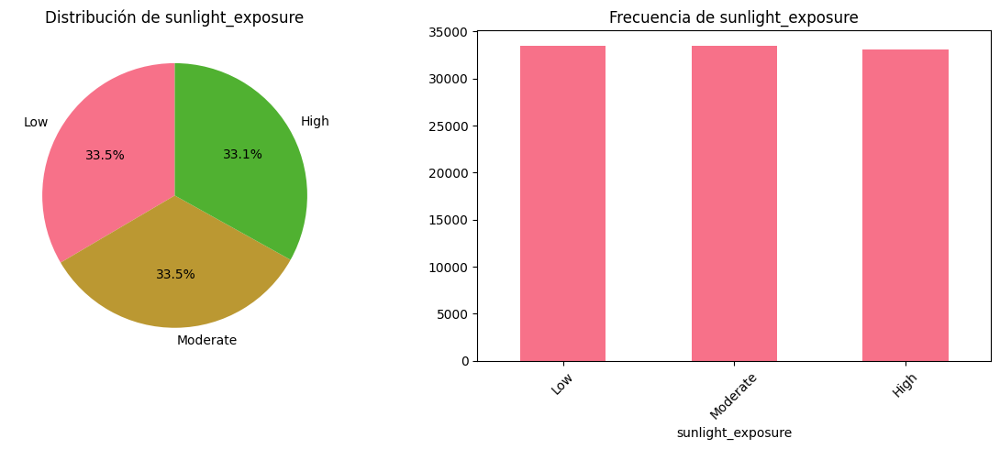


 ANÁLISIS DE: caffeine_intake
   Valores únicos: 2
   Valor más frecuente: Moderate
   Frecuencia del valor más común: 33371
   Distribución de valores (top 10):
     Moderate: 33371 (33.4%)
     High: 33368 (33.4%)


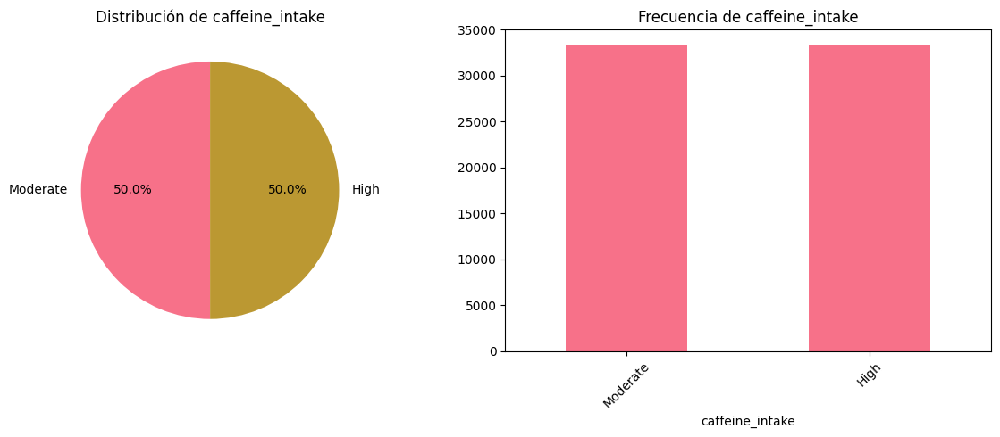


 ANÁLISIS DE: family_history
   Valores únicos: 2
   Valor más frecuente: Yes
   Frecuencia del valor más común: 50055
   Distribución de valores (top 10):
     Yes: 50055 (50.1%)
     No: 49945 (49.9%)


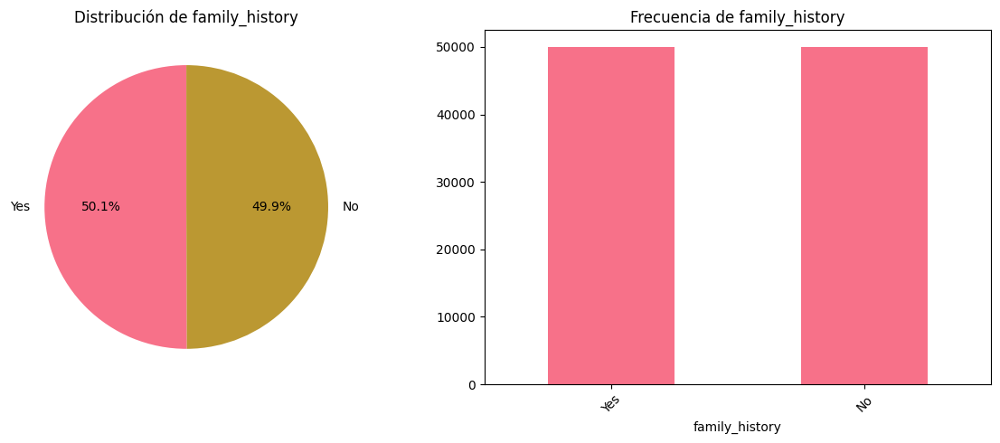


 ANÁLISIS DE: pet_owner
   Valores únicos: 2
   Valor más frecuente: No
   Frecuencia del valor más común: 50153
   Distribución de valores (top 10):
     No: 50153 (50.2%)
     Yes: 49847 (49.8%)


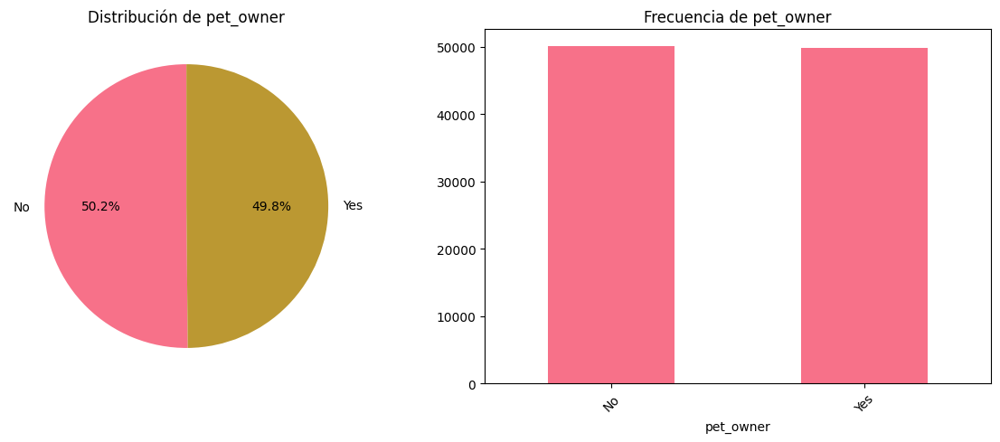


 ANÁLISIS DE: target
   Valores únicos: 2
   Valor más frecuente: healthy
   Frecuencia del valor más común: 70097
   Distribución de valores (top 10):
     healthy: 70097 (70.1%)
     diseased: 29903 (29.9%)


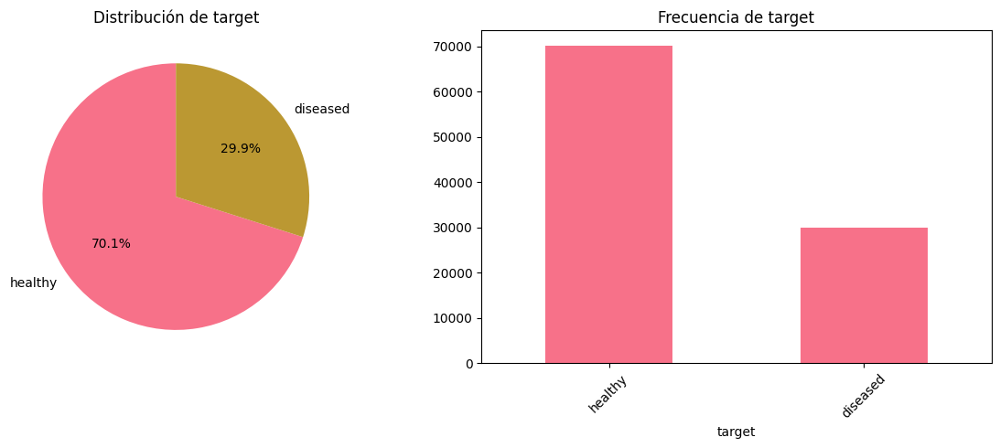


 ANÁLISIS DE CORRELACIONES


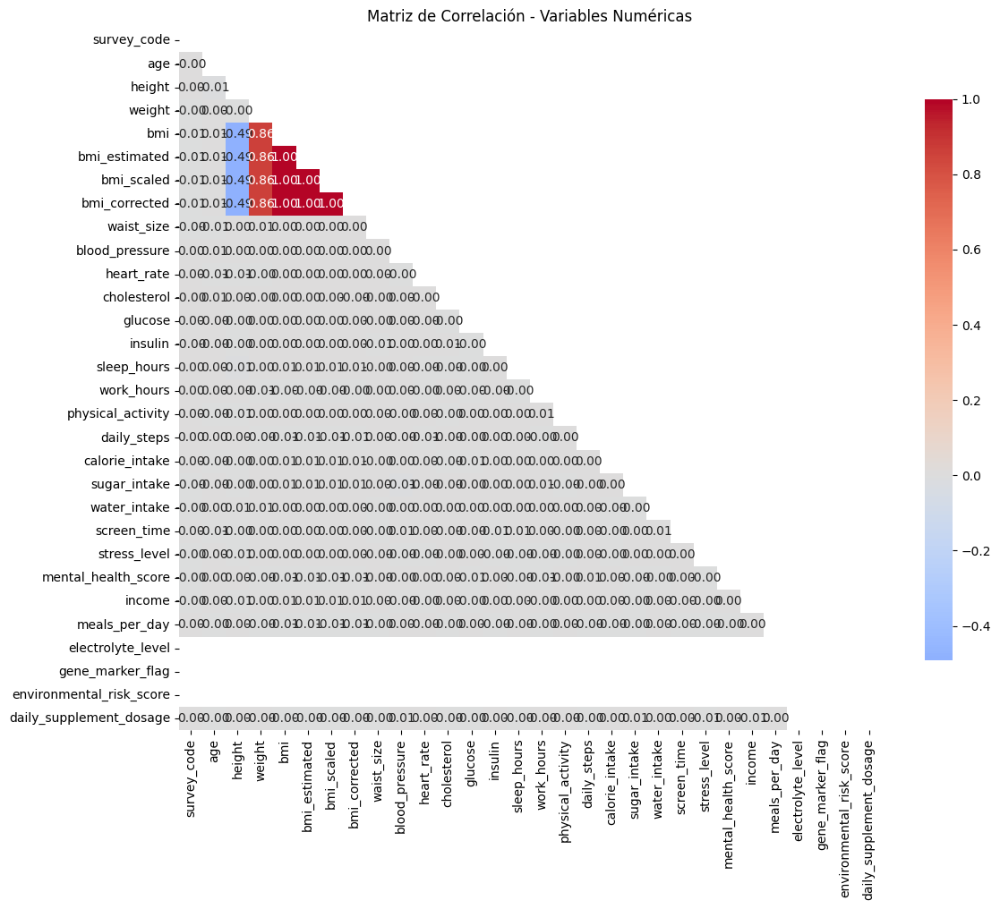


 CORRELACIONES MÁS FUERTES:
   bmi_scaled ↔ bmi: 1.000 (FUERTE)
   bmi_scaled ↔ bmi_estimated: 1.000 (FUERTE)
   bmi_estimated ↔ bmi_scaled: 1.000 (FUERTE)
   bmi ↔ bmi_scaled: 1.000 (FUERTE)
   bmi_scaled ↔ bmi_corrected: 0.999 (FUERTE)
   bmi_corrected ↔ bmi_scaled: 0.999 (FUERTE)
   bmi_corrected ↔ bmi_estimated: 0.999 (FUERTE)
   bmi_corrected ↔ bmi: 0.999 (FUERTE)
   bmi ↔ bmi_corrected: 0.999 (FUERTE)
   bmi_estimated ↔ bmi_corrected: 0.999 (FUERTE)

 REPORTE RESUMEN DEL EDA
 INFORMACIÓN GENERAL:
   • Dimensiones: 100000 filas × 48 columnas
   • Memoria usada: 114.11 MB
   • Columnas numéricas: 30
   • Columnas categóricas: 18
   • Columnas datetime: 0

 CALIDAD DE DATOS:
   • Valores faltantes: 165398 (3.45%)
   • Filas duplicadas: 0 (0.00%)
   • Columnas constantes: 3

 RECOMENDACIONES:
     Hay valores faltantes - considerar imputación
     Columnas constantes: ['electrolyte_level', 'gene_marker_flag', 'environmental_risk_score'] - considerar eliminación

 ANÁLISIS COMPLETADO

In [13]:
# Script EDA para Dataset CSV - Versión Mejorada
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats
from scipy.stats import norm, skew
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.preprocessing import LabelEncoder
import missingno as msno

# Configuración
warnings.filterwarnings('ignore')
plt.style.use('default')
sns.set_palette("husl")
pd.set_option('display.max_columns', None)

class CSVEDA:
    def __init__(self, path):
        self.path = path
        self.df = None
        self.numeric_columns = []
        self.categorical_columns = []
        self.datetime_columns = []
        self.csv_files = []

    def explore_directory(self):
        """Explora el directorio y encuentra archivos CSV"""
        print(" EXPLORANDO DIRECTORIO")
        print("=" * 50)

        if os.path.isfile(self.path):
            # Es un archivo individual
            if self.path.lower().endswith('.csv'):
                self.csv_files = [self.path]
                print(f" Archivo CSV encontrado: {os.path.basename(self.path)}")
            else:
                print(" El archivo no es un CSV")
                return False

        elif os.path.isdir(self.path):
            # Es un directorio - buscar todos los CSVs
            print(f" Directorio encontrado: {self.path}")
            for file in os.listdir(self.path):
                if file.lower().endswith('.csv'):
                    full_path = os.path.join(self.path, file)
                    self.csv_files.append(full_path)
                    print(f"    {file}")

            if not self.csv_files:
                print(" No se encontraron archivos CSV en el directorio")
                return False
            else:
                print(f" Se encontraron {len(self.csv_files)} archivos CSV")
        else:
            print(" La ruta no existe")
            return False

        return True

    def select_csv_file(self):
        """Permite seleccionar un archivo CSV si hay múltiples"""
        if len(self.csv_files) == 1:
            return self.csv_files[0]
        else:
            print("\n ARCHIVOS CSV DISPONIBLES:")
            for i, file_path in enumerate(self.csv_files):
                file_name = os.path.basename(file_path)
                file_size = os.path.getsize(file_path) / 1024  # KB
                print(f"   {i+1}. {file_name} ({file_size:.1f} KB)")

            try:
                choice = int(input("\n Selecciona el número del archivo a analizar: ")) - 1
                if 0 <= choice < len(self.csv_files):
                    return self.csv_files[choice]
                else:
                    print(" Selección inválida")
                    return None
            except:
                print(" Entrada inválida")
                return None

    def load_data(self, file_path):
        """Carga el dataset CSV específico"""
        print(f"\n CARGANDO DATASET: {os.path.basename(file_path)}")
        print("=" * 50)

        try:
            # Detectar encoding automáticamente
            encodings = ['utf-8', 'latin-1', 'iso-8859-1', 'cp1252', 'windows-1252']
            for encoding in encodings:
                try:
                    self.df = pd.read_csv(file_path, encoding=encoding)
                    print(f" Dataset cargado con encoding: {encoding}")
                    break
                except UnicodeDecodeError:
                    continue

            if self.df is None:
                # Si fallan todos los encodings, usar pandas con error handling
                self.df = pd.read_csv(file_path, encoding='utf-8', errors='ignore')
                print("  Dataset cargado con manejo de errores de encoding")

            print(f" Dimensiones del dataset: {self.df.shape[0]} filas × {self.df.shape[1]} columnas")

            # Mostrar información básica del archivo
            file_size = os.path.getsize(file_path) / 1024  # KB
            print(f" Tamaño del archivo: {file_size:.1f} KB")

            # Clasificar columnas
            self._classify_columns()

        except Exception as e:
            print(f" Error cargando el archivo: {e}")
            return False

        return True

    def _classify_columns(self):
        """Clasifica las columnas por tipo"""
        for col in self.df.columns:
            # Verificar si es datetime
            if self.df[col].dtype == 'object':
                try:
                    # Probar si puede ser convertido a datetime
                    sample_data = self.df[col].dropna().head(100)
                    pd.to_datetime(sample_data)
                    self.df[col] = pd.to_datetime(self.df[col], errors='coerce')
                    self.datetime_columns.append(col)
                    continue
                except:
                    pass

            # Clasificar como numérica o categórica
            if pd.api.types.is_numeric_dtype(self.df[col]):
                self.numeric_columns.append(col)
            else:
                self.categorical_columns.append(col)

        print(f" Columnas numéricas: {len(self.numeric_columns)}")
        print(f" Columnas categóricas: {len(self.categorical_columns)}")
        print(f" Columnas datetime: {len(self.datetime_columns)}")

    def basic_info(self):
        """Muestra información básica del dataset"""
        print("\n INFORMACIÓN BÁSICA DEL DATASET")
        print("=" * 50)

        print(" PRIMERAS 5 FILAS:")
        display(self.df.head())

        print("\n ÚLTIMAS 5 FILAS:")
        display(self.df.tail())

        print("\n INFORMACIÓN DE COLUMNAS:")
        print(self.df.info())

        print("\n ESTADÍSTICAS DESCRIPTIVAS:")
        display(self.df.describe(include='all'))

        print("\n TIPOS DE DATOS:")
        dtype_counts = self.df.dtypes.value_counts()
        for dtype, count in dtype_counts.items():
            print(f"   {dtype}: {count} columnas")

    def analyze_missing_values(self):
        """Analiza valores faltantes"""
        print("\n ANÁLISIS DE VALORES FALTANTES")
        print("=" * 50)

        # Estadísticas de missing values
        missing_total = self.df.isnull().sum()
        missing_percent = (self.df.isnull().sum() / len(self.df)) * 100

        missing_df = pd.DataFrame({
            'Columna': self.df.columns,
            'Valores_Faltantes': missing_total,
            'Porcentaje': missing_percent
        }).sort_values('Porcentaje', ascending=False)

        print(" RESUMEN DE VALORES FALTANTES:")
        display(missing_df[missing_df['Valores_Faltantes'] > 0])

        if missing_df['Valores_Faltantes'].sum() == 0:
            print(" No hay valores faltantes en el dataset")
            return

        # Visualización de missing values
        plt.figure(figsize=(15, 6))

        plt.subplot(1, 2, 1)
        missing_plot = missing_df[missing_df['Porcentaje'] > 0]
        if not missing_plot.empty:
            plt.barh(missing_plot['Columna'], missing_plot['Porcentaje'])
            plt.xlabel('Porcentaje de Valores Faltantes (%)')
            plt.title('Valores Faltantes por Columna')
        else:
            plt.text(0.5, 0.5, 'No hay valores faltantes',
                    ha='center', va='center', transform=plt.gca().transAxes)

        plt.subplot(1, 2, 2)
        msno.matrix(self.df)
        plt.title('Matriz de Valores Faltantes')

        plt.tight_layout()
        plt.show()

        # Análisis de patrones de missing values
        print("\n PATRONES DE VALORES FALTANTES:")
        missing_pattern = self.df.isnull().sum(axis=1)
        print(f"   • Filas sin valores faltantes: {len(missing_pattern[missing_pattern == 0])}")
        print(f"   • Filas con al menos 1 valor faltante: {len(missing_pattern[missing_pattern > 0])}")
        print(f"   • Máximo de valores faltantes por fila: {missing_pattern.max()}")

    def analyze_numeric_columns(self):
        """Análisis detallado de columnas numéricas"""
        if not self.numeric_columns:
            print(" No hay columnas numéricas para analizar")
            return

        print("\n ANÁLISIS DE COLUMNAS NUMÉRICAS")
        print("=" * 50)

        # Estadísticas por columna numérica
        numeric_stats = []
        for col in self.numeric_columns:
            stats_dict = {
                'Columna': col,
                'Tipo': self.df[col].dtype,
                'No_Nulos': self.df[col].count(),
                'Nulos': self.df[col].isnull().sum(),
                'Media': self.df[col].mean(),
                'Mediana': self.df[col].median(),
                'Std': self.df[col].std(),
                'Min': self.df[col].min(),
                'Max': self.df[col].max(),
                'Skewness': self.df[col].skew(),
                'CV': (self.df[col].std() / self.df[col].mean()) * 100 if self.df[col].mean() != 0 else np.inf
            }
            numeric_stats.append(stats_dict)

        stats_df = pd.DataFrame(numeric_stats)
        print(" ESTADÍSTICAS DETALLADAS:")
        display(stats_df.round(3))

        # Visualizaciones
        n_numeric = len(self.numeric_columns)
        if n_numeric > 0:
            # Distribuciones - máximo 6 columnas por gráfico
            cols_to_plot = self.numeric_columns[:6]
            n_cols = len(cols_to_plot)

            if n_cols > 0:
                fig, axes = plt.subplots(2, 3, figsize=(15, 10))
                axes = axes.ravel()

                for i, col in enumerate(cols_to_plot):
                    if i < len(axes):
                        self.df[col].hist(bins=30, ax=axes[i], alpha=0.7, edgecolor='black')
                        axes[i].set_title(f'Distribución de {col}\nSkew: {self.df[col].skew():.2f}')
                        axes[i].set_xlabel(col)
                        axes[i].set_ylabel('Frecuencia')

                # Ocultar ejes sobrantes
                for i in range(n_cols, len(axes)):
                    axes[i].set_visible(False)

                plt.tight_layout()
                plt.show()

            # Boxplots para detectar outliers
            if n_numeric > 0:
                plt.figure(figsize=(12, 6))
                self.df[self.numeric_columns].boxplot()
                plt.title('Boxplots - Detección de Outliers')
                plt.xticks(rotation=45)
                plt.tight_layout()
                plt.show()

    def analyze_categorical_columns(self):
        """Análisis detallado de columnas categóricas"""
        if not self.categorical_columns:
            print(" No hay columnas categóricas para analizar")
            return

        print("\n ANÁLISIS DE COLUMNAS CATEGÓRICAS")
        print("=" * 50)

        for col in self.categorical_columns:
            print(f"\n ANÁLISIS DE: {col}")
            unique_count = self.df[col].nunique()
            print(f"   Valores únicos: {unique_count}")

            if unique_count > 0:
                print(f"   Valor más frecuente: {self.df[col].mode().iloc[0]}")
                print(f"   Frecuencia del valor más común: {self.df[col].value_counts().iloc[0]}")

                if unique_count <= 20:  # Mostrar detalles si no hay demasiadas categorías
                    value_counts = self.df[col].value_counts()
                    print("   Distribución de valores (top 10):")
                    for value, count in value_counts.head(10).items():
                        percentage = (count/len(self.df))*100
                        print(f"     {value}: {count} ({percentage:.1f}%)")

            # Visualización para columnas con pocas categorías
            if unique_count <= 15 and unique_count > 0:
                plt.figure(figsize=(12, 5))

                value_counts = self.df[col].value_counts()

                plt.subplot(1, 2, 1)
                plt.pie(value_counts.values, labels=value_counts.index, autopct='%1.1f%%', startangle=90)
                plt.title(f'Distribución de {col}')

                plt.subplot(1, 2, 2)
                value_counts.plot(kind='bar')
                plt.title(f'Frecuencia de {col}')
                plt.xticks(rotation=45)

                plt.tight_layout()
                plt.show()

    def analyze_correlations(self):
        """Analiza correlaciones entre variables numéricas"""
        if len(self.numeric_columns) < 2:
            print(" No hay suficientes columnas numéricas para análisis de correlación")
            return

        print("\n ANÁLISIS DE CORRELACIONES")
        print("=" * 50)

        # Matriz de correlación
        corr_matrix = self.df[self.numeric_columns].corr()

        plt.figure(figsize=(12, 10))
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
        sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0,
                   square=True, fmt='.2f', cbar_kws={'shrink': .8})
        plt.title('Matriz de Correlación - Variables Numéricas')
        plt.tight_layout()
        plt.show()

        # Identificar correlaciones fuertes
        print("\n CORRELACIONES MÁS FUERTES:")
        corr_pairs = corr_matrix.unstack().sort_values(key=abs, ascending=False)
        strong_corrs = corr_pairs[~corr_pairs.index.duplicated(keep='first')]
        strong_corrs = strong_corrs[strong_corrs != 1.0]

        for idx, ((col1, col2), corr) in enumerate(strong_corrs.head(10).items()):
            strength = "FUERTE" if abs(corr) > 0.7 else "MODERADA" if abs(corr) > 0.3 else "DÉBIL"
            print(f"   {col1} ↔ {col2}: {corr:.3f} ({strength})")

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA")
        print("=" * 50)

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Dimensiones: {self.df.shape[0]} filas × {self.df.shape[1]} columnas")
        print(f"   • Memoria usada: {self.df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
        print(f"   • Columnas numéricas: {len(self.numeric_columns)}")
        print(f"   • Columnas categóricas: {len(self.categorical_columns)}")
        print(f"   • Columnas datetime: {len(self.datetime_columns)}")

        print("\n CALIDAD DE DATOS:")
        missing_total = self.df.isnull().sum().sum()
        missing_percent = (missing_total / (self.df.shape[0] * self.df.shape[1])) * 100
        print(f"   • Valores faltantes: {missing_total} ({missing_percent:.2f}%)")

        duplicate_rows = self.df.duplicated().sum()
        duplicate_percent = (duplicate_rows / self.df.shape[0]) * 100
        print(f"   • Filas duplicadas: {duplicate_rows} ({duplicate_percent:.2f}%)")

        # Columnas con un solo valor
        constant_columns = [col for col in self.df.columns if self.df[col].nunique() <= 1]
        print(f"   • Columnas constantes: {len(constant_columns)}")

        print("\n RECOMENDACIONES:")

        if missing_total > 0:
            print("     Hay valores faltantes - considerar imputación")

        if duplicate_rows > 0:
            print("     Hay filas duplicadas - considerar eliminación")

        if constant_columns:
            print(f"     Columnas constantes: {constant_columns} - considerar eliminación")

        # Verificar columnas con alta cardinalidad
        high_cardinality = [col for col in self.categorical_columns if self.df[col].nunique() > 50]
        if high_cardinality:
            print(f"     Columnas con alta cardinalidad: {high_cardinality}")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET CSV")
        print("=" * 60)

        # Primero explorar el directorio/archivo
        if not self.explore_directory():
            return None

        # Seleccionar archivo si hay múltiples
        selected_file = self.select_csv_file()
        if not selected_file:
            return None

        # Cargar y analizar el dataset
        if not self.load_data(selected_file):
            return None

        self.basic_info()
        self.analyze_missing_values()
        self.analyze_numeric_columns()
        self.analyze_categorical_columns()
        self.analyze_correlations()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.df

# USO DEL SCRIPT MEJORADO
if __name__ == "__main__":
    # Ahora puedes pasar tanto archivos como directorios
    path = "/content/Machine_learning_I/Dataset/csv_health_lifestyle_classification/health_lifestyle_classification.csv"  # Tu directorio

    # Crear instancia y ejecutar análisis
    csv_eda = CSVEDA(path)
    analyzed_df = csv_eda.run_complete_analysis()

    # El DataFrame analizado queda disponible para uso posterior
    if analyzed_df is not None:
        print(f"\n DataFrame disponible como 'analyzed_df' con {analyzed_df.shape} dimensiones")
        print(f" Columnas disponibles: {list(analyzed_df.columns)}")

        # Guardar el análisis en un archivo
        try:
            analyzed_df.to_csv('/content/Machine_learning_I/Dataset/csv_health_lifestyle_classification/health_lifestyle_classification.csv', index=False)
            print(" Dataset analizado guardado como '/content/Machine_learning_I/Dataset/csv_health_lifestyle_classification/health_lifestyle_classification.csv'")
        except:
            print("  No se pudo guardar el dataset analizado")

#**Texto**

In [14]:
!pip install wordcloud textblob nltk matplotlib seaborn plotly

Bible

 DESCARGANDO RECURSOS NLTK...
 punkt descargado
 stopwords descargado
 vader_lexicon descargado
 punkt_tab descargado
 INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE TEXTO

 COLECTANDO ESTADÍSTICAS DE TEXTOS
 EXPLORANDO ESTRUCTURA DEL DIRECTORIO
 Directorio encontrado: /content/Machine_learning_I/Dataset/txt_Bible
    pg17.txt
    pg10.txt
    pg2800.txt
    35895-0.txt
    pg2680.txt
 Se encontraron 5 archivos TXT
 Total de archivos de texto procesados: 5
 Estadísticas totales: 1725806 palabras, 7912993 caracteres

 ESTADÍSTICAS BÁSICAS DEL DATASET
Total de archivos de texto: 5
Encodings utilizados: Counter({'utf-8': 5})

 Estadísticas de longitud:
Palabras - Min: 87679, Max: 950413, Mean: 345161.2
Caracteres - Min: 416493, Max: 4324657, Mean: 1582598.6
Oraciones - Min: 3438, Max: 29930, Mean: 11967.4

 Estadísticas de vocabulario:
Palabras únicas - Min: 6723, Max: 17512, Mean: 10800.4
Riqueza vocabular - Min: 0.018, Max: 0.078, Mean: 0.050

 CREANDO VISUALIZACIONES


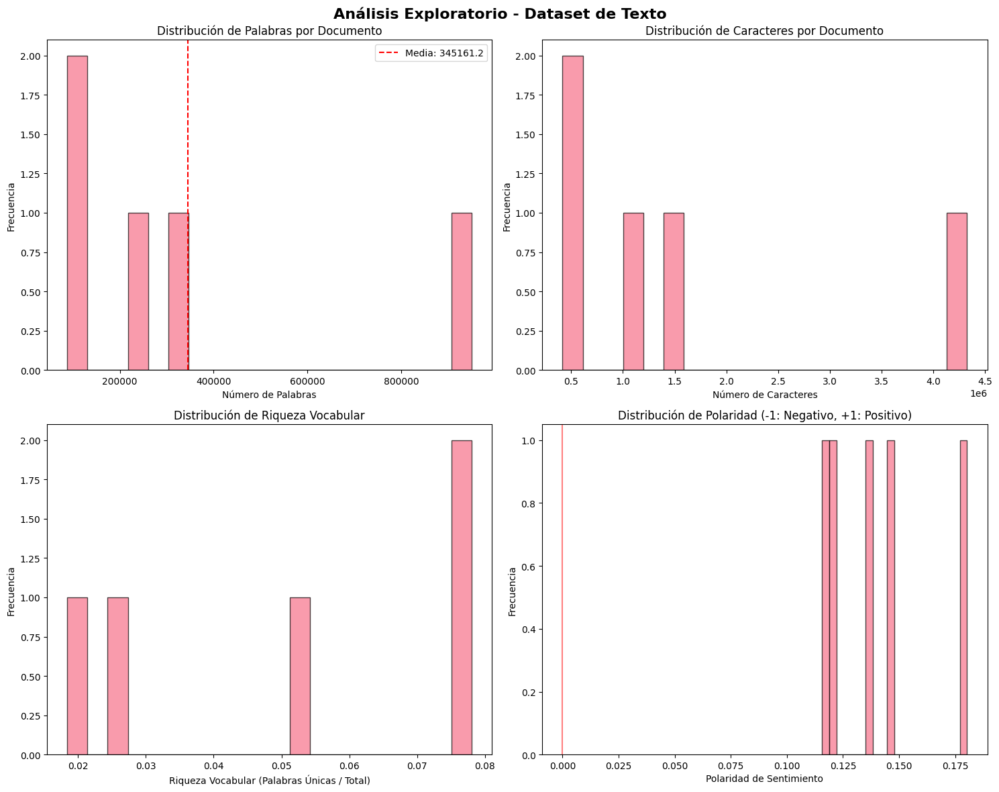


  GENERANDO NUBE DE PALABRAS


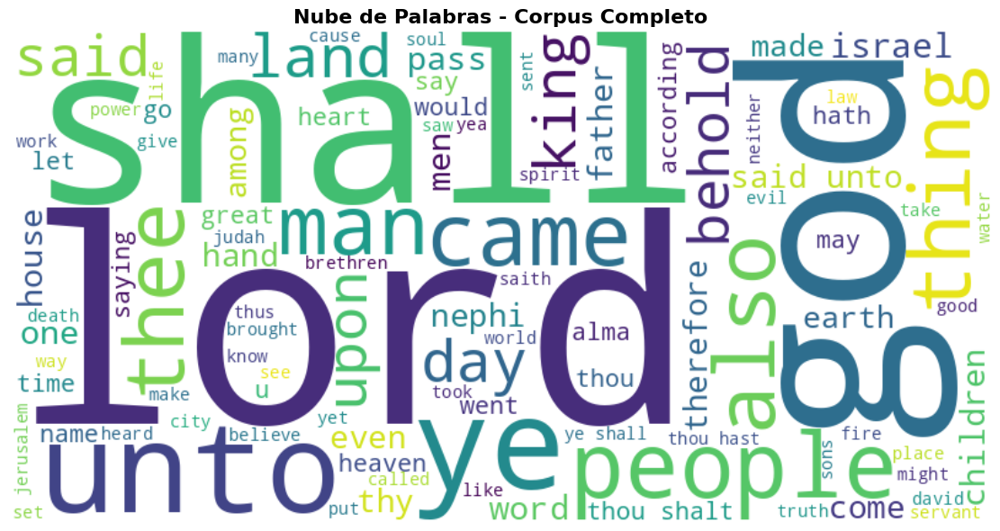


 ANÁLISIS DE 20 PALABRAS MÁS FRECUENTES
 PALABRAS MÁS FRECUENTES:
    1. shall           : 14928 ocurrencias
    2. unto            : 13345 ocurrencias
    3. lord            : 10649 ocurrencias
    4. god             : 9531 ocurrencias
    5. thou            : 8035 ocurrencias
    6. ye              : 7867 ocurrencias
    7. thy             : 6090 ocurrencias
    8. said            : 5963 ocurrencias
    9. thee            : 5189 ocurrencias
   10. people          : 4428 ocurrencias
   11. upon            : 4423 ocurrencias
   12. one             : 4121 ocurrencias
   13. man             : 4063 ocurrencias
   14. came            : 3949 ocurrencias
   15. hath            : 3869 ocurrencias
   16. come            : 3301 ocurrencias
   17. king            : 3262 ocurrencias
   18. also            : 3212 ocurrencias
   19. land            : 3082 ocurrencias
   20. behold          : 3026 ocurrencias


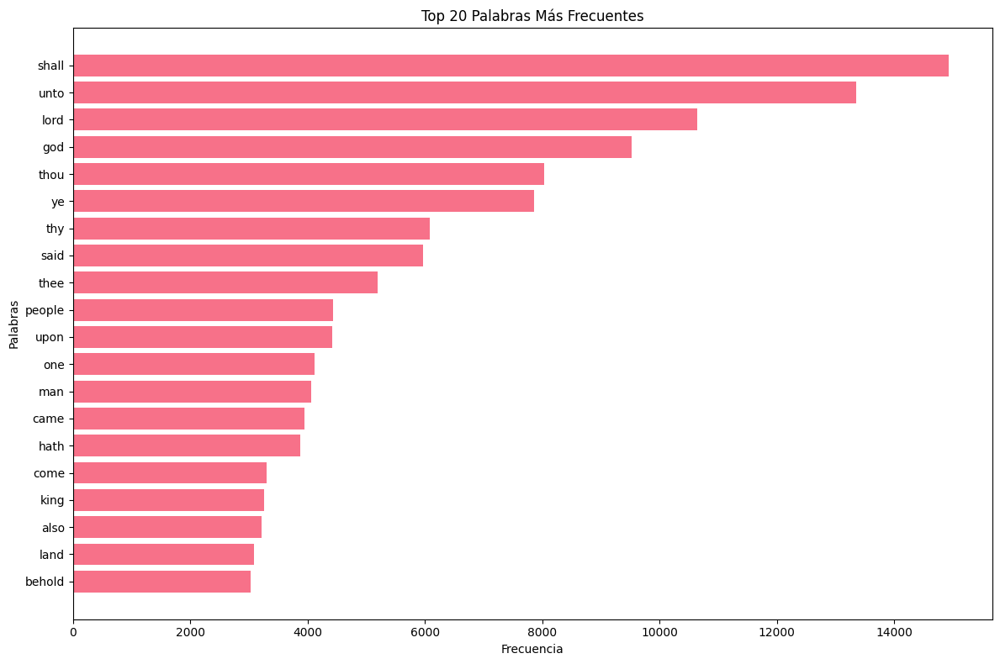


 MUESTRA DE 3 TEXTOS

 MUESTRA 1: 35895-0.txt
 Estadísticas: 109653 palabras, 514152 caracteres
 Sentimiento: Polaridad=0.145, Subjetividad=0.537
--------------------------------------------------
﻿The Project Gutenberg EBook of The Gospel of Buddha, by Paul Carus

This eBook is for the use of anyone anywhere at no cost and with
almost no restrictions whatsoever.  You may copy it, give it away or
re-use it under the terms of the Project Gutenberg License included
with this eBook or online at www.gutenberg.net


Title: The Gospel of Buddha
       Compiled from Ancient Records by Paul Carus

Author: Paul Carus

Illustrator: Olga Kopetzky

Release Date: April 17, 2011 [EBook #35895]
Last Upd...
--------------------------------------------------

 MUESTRA 2: pg2800.txt
 Estadísticas: 247932 palabras, 1116375 caracteres
 Sentimiento: Polaridad=0.119, Subjetividad=0.517
--------------------------------------------------
﻿The Project Gutenberg Etext of The Koran as translated by Rodwell
The 

In [ ]:
# Script EDA para Dataset de Texto (.txt) - CORREGIDO
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from collections import Counter, defaultdict
import re
from wordcloud import WordCloud
from textblob import TextBlob
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.probability import FreqDist
import plotly.express as px
import plotly.graph_objects as go

# Configuración
warnings.filterwarnings('ignore')
plt.style.use('default')
sns.set_palette("husl")

# Descargar recursos de NLTK (versión corregida)
def download_nltk_resources():
    """Descarga todos los recursos necesarios de NLTK"""
    print(" DESCARGANDO RECURSOS NLTK...")
    resources = [
        'punkt',
        'stopwords',
        'vader_lexicon',
        'punkt_tab'  # Nuevo recurso necesario
    ]

    for resource in resources:
        try:
            nltk.download(resource, quiet=True)
            print(f" {resource} descargado")
        except Exception as e:
            print(f"  Error descargando {resource}: {e}")

# Ejecutar descarga de recursos
download_nltk_resources()

class TextEDA:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.text_data = []
        self.stats_df = None
        self.corpus = ""
        self.stop_words = set(stopwords.words('english'))
        # Agregar stopwords en español si es necesario
        try:
            spanish_stopwords = set(stopwords.words('spanish'))
            self.stop_words.update(spanish_stopwords)
        except:
            pass

    def explore_directory_structure(self):
        """Explora la estructura del directorio"""
        print(" EXPLORANDO ESTRUCTURA DEL DIRECTORIO")
        print("=" * 50)

        if os.path.isfile(self.dataset_path):
            # Es un archivo individual
            if self.dataset_path.lower().endswith('.txt'):
                print(f" Archivo TXT encontrado: {os.path.basename(self.dataset_path)}")
                return [self.dataset_path]
            else:
                print(" El archivo no es un TXT")
                return []

        elif os.path.isdir(self.dataset_path):
            # Es un directorio - buscar todos los TXT
            print(f" Directorio encontrado: {self.dataset_path}")
            txt_files = []
            for file in os.listdir(self.dataset_path):
                if file.lower().endswith('.txt'):
                    full_path = os.path.join(self.dataset_path, file)
                    txt_files.append(full_path)
                    print(f"    {file}")

            if not txt_files:
                print(" No se encontraron archivos TXT en el directorio")
                return []
            else:
                print(f" Se encontraron {len(txt_files)} archivos TXT")
                return txt_files
        else:
            print(" La ruta no existe")
            return []

    def read_text_file(self, file_path):
        """Lee un archivo de texto con diferentes encodings"""
        encodings = ['utf-8', 'latin-1', 'iso-8859-1', 'cp1252', 'windows-1252']

        for encoding in encodings:
            try:
                with open(file_path, 'r', encoding=encoding) as file:
                    content = file.read()
                return content, encoding
            except UnicodeDecodeError:
                continue
            except Exception as e:
                continue

        # Si todos los encodings fallan, intentar con error handling
        try:
            with open(file_path, 'r', encoding='utf-8', errors='ignore') as file:
                content = file.read()
            return content, 'utf-8 (con errores)'
        except Exception as e:
            print(f" Error leyendo {file_path}: {e}")
            return None, None

    def simple_tokenize(self, text):
        """Tokenización simple como fallback si NLTK falla"""
        # Tokenización básica por espacios y puntuación
        words = re.findall(r'\b\w+\b', text.lower())
        sentences = re.split(r'[.!?]+', text)
        sentences = [s.strip() for s in sentences if s.strip()]
        return words, sentences

    def extract_text_features(self, text, file_path):
        """Extrae características del texto"""
        if not text or len(text.strip()) == 0:
            return None

        try:
            # Limpiar texto
            clean_text = re.sub(r'\s+', ' ', text.strip())

            # Tokenización con fallback
            try:
                words = word_tokenize(clean_text.lower())
                sentences = sent_tokenize(clean_text)
            except:
                print(f"  Usando tokenización simple para {file_path}")
                words, sentences = self.simple_tokenize(clean_text)

            # Filtrar palabras (solo alfabéticas, no stopwords)
            filtered_words = [word for word in words if word.isalpha() and word not in self.stop_words]

            # Características básicas
            char_count = len(clean_text)
            word_count = len(words)
            sentence_count = len(sentences)
            unique_words = len(set(words))
            avg_word_length = np.mean([len(word) for word in words]) if words else 0
            avg_sentence_length = word_count / sentence_count if sentence_count > 0 else 0

            # Análisis de sentimiento (usando TextBlob)
            try:
                blob = TextBlob(clean_text)
                sentiment_polarity = blob.sentiment.polarity  # -1 a 1
                sentiment_subjectivity = blob.sentiment.subjectivity  # 0 a 1
            except:
                sentiment_polarity = 0
                sentiment_subjectivity = 0

            # Palabras más frecuentes
            word_freq = FreqDist(filtered_words)
            top_words = dict(word_freq.most_common(10))

            # Características adicionales
            digit_count = sum(c.isdigit() for c in text)
            uppercase_count = sum(c.isupper() for c in text)
            punctuation_count = sum(not c.isalnum() and not c.isspace() for c in text)

            return {
                'file_path': file_path,
                'file_name': os.path.basename(file_path),
                'char_count': char_count,
                'word_count': word_count,
                'sentence_count': sentence_count,
                'unique_words': unique_words,
                'vocabulary_richness': unique_words / word_count if word_count > 0 else 0,
                'avg_word_length': avg_word_length,
                'avg_sentence_length': avg_sentence_length,
                'sentiment_polarity': sentiment_polarity,
                'sentiment_subjectivity': sentiment_subjectivity,
                'digit_count': digit_count,
                'uppercase_count': uppercase_count,
                'punctuation_count': punctuation_count,
                'top_words': top_words,
                'encoding': 'utf-8'  # Placeholder, se actualizará después
            }
        except Exception as e:
            print(f" Error procesando texto de {file_path}: {e}")
            return None

    def collect_text_stats(self):
        """Recolecta estadísticas de todos los archivos de texto"""
        print("\n COLECTANDO ESTADÍSTICAS DE TEXTOS")
        print("=" * 50)

        txt_files = self.explore_directory_structure()
        if not txt_files:
            return

        for file_path in txt_files:
            # Leer archivo
            content, encoding = self.read_text_file(file_path)

            if content:
                # Extraer características
                features = self.extract_text_features(content, file_path)

                if features:
                    features['encoding'] = encoding
                    self.text_data.append(features)

                    # Agregar al corpus completo
                    self.corpus += content + " "

        self.stats_df = pd.DataFrame(self.text_data)
        print(f" Total de archivos de texto procesados: {len(self.stats_df)}")

        if len(self.stats_df) > 0:
            total_words = self.stats_df['word_count'].sum()
            total_chars = self.stats_df['char_count'].sum()
            print(f" Estadísticas totales: {total_words} palabras, {total_chars} caracteres")

    def basic_statistics(self):
        """Muestra estadísticas básicas del dataset"""
        print("\n ESTADÍSTICAS BÁSICAS DEL DATASET")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para analizar")
            return

        print(f"Total de archivos de texto: {len(self.stats_df)}")
        if 'encoding' in self.stats_df.columns:
            print(f"Encodings utilizados: {Counter(self.stats_df['encoding'])}")

        print("\n Estadísticas de longitud:")
        print(f"Palabras - Min: {self.stats_df['word_count'].min()}, Max: {self.stats_df['word_count'].max()}, Mean: {self.stats_df['word_count'].mean():.1f}")
        print(f"Caracteres - Min: {self.stats_df['char_count'].min()}, Max: {self.stats_df['char_count'].max()}, Mean: {self.stats_df['char_count'].mean():.1f}")
        print(f"Oraciones - Min: {self.stats_df['sentence_count'].min()}, Max: {self.stats_df['sentence_count'].max()}, Mean: {self.stats_df['sentence_count'].mean():.1f}")

        print("\n Estadísticas de vocabulario:")
        print(f"Palabras únicas - Min: {self.stats_df['unique_words'].min()}, Max: {self.stats_df['unique_words'].max()}, Mean: {self.stats_df['unique_words'].mean():.1f}")
        print(f"Riqueza vocabular - Min: {self.stats_df['vocabulary_richness'].min():.3f}, Max: {self.stats_df['vocabulary_richness'].max():.3f}, Mean: {self.stats_df['vocabulary_richness'].mean():.3f}")

    def visualize_distributions(self):
        """Crea visualizaciones de las distribuciones"""
        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para visualizar")
            return

        print("\n CREANDO VISUALIZACIONES")
        print("=" * 50)

        # Configurar subplots
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        axes = axes.ravel()
        fig.suptitle('Análisis Exploratorio - Dataset de Texto', fontsize=16, fontweight='bold')

        # 1. Distribución de longitud de palabras
        axes[0].hist(self.stats_df['word_count'], bins=20, alpha=0.7, edgecolor='black')
        axes[0].set_xlabel('Número de Palabras')
        axes[0].set_ylabel('Frecuencia')
        axes[0].set_title('Distribución de Palabras por Documento')
        axes[0].axvline(self.stats_df['word_count'].mean(), color='red', linestyle='--',
                       label=f'Media: {self.stats_df["word_count"].mean():.1f}')
        axes[0].legend()

        # 2. Distribución de caracteres
        axes[1].hist(self.stats_df['char_count'], bins=20, alpha=0.7, edgecolor='black')
        axes[1].set_xlabel('Número de Caracteres')
        axes[1].set_ylabel('Frecuencia')
        axes[1].set_title('Distribución de Caracteres por Documento')

        # 3. Riqueza vocabular
        axes[2].hist(self.stats_df['vocabulary_richness'], bins=20, alpha=0.7, edgecolor='black')
        axes[2].set_xlabel('Riqueza Vocabular (Palabras Únicas / Total)')
        axes[2].set_ylabel('Frecuencia')
        axes[2].set_title('Distribución de Riqueza Vocabular')

        # 4. Sentimiento - Polaridad
        axes[3].hist(self.stats_df['sentiment_polarity'], bins=20, alpha=0.7, edgecolor='black')
        axes[3].set_xlabel('Polaridad de Sentimiento')
        axes[3].set_ylabel('Frecuencia')
        axes[3].set_title('Distribución de Polaridad (-1: Negativo, +1: Positivo)')
        axes[3].axvline(0, color='red', linestyle='-', alpha=0.5)

        plt.tight_layout()
        plt.show()

    def generate_wordcloud(self):
        """Genera una nube de palabras del corpus completo"""
        if not self.corpus or len(self.corpus.strip()) == 0:
            print(" No hay texto suficiente para generar nube de palabras")
            return

        print("\n  GENERANDO NUBE DE PALABRAS")
        print("=" * 50)

        try:
            # Limpiar texto para wordcloud
            clean_corpus = re.sub(r'[^\w\s]', '', self.corpus.lower())

            wordcloud = WordCloud(
                width=800,
                height=400,
                background_color='white',
                max_words=100,
                colormap='viridis',
                stopwords=self.stop_words
            ).generate(clean_corpus)

            plt.figure(figsize=(12, 6))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title('Nube de Palabras - Corpus Completo', fontsize=16, fontweight='bold')
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f" Error generando nube de palabras: {e}")

    def analyze_top_words(self, top_n=20):
        """Analiza las palabras más frecuentes"""
        if not self.corpus:
            print(" No hay texto para analizar palabras frecuentes")
            return

        print(f"\n ANÁLISIS DE {top_n} PALABRAS MÁS FRECUENTES")
        print("=" * 50)

        try:
            # Tokenización con fallback
            try:
                words = word_tokenize(self.corpus.lower())
            except:
                words, _ = self.simple_tokenize(self.corpus)

            filtered_words = [word for word in words if word.isalpha() and word not in self.stop_words]

            # Calcular frecuencia
            word_freq = FreqDist(filtered_words)
            top_words = word_freq.most_common(top_n)

            # Mostrar tabla
            print(" PALABRAS MÁS FRECUENTES:")
            for i, (word, freq) in enumerate(top_words, 1):
                print(f"   {i:2d}. {word:15s} : {freq:4d} ocurrencias")

            # Visualizar
            words, frequencies = zip(*top_words)

            plt.figure(figsize=(12, 8))
            plt.barh(words, frequencies)
            plt.xlabel('Frecuencia')
            plt.ylabel('Palabras')
            plt.title(f'Top {top_n} Palabras Más Frecuentes')
            plt.gca().invert_yaxis()
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f" Error analizando palabras frecuentes: {e}")

    def display_sample_texts(self, n_samples=3, max_chars=500):
        """Muestra muestras de texto del dataset"""
        print(f"\n MUESTRA DE {n_samples} TEXTOS")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay textos para mostrar")
            return

        sample_df = self.stats_df.sample(n=min(n_samples, len(self.stats_df)))

        for idx, (_, row) in enumerate(sample_df.iterrows()):
            try:
                content, _ = self.read_text_file(row['file_path'])
                if content:
                    preview = content[:max_chars] + "..." if len(content) > max_chars else content

                    print(f"\n MUESTRA {idx + 1}: {row['file_name']}")
                    print(f" Estadísticas: {row['word_count']} palabras, {row['char_count']} caracteres")
                    print(f" Sentimiento: Polaridad={row['sentiment_polarity']:.3f}, Subjetividad={row['sentiment_subjectivity']:.3f}")
                    print("-" * 50)
                    print(preview)
                    print("-" * 50)

            except Exception as e:
                print(f" Error mostrando texto {row['file_path']}: {e}")

    def generate_summary_report(self):
        """Genera un reporte resumen del EDA"""
        print("\n REPORTE RESUMEN DEL EDA DE TEXTO")
        print("=" * 50)

        if self.stats_df is None or self.stats_df.empty:
            print("No hay datos para generar reporte")
            return

        print(" INFORMACIÓN GENERAL:")
        print(f"   • Total de archivos: {len(self.stats_df)}")
        print(f"   • Corpus total: {len(self.corpus):,} caracteres")
        print(f"   • Palabras totales: {self.stats_df['word_count'].sum():,}")

        # Calcular vocabulario único con fallback
        try:
            unique_vocab = len(set(word_tokenize(self.corpus.lower())))
        except:
            words, _ = self.simple_tokenize(self.corpus)
            unique_vocab = len(set(words))

        print(f"   • Vocabulario único: {unique_vocab:,} palabras")

        print("\n ESTADÍSTICAS PROMEDIO:")
        print(f"   • Palabras por documento: {self.stats_df['word_count'].mean():.1f}")
        print(f"   • Caracteres por documento: {self.stats_df['char_count'].mean():.1f}")
        print(f"   • Oraciones por documento: {self.stats_df['sentence_count'].mean():.1f}")
        print(f"   • Riqueza vocabular promedio: {self.stats_df['vocabulary_richness'].mean():.3f}")

        print("\n ANÁLISIS DE SENTIMIENTO:")
        avg_polarity = self.stats_df['sentiment_polarity'].mean()
        avg_subjectivity = self.stats_df['sentiment_subjectivity'].mean()
        print(f"   • Polaridad promedio: {avg_polarity:.3f} ({'Positiva' if avg_polarity > 0.05 else 'Negativa' if avg_polarity < -0.05 else 'Neutral'})")
        print(f"   • Subjetividad promedio: {avg_subjectivity:.3f} ({'Subjetivo' if avg_subjectivity > 0.5 else 'Objetivo'})")

        print("\n RECOMENDACIONES:")
        if self.stats_df['word_count'].std() > self.stats_df['word_count'].mean():
            print("     Alta variabilidad en longitud - considerar normalización")

        if any(self.stats_df['vocabulary_richness'] < 0.05):
            print("     Algunos textos tienen vocabulario muy pobre")

        if len(self.corpus) < 1000:
            print("     Corpus muy pequeño para análisis estadístico robusto")

        print("    Considerar preprocesamiento: tokenización, limpieza, lematización")

    def run_complete_analysis(self):
        """Ejecuta el análisis completo"""
        print(" INICIANDO ANÁLISIS EXPLORATORIO DE DATASET DE TEXTO")
        print("=" * 60)

        self.collect_text_stats()

        if self.stats_df is None or self.stats_df.empty:
            print(" No se pudieron procesar los archivos de texto")
            return None

        self.basic_statistics()
        self.visualize_distributions()
        self.generate_wordcloud()
        self.analyze_top_words()
        self.display_sample_texts()
        self.generate_summary_report()

        print("\n ANÁLISIS COMPLETADO")
        return self.stats_df

# USO DEL SCRIPT CORREGIDO
if __name__ == "__main__":
    # Configura tu path aquí (puede ser archivo o directorio)
    dataset_path = "/content/Machine_learning_I/Dataset/txt_Bible"  # Cambia por tu path

    # Crear instancia y ejecutar análisis
    text_eda = TextEDA(dataset_path)
    stats_df = text_eda.run_complete_analysis()

    # El DataFrame con las estadísticas queda disponible para análisis adicional
    if stats_df is not None:
        print(f"\n DataFrame disponible como 'stats_df' con {len(stats_df)} registros")
        print(f" Corpus completo disponible como 'text_eda.corpus'")

        # Mostrar primeras filas del DataFrame
        print("\n Primeras 5 filas del DataFrame:")
        print(stats_df.head())